In [ ]:
# --- Build tumorMerfish + coordinates + per-cell perturbation (row-order safe) ---
import pandas as pd
from pathlib import Path

P = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")  # folder with CSVs

# ---------- robust CSV reader (handles missing/unnamed headers) ----------
def read_flex(path):
    df = pd.read_csv(path, header=0)
    col_strs = [str(c) for c in df.columns]
    if isinstance(df.columns, pd.RangeIndex) or all(s.startswith("Unnamed") for s in col_strs):
        df = pd.read_csv(path, header=None)
    return df.reset_index(drop=True)

# ---------- add row-index key for alignment ----------
def with_cell_id(df):
    out = df.copy()
    out.insert(0, "cell_id", range(len(out)))
    return out

# ---------- detect orientation of tumorpooledperturbations ----------
# returns a boolean matrix DataFrame of shape [n_cells, n_genes] with column names = gene names (or generated g0..)
def normalize_perturb_matrix(tumpt, n_cells_expected):
    # Case A: rows==cells
    if tumpt.shape[0] == n_cells_expected:
        mat = tumpt.copy()
        # drop cell_id if present (we’ll re-add later)
        if "cell_id" in mat.columns:
            mat = mat.drop(columns=["cell_id"])
        # set gene names; if missing, synthesize
        if any(str(c).startswith("Unnamed") for c in mat.columns) or isinstance(mat.columns, pd.RangeIndex):
            mat.columns = [f"g{i}" for i in range(mat.shape[1])]
        # coerce to numeric 0/1 where possible
        mat = mat.apply(pd.to_numeric, errors="ignore")
        return mat

    # Case B: cols==cells -> transpose
    if tumpt.shape[1] == n_cells_expected or ("cell_id" in tumpt.columns and tumpt.shape[1]-1 == n_cells_expected):
        mat = tumpt.copy()
        if "cell_id" in mat.columns:
            mat = mat.drop(columns=["cell_id"])
        mat = mat.T  # now rows=cells
        # after T, columns are gene names from original index; synthesize if needed
        if mat.columns.inferred_type == "integer" or any(str(c).startswith("Unnamed") for c in mat.columns):
            mat.columns = [f"g{i}" for i in range(mat.shape[1])]
        mat = mat.apply(pd.to_numeric, errors="ignore")
        return mat

    # Fallback: if neither matches, assume rows==cells but warn via shape
    mat = tumpt.copy()
    if "cell_id" in mat.columns:
        mat = mat.drop(columns=["cell_id"])
    if any(str(c).startswith("Unnamed") for c in mat.columns) or isinstance(mat.columns, pd.RangeIndex):
        mat.columns = [f"g{i}" for i in range(mat.shape[1])]
    mat = mat.apply(pd.to_numeric, errors="ignore")
    return mat

# ---------- compute per-cell perturbed gene + one-hot subset ----------
def derive_perturb_labels(pert_mat, gene_keep=None):
    # treat nonzero as “on”; coerce to numeric where possible
    num = pert_mat.apply(pd.to_numeric, errors="coerce").fillna(0.0)
    on = (num != 0)

    # exactly-one flag per row (sum==1)
    onehot = on.sum(axis=1) == 1

    # pick the single True column name when onehot else None
    def pick_name(row):
        cols = row.index[row.values]
        return cols[0] if len(cols) == 1 else None

    perturbed_gene = on.apply(pick_name, axis=1)
    is_perturbed = onehot

    # Optional one-hot subset limited to tumorMerfish genes
    onehot_subset = pd.DataFrame(index=pert_mat.index)
    if gene_keep is not None:
        for g in gene_keep:
            if g in on.columns:
                onehot_subset[g] = on[g].astype(int)
            else:
                # if tumorMerfish has gene not present in perturbation matrix, fill 0
                onehot_subset[g] = 0
    return perturbed_gene, is_perturbed, onehot_subset

# ================== LOAD ==================
counts = read_flex(P/"merfishcounttable.csv")          # full dataset (cells × features)
coords = read_flex(P/"coordinates.csv")                # same row count as counts
tumor  = read_flex(P/"tumorMerfish.csv")               # tumor view, columns are gene names
tumpt  = read_flex(P/"tumorpooledperturbations.csv")   # genes×cells or cells×genes

# ================== ALIGN BY ROW ORDER ==================
counts = with_cell_id(counts)
coords = with_cell_id(coords)
tumor  = with_cell_id(tumor)

# sanity: coordinates row count must equal counts
assert len(coords) == len(counts), "coordinates and merfishcounttable must have the same row count."

# normalize perturbation matrix to shape [n_cells, n_genes]
pert_mat = normalize_perturb_matrix(tumpt, n_cells_expected=len(counts))

# build coordinate meta (remove key; keep all columns; stable names)
coord_meta = coords.drop(columns=["cell_id"], errors="ignore").copy()
coord_meta.columns = [f"coord_{i}" for i in range(coord_meta.shape[1])]

# derive per-cell perturbation
tumor_gene_names = [c for c in tumor.columns if c != "cell_id"]  # genes present in tumorMerfish columns
pert_gene, is_pert, onehot_sub = derive_perturb_labels(pert_mat, gene_keep=tumor_gene_names)

# assemble a lookup by cell_id
lookup = pd.DataFrame({
    "cell_id": counts["cell_id"],
    "perturbed_gene": pert_gene.reindex(range(len(counts))).values,
    "is_perturbed":  is_pert.reindex(range(len(counts))).values
}).join(coord_meta, how="left")

# ================== FINAL OUTPUT (start from tumorMerfish rows) ==================
# inner-join ensures only tumor rows are kept; alignment is by row order (cell_id)
out = (
    tumor[["cell_id"] + tumor_gene_names]
    .merge(lookup, on="cell_id", how="left")
    .join(onehot_sub.add_prefix("pert_1hot_").reindex(range(len(tumor))).reset_index(drop=True))
)

# save
OUT_PATH = "tumorMerfish_with_coords_and_perturb.csv"
out.to_csv(OUT_PATH, index=False)
print(f"Saved: {OUT_PATH.resolve()}")


/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_96107/2692088982.py:55: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  mat = mat.apply(pd.to_numeric, errors="ignore")
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_96107/2692088982.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  onehot_subset[g] = 0
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_96107/2692088982.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented 

Saved: /Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables/tumorMerfish_with_coords_and_perturb.csv


In [8]:
import pandas as pd


P = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")  # folder with CSVs

# ===== edit this to the file you want to check =====
fname = P/"allcellsPerturbationTable.csv"
q = 1   # <-- set your threshold here

# load
df = pd.read_csv(fname)

df=df.iloc[:,:36]
# numeric only
num = df.apply(pd.to_numeric, errors="coerce").fillna(0)

# --- per-row sums ---
row_sums = num.sum(axis=1)
n_rows = len(df)
rows_eq1 = (row_sums == 1).sum()
rows_neq1 = n_rows - rows_eq1

print(f"{fname}")
print(f"  total rows: {n_rows}")
print(f"  rows with sum == 1: {rows_eq1}")
print(f"  rows with sum != 1: {rows_neq1}")
print(f"  all rows == 1 ? {(rows_eq1 == n_rows)}")

if rows_neq1 > 0:
    bad_idx = row_sums[row_sums != 1].index[:10]
    print("\nExample rows with sum != 1:")
    print(row_sums.loc[bad_idx])

# --- per-column sums ---
col_sums = num.sum(axis=0)
greater_cols = col_sums[col_sums > q]

print(f"\nColumns with sum > {q}: {len(greater_cols)}")
if not greater_cols.empty:
    print(greater_cols.head(20))  # show top 20


/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables/allcellsPerturbationTable.csv
  total rows: 187214
  rows with sum == 1: 4819
  rows with sum != 1: 182395
  all rows == 1 ? False

Example rows with sum != 1:
0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
9    0
dtype: int64

Columns with sum > 1: 36
0         13
0.1       21
0.2       40
0.3       15
0.4       64
0.5       14
0.6     1046
0.7      132
0.8       22
0.9      301
0.10     108
0.11     320
0.12     189
0.13     126
0.14     256
0.15      39
0.16      19
0.17      20
0.18      54
0.19      61
dtype: int64


In [1]:
import pandas as pd
from pathlib import Path

# ---- base path ----
P = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")

# ---- files ----
f_counts = P/"merfishcounttable.csv"
f_coords = P/"coordinates.csv"
f_tumor  = P/"tumorMerfish.csv"

# ---- load ----
counts = pd.read_csv(f_counts,header=None)
coords = pd.read_csv(f_coords,header=None)
tumor  = pd.read_csv(f_tumor)

# ---- extract 500 gene columns ----
n = counts.shape[1]
genes_500 = counts.iloc[:, 3:n-50].copy()

# ---- gene names from the *first row* of tumorMerfish.csv ----
gene_names = tumor.columns.tolist()
if len(gene_names) != genes_500.shape[1]:
    raise ValueError(f"Gene names mismatch: {len(gene_names)} vs {genes_500.shape[1]}")
genes_500.columns = gene_names

# ---- align with coordinates ----
coords = coords.reset_index(drop=True)
genes_500 = genes_500.reset_index(drop=True)

# ---- merge ----
merged = pd.concat([coords, genes_500], axis=1)

# ---- rename coords ----
merged = merged.rename(columns={merged.columns[0]: "X", merged.columns[1]: "Y"})

print("Shape:", merged.shape)  # expect (187215, 502)
merged


Shape: (187215, 502)


,X,Y,PDK4,CCL26,CX3CL1,PGLYRP1,CD4,SNAI2,TNFRSF17,ICAM3,...,PDPN,IL4,TRBC1,SERPINA1,FGFR2,ATM,PRF1,IL10,IL17A,NOTCH1
0,75.164793,124907.488559,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,52.238455,125139.546426,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,89.813397,125482.203594,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,55.184152,126332.680584,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,112.873177,126514.208587,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187210,90521.504553,116818.285849,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187211,90518.303744,135617.336472,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187212,91295.995052,127687.636106,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187213,91748.720216,130534.488176,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
import pandas as pd
from pathlib import Path
import numpy as np
from bisect import bisect_right
gene_cols = gene_names

# numeric prep: keep ints; round floats for stable equality
def _prep(df):
    df = df.copy()
    for c in df.columns:
        s = pd.to_numeric(df[c], errors="coerce")
        if np.all(np.isfinite(s)) and np.all((s % 1) == 0):
            df[c] = s.astype(np.int32)
        else:
            df[c] = s.astype(np.float32).round(6)
    return df

G_merged = _prep(merged[gene_cols])
G_tumor  = _prep(tumor[gene_cols])

# fast row hashes (no str casting)
key_merged = pd.util.hash_pandas_object(G_merged, index=False)
key_tumor  = pd.util.hash_pandas_object(G_tumor,  index=False)

# hash -> sorted index list in merged
km = pd.DataFrame({"key": key_merged, "idx": np.arange(len(key_merged), dtype=np.int64)})
key2idxs = {k: np.array(v, dtype=np.int64) for k, v in km.groupby("key")["idx"]}

# greedy monotonic matching
matched_idx = []
last = -1
for k in key_tumor:
    arr = key2idxs.get(k)
    if arr is None:
        continue
    pos = np.searchsorted(arr, last + 1, side="left")
    if pos < arr.size:
        j = arr[pos]
        matched_idx.append(j)
        last = j

# label only matched rows
merged["cell_id"] = pd.NA
for i, j in enumerate(matched_idx, start=1):
    merged.at[j, "cell_id"] = f"cell_{i}"

print("tumor rows:", len(tumor))
print("merged rows:", len(merged))
print("matched rows:", len(matched_idx))
print("labeled (non-NA) rows:", merged["cell_id"].notna().sum())

merged

tumor rows: 9432
merged rows: 187215
matched rows: 9432
labeled (non-NA) rows: 9432


,X,Y,PDK4,CCL26,CX3CL1,PGLYRP1,CD4,SNAI2,TNFRSF17,ICAM3,...,IL4,TRBC1,SERPINA1,FGFR2,ATM,PRF1,IL10,IL17A,NOTCH1,cell_id
0,75.164793,124907.488559,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<NA>
1,52.238455,125139.546426,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<NA>
2,89.813397,125482.203594,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<NA>
3,55.184152,126332.680584,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<NA>
4,112.873177,126514.208587,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187210,90521.504553,116818.285849,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<NA>
187211,90518.303744,135617.336472,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<NA>
187212,91295.995052,127687.636106,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<NA>
187213,91748.720216,130534.488176,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<NA>


In [11]:
merged.describe(include='all')

,X,Y,PDK4,CCL26,CX3CL1,PGLYRP1,CD4,SNAI2,TNFRSF17,ICAM3,...,IL4,TRBC1,SERPINA1,FGFR2,ATM,PRF1,IL10,IL17A,NOTCH1,cell_id
count,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,...,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,187215.000000,9432
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9432
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,cell_1
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
mean,44863.813472,128640.320136,0.083044,0.013252,0.019598,0.023006,0.028449,0.035152,0.015298,0.109895,...,0.026942,0.023225,0.205844,0.007628,0.063243,0.056443,0.028080,0.024672,0.242951,NaN
std,25031.163085,13811.992219,0.301569,0.116022,0.142190,0.153860,0.191986,0.196730,0.126211,0.345865,...,0.166181,0.158226,0.581277,0.088222,0.260324,0.257013,0.171204,0.159906,0.554822,NaN
min,36.851152,92171.324143,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,22240.117453,118167.411022,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
50%,47057.636468,130023.447427,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
75%,65554.799461,139492.457684,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN


In [16]:
merged_tag = merged[merged["cell_id"].notna()].reset_index(drop=True)
merged_tag


,X,Y,PDK4,CCL26,CX3CL1,PGLYRP1,CD4,SNAI2,TNFRSF17,ICAM3,...,IL4,TRBC1,SERPINA1,FGFR2,ATM,PRF1,IL10,IL17A,NOTCH1,cell_id
0,87.561842,136197.870810,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,cell_1
1,100.038085,140438.670907,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,cell_2
2,200.362184,139500.293533,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,cell_3
3,144.921319,139788.104339,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,cell_4
4,163.934023,128884.449827,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,cell_5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9427,88244.545882,134424.754573,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,cell_9428
9428,88700.061980,127798.418263,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,cell_9429
9429,88800.573538,130303.483781,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,cell_9430
9430,88795.947106,128134.653268,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,cell_9431


In [17]:
# merged.to_csv("merged_perturbed_xy.csv", index=False)
merged_tag.to_csv("matched_merfishcounttable_xy.csv", index=False)

In [ ]:
# ==== Tumor UMAP + clustering + spatial + per-gene UMAPs
#      (global color scale + global UMAP axes + 0.5-step ticks)
#      + show ONLY perturbations that actually map to genes (the 11 found) ====

from pathlib import Path
import re, json
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import sparse

# ---------------- USER SETTINGS ----------------
COUNTS_CSV      = "matched_merfishcounttable_xy.csv"     # CWD: cell_id, X, Y, 500 gene columns
P               = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
PERT_MATRIX_CSV = P / "tumorpooledperturbations.csv"      # rows=labels, cols=cells (or transposed)

# Controls for “unassigned”
MIN_COUNT   = 1                  # >= min_count to call a perturbation
TIE_POLICY  = "max"       # "max" or "unassigned" when ties

# Embedding / clustering
RANDOM_STATE = 0
N_PCS        = 30
N_NEIGHBORS  = 15
LEIDEN_RES   = 0.6

# Plotting
POINT_SIZE   = 5
TRI_SIZE     = 16
CMAP_NAME    = "viridis"
AX_STEP      = 2.5               # UMAP tick step 
CB_STEP      = 1.5               # colorbar tick step

# Output
OUT_DIR = Path("tumor_out_final");  OUT_DIR.mkdir(exist_ok=True)
FIG_DIR = Path("figures_tumor_final"); FIG_DIR.mkdir(exist_ok=True)
sc.settings.figdir = str(FIG_DIR)
sc.settings.set_figure_params(dpi=300)

# ---------------- helpers ----------------
def align_matrix_to_cells(mat: pd.DataFrame, cell_ids):
    """Return matrix with columns exactly cell_ids (matching order)."""
    if set(cell_ids).issubset(mat.columns): return mat.loc[:, cell_ids]
    mt = mat.T
    if set(cell_ids).issubset(mt.columns):  return mt.loc[:, cell_ids]
    if mat.shape[1] == len(cell_ids):       m = mat.copy(); m.columns = cell_ids; return m
    if mat.shape[0] == len(cell_ids):       m = mat.T.copy(); m.columns = cell_ids; return m
    return None

def call_per_cell_labels(pm_aligned: pd.DataFrame, min_count=1, tie_policy="max") -> pd.Series:
    """One label per cell using counts in pm_aligned (rows=labels, cols=cells)."""
    per_cell_max    = pm_aligned.max(axis=0)
    per_cell_argmax = pm_aligned.idxmax(axis=0)
    ties = pm_aligned.apply(lambda col: (col == col.max()).sum() > 1, axis=0)

    lab = per_cell_argmax.astype(str).copy()
    lab[per_cell_max < min_count] = "unassigned"
    if tie_policy == "unassigned":
        lab[ties] = "unassigned"
    return lab

def _dense_vec(x):
    return np.asarray(x.A).ravel() if sparse.issparse(x) else np.asarray(x).ravel()

def _safe(name: str) -> str:
    return re.sub(r"[^A-Za-z0-9._-]+", "_", name)

# ---------------- 1) Load counts ----------------
df = pd.read_csv(COUNTS_CSV)
df.index = df["cell_id"].astype(str)
meta_cols = ["cell_id", "X", "Y"]
gene_cols = [c for c in df.columns if c not in meta_cols and np.issubdtype(df[c].dtype, np.number)]
if not gene_cols: raise ValueError("No numeric gene columns found in counts CSV.")

adata = sc.AnnData(df[gene_cols].to_numpy())
adata.obs_names = df["cell_id"].astype(str)
adata.var_names = pd.Index(gene_cols, name="gene")
adata.obs = df[meta_cols].set_index("cell_id").reindex(adata.obs_names)

# ---------------- 2) Load/align perturbation matrix ----------------
pm = pd.read_csv(PERT_MATRIX_CSV, index_col=0)
pm2 = align_matrix_to_cells(pm, adata.obs_names.tolist())
if pm2 is None:
    raise ValueError("Could not align perturbation matrix to cells. Check IDs/order.")

# ---------------- 3) Call per-cell perturbations ----------------
labels = call_per_cell_labels(pm2, min_count=MIN_COUNT, tie_policy=TIE_POLICY)
labels = labels.reindex(adata.obs_names).astype(str)
adata.obs["perturbation"] = pd.Categorical(labels).remove_unused_categories()

print("[perturbation counts — raw]")
print(adata.obs["perturbation"].value_counts())

# ---------------- 4) Preprocess + UMAP + Leiden ----------------
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata.copy()  # keep log1p(norm) for plotting

sc.tl.pca(adata, n_comps=min(N_PCS, adata.n_vars), svd_solver="arpack", random_state=RANDOM_STATE)
sc.pp.neighbors(adata, n_neighbors=N_NEIGHBORS, n_pcs=min(N_PCS, adata.n_vars), random_state=RANDOM_STATE)
sc.tl.umap(adata, random_state=RANDOM_STATE)
sc.tl.leiden(adata, key_added="cluster", resolution=LEIDEN_RES)
adata.obs["cluster"] = pd.Categorical(adata.obs["cluster"])

# ---------------- 5) Keep ONLY perturbation labels that map to existing genes ----------------
# (e.g., the 11 that are actually present in the 500-gene panel)
pert_series = adata.obs["perturbation"].astype(str)
labels_all = sorted(g for g in pert_series.unique() if g != "unassigned")

var_index = pd.Index(adata.var_names.astype(str))
var_upper = {g.upper(): g for g in var_index}

def resolve_gene(label: str):
    if label in var_index: return label
    u = label.upper()
    if u in var_upper: return var_upper[u]
    base = re.split(r"[-_.\s]+", label)[0]
    if base in var_index: return base
    ub = base.upper()
    if ub in var_upper: return var_upper[ub]
    return None

resolved_genes = [resolve_gene(l) for l in labels_all]
valid_labels   = [l for l, g in zip(labels_all, resolved_genes) if g is not None]

# relabel anything not in valid_labels as "unassigned"
adata.obs["perturbation"] = adata.obs["perturbation"].astype(str)
adata.obs.loc[~adata.obs["perturbation"].isin(valid_labels), "perturbation"] = "unassigned"
adata.obs["perturbation"] = pd.Categorical(adata.obs["perturbation"]).remove_unused_categories()

print("\n[perturbation counts — filtered to valid gene-mapped labels]")
print(adata.obs["perturbation"].value_counts())
print(f"Valid labels kept (n={len(valid_labels)}): {valid_labels}")

# ---------------- 6) UMAP overlays ----------------
fig = sc.pl.umap(adata, color="cluster", legend_loc="on data", size=POINT_SIZE,
                 frameon=False, return_fig=True, show=False)
fig.savefig(FIG_DIR / "umap_clusters.png", bbox_inches="tight", dpi=300); plt.close(fig)

fig = sc.pl.umap(adata, color="perturbation", legend_loc="right margin",
                 size=POINT_SIZE, frameon=False, return_fig=True, show=False)
fig.savefig(FIG_DIR / "umap_perturbation_filtered.png", bbox_inches="tight", dpi=300); plt.close(fig)

# ---------------- 7) Spatial overlays (X,Y) ----------------
from matplotlib.lines import Line2D

x = adata.obs["X"].to_numpy()
y = adata.obs["Y"].to_numpy()
is_pert = adata.obs["perturbation"].astype(str) != "unassigned"

# --- build cluster -> color palette (reuse Scanpy palette if present) ---
clusters = adata.obs["cluster"].cat.categories.tolist()
if "cluster_colors" in adata.uns and len(adata.uns["cluster_colors"]) >= len(clusters):
    cluster_colors = list(adata.uns["cluster_colors"])
else:
    base = plt.get_cmap("tab20").colors
    cluster_colors = [base[i % 20] for i in range(len(clusters))]
cluster_to_color = dict(zip(clusters, cluster_colors))

cell_colors = adata.obs["cluster"].astype(str).map(cluster_to_color).values

# === 7a) Spatial — clusters ===
plt.figure(figsize=(6.6, 6.6))
plt.scatter(x, y, c=cell_colors, s=POINT_SIZE, alpha=0.95, linewidths=0)
plt.gca().invert_yaxis()
plt.xlabel("X"); plt.ylabel("Y"); plt.title("Spatial — clusters"); plt.grid(False)

handles = [Line2D([0],[0], marker='o', color='none',
                  markerfacecolor=cluster_to_color[c], markersize=8,
                  label=str(c)) for c in clusters]
plt.legend(handles=handles, frameon=False, ncol=1,
           loc="center left", bbox_to_anchor=(1.02, 0.5), borderaxespad=0.0)
plt.tight_layout()
plt.savefig(FIG_DIR / "spatial_clusters.png", dpi=300, bbox_inches="tight")
plt.close()

# === 7b) Spatial — perturbation (gray dots vs. blue triangles) ===
plt.figure(figsize=(6.6, 6.6))
if (~is_pert).any():
    plt.scatter(x[~is_pert], y[~is_pert], s=POINT_SIZE,
                c="lightgray", alpha=0.6, label="unassigned")
if (is_pert).any():
    plt.scatter(x[is_pert], y[is_pert], s=TRI_SIZE, marker="^",
                c="tab:blue", edgecolors="none", alpha=0.9, label="perturbed")
plt.gca().invert_yaxis()
plt.xlabel("X"); plt.ylabel("Y"); plt.title("Spatial — perturbation"); plt.grid(False)
plt.legend(frameon=False, loc="upper right")
plt.tight_layout()
plt.savefig(FIG_DIR / "spatial_perturbation.png", dpi=300, bbox_inches="tight")
plt.close()

# === 7c) Spatial — clusters + perturbation overlay ===
plt.figure(figsize=(6.6, 6.6))
plt.scatter(x, y, c=cell_colors, s=POINT_SIZE, alpha=0.3, linewidths=0, zorder=1)  # faint clusters
if is_pert.any():
    tri_colors = adata.obs["cluster"].astype(str).map(cluster_to_color).values[is_pert]
    plt.scatter(x[is_pert], y[is_pert],
                s=TRI_SIZE, marker="^",
                c=tri_colors, edgecolors="black", linewidths=0.35,
                alpha=0.95, zorder=2, label="perturbed")
plt.gca().invert_yaxis()
plt.xlabel("X"); plt.ylabel("Y"); plt.title("Spatial — clusters + perturbation"); plt.grid(False)

# legends
pert_handle = Line2D([0],[0], marker="^", linestyle="None",
                     markerfacecolor="white", markeredgecolor="black",
                     markeredgewidth=0.8, markersize=8, label="perturbed")
leg1 = plt.legend(handles=[pert_handle], frameon=False, loc="upper right")
plt.gca().add_artist(leg1)

handles_clusters = [Line2D([0],[0], marker='o', color='none',
                           markerfacecolor=cluster_to_color[c], markersize=6,
                           label=str(c)) for c in clusters]
plt.legend(handles=handles_clusters, frameon=False, ncol=1,
           loc="center left", bbox_to_anchor=(1.02, 0.5), borderaxespad=0.0)

plt.tight_layout()
plt.savefig(FIG_DIR / "spatial_clusters_with_perturb_overlay.png", dpi=300, bbox_inches="tight")
plt.close()


# ---------------- 8) Per-gene UMAPs (only for valid labels) ----------------
# shared color scale across ALL genes (log1p(norm)), shared UMAP axes, .1f ticks with 0.5 step
vals = adata.raw.X if adata.raw is not None else adata.X
arr  = vals.data if sparse.issparse(vals) else np.asarray(vals).ravel()
arr  = arr[np.isfinite(arr)]
VMIN, VMAX = 0.0, float(np.percentile(arr, 99))
norm = Normalize(vmin=VMIN, vmax=VMAX)
cmap = plt.get_cmap(CMAP_NAME)

U  = adata.obsm["X_umap"]; ux, uy = U[:,0], U[:,1]
xmin, xmax = float(ux.min()), float(ux.max())
ymin, ymax = float(uy.min()), float(uy.max())
span = max(xmax - xmin, ymax - ymin); pad = 0.04 * span
xc, yc = 0.5*(xmax+xmin), 0.5*(ymax+ymin)
XLIM = (xc - 0.5*span - pad, xc + 0.5*span + pad)
YLIM = (yc - 0.5*span - pad, yc + 0.5*span + pad)

per_gene_dir = FIG_DIR / "per_gene_umap_rightlegend_sharedscale"
per_gene_dir.mkdir(parents=True, exist_ok=True)
with open(per_gene_dir / "shared_scales.json", "w") as f:
    json.dump({"color_vmin": float(VMIN), "color_vmax": float(VMAX),
               "xlim": list(XLIM), "ylim": list(YLIM),
               "axis_tick_step": AX_STEP, "colorbar_tick_step": CB_STEP,
               "MIN_COUNT": MIN_COUNT, "TIE_POLICY": TIE_POLICY,
               "valid_labels": valid_labels}, f, indent=2)

mat = adata.raw if adata.raw is not None else adata
plotted, skipped = [], []

def _resolve_gene_cached(label: str):
    g = resolve_gene(label)
    return g

for label in valid_labels:                 # ← ONLY the gene-mapped labels
    gene = _resolve_gene_cached(label)
    if gene is None:
        skipped.append(label)
        continue

    expr = _dense_vec(mat[:, gene].X)
    mask = (adata.obs["perturbation"].astype(str).values == label)
    n_tri = int(mask.sum())

    fig, ax = plt.subplots(figsize=(7.2, 4.8)); ax.grid(False)

    sca = ax.scatter(ux, uy, s=POINT_SIZE, c=expr,
                     cmap=cmap, norm=norm,
                     marker="o", edgecolors="none", alpha=0.9, zorder=1)
    if n_tri > 0:
        ax.scatter(ux[mask], uy[mask], s=TRI_SIZE, c=expr[mask],
                   cmap=cmap, norm=norm,
                   marker="^", edgecolors="black", linewidths=0.25, alpha=0.95, zorder=2)

    ax.set_xlim(XLIM); ax.set_ylim(YLIM)
    ax.set_aspect("equal", adjustable="box")
    ax.xaxis.set_major_locator(MultipleLocator(AX_STEP))
    ax.yaxis.set_major_locator(MultipleLocator(AX_STEP))
    ax.xaxis.set_major_formatter(FormatStrFormatter("%.1f"))
    ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))
    ax.set_xlabel("UMAP1"); ax.set_ylabel("UMAP2"); ax.set_title(label, pad=8)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3.5%", pad=0.12)
    lax = divider.append_axes("right", size="28%",  pad=0.35)

    cbar = fig.colorbar(sca, cax=cax)
    cbar.set_label("log1p(norm counts)", rotation=270, labelpad=12)
    cbar.ax.yaxis.set_major_locator(MultipleLocator(CB_STEP))
    cbar.ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

    lax.axis("off")
    handle = Line2D([0], [0], marker="^", color="none",
                    markerfacecolor="tab:green", markeredgecolor="black",
                    markeredgewidth=0.25, markersize=8, linestyle="None",
                    label=f"{label} perturbed (n={n_tri})")
    lax.legend(handles=[handle], frameon=False, loc="upper left")

    fig.tight_layout()
    fig.savefig(per_gene_dir / f"umap_{_safe(label)}.png", dpi=300)
    plt.close(fig)
    plotted.append(label)

# ---------------- 9) Save tables ----------------
umap_df = pd.DataFrame(adata.obsm["X_umap"], index=adata.obs_names, columns=["UMAP1","UMAP2"])
umap_df.join(adata.obs[["X","Y","cluster","perturbation"]]) \
      .to_csv(OUT_DIR / "umap_xy_cluster_perturbation.csv")

adata.obs["cluster"].value_counts().to_csv(OUT_DIR / "cluster_counts.csv")
adata.obs["perturbation"].value_counts().to_csv(OUT_DIR / "perturbation_counts.csv")
pd.DataFrame({"plotted": plotted}).to_csv(OUT_DIR/"per_gene_plotted_labels.csv", index=False)
pd.DataFrame({"skipped": skipped}).to_csv(OUT_DIR/"per_gene_skipped_labels.csv", index=False)
adata.write(OUT_DIR / "tumor_umap_with_per_gene.h5ad")

print("\n✅ Done.")
print(f"Figures → {FIG_DIR.resolve()}")
print(f"Tables  → {OUT_DIR.resolve()}")
print(f"Per-gene UMAPs (only valid labels) → {per_gene_dir.resolve()}")

[perturbation counts — raw]
perturbation
Control    4264
IRF3        459
IRF5        410
IRAK4       398
IRF7        330
MAP2K2      325
MAP2K6      311
MAP2K3      247
PELI1       223
LBP         210
NFKBIA      184
IRAK1       179
TAB2        167
RELA        162
TRAM1       156
MYD88       148
IKBKB       139
RIPK1       128
TIRAP       123
NFKB1       113
CHUK         95
MAP2K1       85
JUN          84
TLR4         69
MAP2K7       67
PIK3CA       66
TRAF6        63
CD14         40
LY96         33
TICAM1       30
MAP3K7       30
TRADD        29
TBK1         22
TAB1         21
MAPK14       20
MAP2K4        2
Name: count, dtype: int64

[perturbation counts — filtered to valid gene-mapped labels]
perturbation
unassigned    7668
IRF3           459
IRF5           410
NFKBIA         184
RELA           162
IKBKB          139
NFKB1          113
MAP2K1          85
JUN             84
PIK3CA          66
CD14            40
TBK1            22
Name: count, dtype: int64
Valid labels kept (n=11): ['

In [44]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import cycle
from matplotlib.lines import Line2D
import scanpy as sc

# ------------------- Load data -------------------
P = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
COUNTS_CSV = "matched_merfishcounttable_xy.csv"
PERT_MATRIX_CSV = P / "tumorpooledperturbations.csv"

counts = pd.read_csv(COUNTS_CSV)  # expects: cell_id, X, Y
perturb = pd.read_csv(PERT_MATRIX_CSV, index_col=0)

# normalize ids
counts["cell_id"] = counts["cell_id"].astype(str).str.strip().str.upper()
perturb.columns = perturb.columns.astype(str).str.strip().str.upper()
perturb.index = perturb.index.astype(str).str.strip()

# ------------------- Assign perturbation labels -------------------
def label_for_cell(cid: str) -> str:
    if cid not in perturb.columns:
        return "unassigned"
    col = perturb[cid]
    nz = col[col > 0]
    if len(nz):
        return nz.index[0]  # gene name
    return "Control"

counts["perturb_gene"] = counts["cell_id"].map(label_for_cell)

# keep only valid (genes + Control)
valid_genes = set(perturb.index.tolist()) | {"Control"}
plot_df = counts[counts["perturb_gene"].isin(valid_genes)].copy()

# ------------------- Color map -------------------
genes_other = sorted([g for g in plot_df["perturb_gene"].unique()
                      if g not in ("Control", "unassigned")])
genes = ["Control"] + genes_other

palette = cycle(plt.cm.tab20.colors)
color_map = {g: next(palette) for g in genes_other}
color_map["Control"] = "lightgray"   # force Control consistent gray

# ------------------- Figure A: Spatial — perturbation -------------------
fig, ax = plt.subplots(figsize=(6.6, 6.6))

# Control as dots
sub = plot_df.loc[plot_df["perturb_gene"] == "Control", ["X", "Y"]]
ax.scatter(sub["X"], sub["Y"], s=5, alpha=0.6,
           color=color_map["Control"], label="Control", edgecolors="none")

# Perturbations as triangles
handles = []
for g in genes_other:
    sub = plot_df.loc[plot_df["perturb_gene"] == g, ["X", "Y"]]
    if not sub.empty:
        ax.scatter(sub["X"], sub["Y"], s=12, alpha=0.9, color=color_map[g],
                   marker="^", edgecolors="none", label=g)
        handles.append(Line2D([0],[0], marker="^", linestyle="None",
                              markerfacecolor=color_map[g], markeredgecolor="none",
                              markersize=6, label=g))

ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_title("Spatial — perturbation")
ax.invert_yaxis()
ax.set_box_aspect(1)  # keep square plot

# Legend with 2 columns
ax.legend(frameon=False, loc="upper left", bbox_to_anchor=(1.02, 1),
          borderaxespad=0.0, ncol=2, columnspacing=1.2,
          handletextpad=0.6, prop={"size": 9}, title="perturbation")
fig.subplots_adjust(right=0.7)
fig.savefig("figureA_spatial_perturb.png", dpi=300)
plt.close(fig)

# ------------------- Figure B: UMAP — perturbation -------------------
# numeric gene matrix only
meta_cols = ["cell_id", "X", "Y", "perturb_gene"]
num_df = counts.drop(columns=[c for c in meta_cols if c in counts.columns], errors="ignore") \
               .apply(pd.to_numeric, errors="coerce")
num_df = num_df.loc[:, num_df.notna().any(axis=0)]

# AnnData
adata = sc.AnnData(num_df.to_numpy(dtype=np.float32))
adata.obs_names = counts["cell_id"].astype(str).values
adata.var_names = pd.Index(num_df.columns, name="gene")

pert_map = plot_df.set_index("cell_id")["perturb_gene"]
adata.obs["perturbation"] = pd.Series(adata.obs_names, index=adata.obs_names) \
    .map(pert_map).fillna("unassigned").values

# preprocess + UMAP
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.pca(adata, n_comps=min(30, adata.n_vars))
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=min(30, adata.n_vars))
sc.tl.umap(adata)

ux, uy = adata.obsm["X_umap"][:, 0], adata.obsm["X_umap"][:, 1]

fig, ax = plt.subplots(figsize=(6.6, 6.6))
for g in genes:
    m = (adata.obs["perturbation"].values == g)
    if m.any():
        ax.scatter(ux[m], uy[m], s=5, alpha=0.8, color=color_map[g],
                   marker="o", edgecolors="none", label=g)

ax.set_title("perturbation")
ax.set_box_aspect(1)
ax.axis("off")  # remove border/axes

# Legend with 2 columns
ax.legend(frameon=False, loc="upper left", bbox_to_anchor=(1.02, 1),
          borderaxespad=0.0, ncol=2, columnspacing=1.2,
          handletextpad=0.6, prop={"size": 9}, title="perturbation")
fig.subplots_adjust(right=0.7)
fig.savefig("figureB_umap_perturb.png", dpi=300)
plt.close(fig)

In [11]:
df

,X,Y,PDK4,CCL26,CX3CL1,PGLYRP1,CD4,SNAI2,TNFRSF17,ICAM3,...,IL4,TRBC1,SERPINA1,FGFR2,ATM,PRF1,IL10,IL17A,NOTCH1,cell_id
0,75.164793,124907.488559,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN
1,52.238455,125139.546426,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN
2,89.813397,125482.203594,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN
3,55.184152,126332.680584,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN
4,112.873177,126514.208587,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187210,90521.504553,116818.285849,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN
187211,90518.303744,135617.336472,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN
187212,91295.995052,127687.636106,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN
187213,91748.720216,130534.488176,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN


In [12]:
pm

,Cell_1,Cell_2,Cell_3,Cell_4,Cell_5,Cell_6,Cell_7,Cell_8,Cell_9,Cell_10,...,Cell_9423,Cell_9424,Cell_9425,Cell_9426,Cell_9427,Cell_9428,Cell_9429,Cell_9430,Cell_9431,Cell_9432
CD14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CHUK,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
IKBKB,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
IRAK1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
IRAK4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
IRF3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
IRF5,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
IRF7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
JUN,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
LBP,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# ==== Tumor contrastiveVI — ALL-GENE comparative plots (keep clusters, no outlier removal)
#      Outputs:
#        - umap_shared_condition.png, umap_salient_condition.png
#        - per_gene UMAP (control vs treated) with shared color scale
#        - per_gene Spatial (control vs treated) with shared color scale
# ======================================================================

from pathlib import Path
import re, json
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from scipy import sparse

# ---------------- USER SETTINGS ----------------
COUNTS_CSV      = "merged_perturbed_xy.csv"     # must contain: cell_id, X, Y, <genes...>
P               = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
PERT_MATRIX_CSV = P / "tumorpooledperturbations.csv"      # rows=genes, cols=cells (or transposed)

# Map cells to a single perturbation label (or 'unassigned')
MIN_COUNT   = 1
TIE_POLICY  = "max"               # "max" or "unassigned" when ties

# contrastiveVI
N_SALIENT   = 10
N_BACKGR    = 10
EPOCHS      = 400

# Embedding
RANDOM_STATE = 0
N_PCS        = 30
N_NEIGHBORS  = 15

# Plotting
POINT_SIZE   = 5
CMAP_NAME    = "viridis"

# Output
OUT_DIR = Path("tumor_out_cvi");  OUT_DIR.mkdir(exist_ok=True)
FIG_DIR = Path("figures_tumor_cvi"); FIG_DIR.mkdir(exist_ok=True)
import matplotlib as mpl
sc.settings.figdir = str(FIG_DIR)
mpl.rcParams["figure.dpi"] = 120
mpl.rcParams["savefig.dpi"] = 300
np.random.seed(RANDOM_STATE)
scvi.settings.seed = RANDOM_STATE

# Optional: limit number of genes during testing (None = all genes)
MAX_GENES = None

# ---------------- helpers ----------------
def canon_id(x):
    if pd.isna(x): return None
    s = str(x).strip()
    if s == "" or s.lower() in {"nan", "none"}: return None
    m = re.match(r"(?i)cell[_\\- ]*(\\d+)$", s)
    if m: return str(int(m.group(1)))
    try:
        v = float(s)
        if np.isfinite(v) and abs(v - round(v)) < 1e-12:
            return str(int(round(v)))
    except Exception:
        pass
    return s

def canon_cell_token(s):
    if s is None: return None
    s = str(s).strip()
    if s == "" or s.lower() in {"nan","none"}: return None
    m = re.match(r"(?i)cell[_\\- ]*(\\d+)$", s)
    if m: return f"cell_{int(m.group(1))}"
    try:
        v = float(s)
        if np.isfinite(v) and abs(v - round(v)) < 1e-12:
            return f"cell_{int(round(v))}"
    except Exception:
        pass
    t = re.sub(r"[^A-Za-z0-9]+", "_", s.lower())
    t = re.sub(r"^cell_0*", "cell_", t)
    m2 = re.match(r"cell_(\\d+)$", t)
    if m2: return f"cell_{int(m2.group(1))}"
    return t

def call_per_cell_labels(pm_aligned: pd.DataFrame, min_count=1, tie_policy="max") -> pd.Series:
    per_cell_max    = pm_aligned.max(axis=0)
    per_cell_argmax = pm_aligned.idxmax(axis=0)
    ties = pm_aligned.apply(lambda col: (col == col.max()).sum() > 1, axis=0)
    lab = per_cell_argmax.astype(str).copy()
    lab[per_cell_max < min_count] = "unassigned"
    if tie_policy == "unassigned":
        lab[ties] = "unassigned"
    return lab

def _dense_vec(x):
    return np.asarray(x.A).ravel() if sparse.issparse(x) else np.asarray(x).ravel()

def _safe(name: str) -> str:
    return re.sub(r"[^A-Za-z0-9._-]+", "_", name)

# ---------------- 1) Load counts ----------------
df = pd.read_csv(COUNTS_CSV)
if "cell_id" not in df.columns:
    raise ValueError("Counts CSV must have a 'cell_id' column.")
if not {"X","Y"}.issubset(df.columns):
    raise ValueError("Counts CSV must have 'X' and 'Y' columns.")

id_canon_series = df["cell_id"].map(canon_id)
mask_null_id = id_canon_series.isna()
obs_names = id_canon_series.astype("object").copy()
obs_names[mask_null_id] = [f"__NA__{i:09d}" for i in np.flatnonzero(mask_null_id)]
obs_tokens = [canon_cell_token(x) for x in id_canon_series]

meta_cols = ["cell_id", "X", "Y"]
gene_cols = [c for c in df.columns if c not in meta_cols and np.issubdtype(df[c].dtype, np.number)]
if not gene_cols:
    raise ValueError("No numeric gene columns found in counts CSV.")

adata = sc.AnnData(df[gene_cols].to_numpy())
adata.obs_names = pd.Index(obs_names.astype(str))
adata.var_names = pd.Index(gene_cols, name="gene")
adata.layers["count"] = adata.X.copy()
adata.obs = pd.DataFrame({"X": df["X"].to_numpy(),
                          "Y": df["Y"].to_numpy(),
                          "orig_cell_id": df["cell_id"].astype(str).values,
                          "cell_tok": obs_tokens},
                         index=adata.obs_names)

# ---------------- 2) Load/align perturbation matrix ----------------
pm = pd.read_csv(PERT_MATRIX_CSV, index_col=0)
pm = pm.apply(pd.to_numeric, errors="coerce").fillna(0.0)
pm.index   = pm.index.astype(str).str.strip()
pm.columns = pm.columns.astype(str).str.strip()

# orient: rows=genes, cols=cells
def _guess_pm(pm, var_names):
    r = pm.index
    c = pm.columns
    r_match = (len(set(r) & set(var_names)) / max(1,len(set(r)))) > 0.5
    c_match = (len(set(c) & set(var_names)) / max(1,len(set(c)))) > 0.5
    if r_match and not c_match: return pm  # already rows=genes
    if c_match and not r_match: return pm.T
    return pm if len(r) < len(c) else pm.T

pm = _guess_pm(pm, set(adata.var_names))

# Build lookup token -> pm column
pm_lookup = {}
for c in pm.columns:
    k = canon_cell_token(c)
    if k is not None and k not in pm_lookup:
        pm_lookup[k] = c

# Create aligned matrix with columns = adata.obs_names order
genes_inter = pm.index.intersection(adata.var_names)
pm_subset = pm.loc[genes_inter]
pm2 = pd.DataFrame(index=genes_inter, columns=adata.obs_names, dtype=float)
matched = 0
for new_id, tok in zip(adata.obs_names, adata.obs["cell_tok"].tolist()):
    if tok is None:
        pm2[new_id] = 0.0
    else:
        col = pm_lookup.get(tok)
        if col is None:
            pm2[new_id] = 0.0
        else:
            pm2[new_id] = pm_subset[col].to_numpy()
            matched += 1

Path(OUT_DIR/"align_report.json").write_text(json.dumps({
    "n_adata_cells": int(adata.n_obs),
    "n_pm_cells": int(pm.shape[1]),
    "n_cells_matched": int(matched),
    "n_genes_in_counts": int(adata.n_vars),
    "n_genes_in_pm": int(pm.shape[0]),
    "n_genes_intersect": int(len(genes_inter))
}, indent=2))

# ---------------- 3) Call per-cell perturbations ----------------
labels = call_per_cell_labels(pm2, min_count=MIN_COUNT, tie_policy=TIE_POLICY).astype(str)
labels.loc[mask_null_id.values] = "unassigned"   # NaN/blank -> unassigned
labels = labels.reindex(adata.obs_names).astype(str)
adata.obs["perturbation"] = pd.Categorical(labels).remove_unused_categories()
adata.obs["condition"] = pd.Categorical(
    np.where(adata.obs["perturbation"].astype(str)=="unassigned","control","treated")
)

# ---------------- 4) Preprocess (for raw/denoised, neighbors for initial embedding only) ----
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata.copy()  # keep log1p-normalized as .raw for plotting

# ---------------- 5) Train contrastiveVI on raw counts layer ----------------
scvi.external.ContrastiveVI.setup_anndata(adata, layer="count")

ctrl_mask  = adata.obs["condition"].astype(str).str.lower().isin(["control","ctrl","untreated"])
treat_mask = adata.obs["condition"].astype(str).str.lower().isin(["treated","treat","tx","perturb","stim"]) | \
             adata.obs["condition"].astype(str).str.lower().str.startswith("treat")
if ctrl_mask.sum()==0 or treat_mask.sum()==0:
    raise ValueError("Need >=1 control and >=1 treated cell.")

model = scvi.external.ContrastiveVI(
    adata,
    n_salient_latent=N_SALIENT,
    n_background_latent=N_BACKGR,
    use_observed_lib_size=False,
)
model.train(
    background_indices=np.where(ctrl_mask.values)[0],
    target_indices=np.where(treat_mask.values)[0],
    early_stopping=True,
    max_epochs=EPOCHS,
)

adata.obsm["X_salient"]    = model.get_latent_representation(adata, representation_kind="salient")
adata.obsm["X_background"] = model.get_latent_representation(adata, representation_kind="background")
adata.obs["salient_score"] = np.linalg.norm(adata.obsm["X_salient"], axis=1)

# ---------------- 6) Make **separate** UMAPs for shared vs salient (and keep both) ----------
def _make_umap(rep_key, out_key):
    sc.pp.neighbors(adata, use_rep=rep_key, n_neighbors=N_NEIGHBORS)
    sc.tl.umap(adata, random_state=RANDOM_STATE)
    adata.obsm[out_key] = adata.obsm["X_umap"].copy()
    del adata.obsm["X_umap"]

_make_umap("X_background", "X_umap_shared")
_make_umap("X_salient",    "X_umap_salient")

# ---------------- 7) Summary plots: shared/salient colored by condition ---------------------
pal  = sc.pl.palettes.default_20
cats = list(pd.Categorical(adata.obs["condition"].astype(str)).categories)
cmap = {c: pal[i % len(pal)] for i,c in enumerate(cats)}

# Shared
U = adata.obsm["X_umap_shared"]
plt.figure(figsize=(4.6,4.2))
cvals = adata.obs["condition"].astype(str).map(cmap).values
plt.scatter(U[:,0], U[:,1], s=POINT_SIZE, c=cvals, linewidths=0)
handles = [Line2D([0],[0], marker='o', color='none',
                   markerfacecolor=cmap[c], markersize=6, label=str(c)) for c in cats]
plt.legend(handles=handles, frameon=False, loc="center left", bbox_to_anchor=(1.02,0.5))
plt.xticks([]); plt.yticks([]); plt.title("contrastiveVI (shared) — treatment")
plt.tight_layout(); plt.savefig(FIG_DIR / "umap_shared_condition.png", dpi=300, bbox_inches="tight"); plt.close()

# Salient
U = adata.obsm["X_umap_salient"]
plt.figure(figsize=(4.6,4.2))
cvals = adata.obs["condition"].astype(str).map(cmap).values
plt.scatter(U[:,0], U[:,1], s=POINT_SIZE, c=cvals, linewidths=0)
handles = [Line2D([0],[0], marker='o', color='none',
                   markerfacecolor=cmap[c], markersize=6, label=str(c)) for c in cats]
plt.legend(handles=handles, frameon=False, loc="center left", bbox_to_anchor=(1.02,0.5))
plt.xticks([]); plt.yticks([]); plt.title("contrastiveVI (salient) — treatment")
plt.tight_layout(); plt.savefig(FIG_DIR / "umap_salient_condition.png", dpi=300, bbox_inches="tight"); plt.close()

# ---------------- 8) ALL-GENE COMPARATIVE: salient-UMAP (control vs treated) ---------------
from matplotlib import gridspec
per_umap_dir = FIG_DIR / "per_gene_umap_compare_cvi"
per_umap_dir.mkdir(parents=True, exist_ok=True)

mat = adata.raw if adata.raw is not None else adata
U  = adata.obsm["X_umap_salient"]
ux, uy = U[:,0], U[:,1]
ctrl_idx  = np.where(adata.obs["condition"].astype(str)=="control")[0]
treat_idx = np.where(adata.obs["condition"].astype(str)=="treated")[0]

genes = list(adata.var_names)
if MAX_GENES is not None:
    genes = genes[:int(MAX_GENES)]

for g in genes:
    Xg = mat[:, g].X
    v  = Xg.A.ravel() if sparse.issparse(Xg) else np.asarray(Xg).ravel()
    vmax = float(np.percentile(v[np.isfinite(v)], 99.0))
    vmin = 0.0

    fig = plt.figure(figsize=(8.8, 4.4))
    gs  = gridspec.GridSpec(1, 2, wspace=0.28)

    # Left: control points colored by expr; treated faded background
    ax = fig.add_subplot(gs[0,0])
    if len(treat_idx):
        ax.scatter(ux[treat_idx], uy[treat_idx], s=POINT_SIZE, c="#e0e0e0", alpha=0.35, linewidths=0)
    sca = ax.scatter(ux[ctrl_idx], uy[ctrl_idx], s=POINT_SIZE,
                     c=v[ctrl_idx], vmin=vmin, vmax=vmax, cmap=CMAP_NAME, linewidths=0)
    ax.set_xticks([]); ax.set_yticks([]); ax.set_title(f"{g} — control")
    cb = plt.colorbar(sca, ax=ax, fraction=0.046, pad=0.04); cb.set_label("expr", rotation=270, labelpad=8)

    # Right: treated points colored by expr; control faded background
    ax = fig.add_subplot(gs[0,1])
    if len(ctrl_idx):
        ax.scatter(ux[ctrl_idx], uy[ctrl_idx], s=POINT_SIZE, c="#e0e0e0", alpha=0.35, linewidths=0)
    sca = ax.scatter(ux[treat_idx], uy[treat_idx], s=POINT_SIZE,
                     c=v[treat_idx], vmin=vmin, vmax=vmax, cmap=CMAP_NAME, linewidths=0)
    ax.set_xticks([]); ax.set_yticks([]); ax.set_title(f"{g} — treated")
    cb = plt.colorbar(sca, ax=ax, fraction=0.046, pad=0.04); cb.set_label("expr", rotation=270, labelpad=8)

    fig.tight_layout()
    fig.savefig(per_umap_dir / f"umap_{_safe(g)}.png", dpi=300)
    plt.close(fig)

# ---------------- 9) ALL-GENE COMPARATIVE: spatial (control vs treated) --------------------
per_spatial_dir = FIG_DIR / "per_gene_spatial_compare_cvi"
per_spatial_dir.mkdir(parents=True, exist_ok=True)

x = adata.obs["X"].to_numpy()
y = adata.obs["Y"].to_numpy()

for g in genes:
    Xg = mat[:, g].X
    v  = Xg.A.ravel() if sparse.issparse(Xg) else np.asarray(Xg).ravel()
    vmax = float(np.percentile(v[np.isfinite(v)], 99.0))
    vmin = 0.0

    fig = plt.figure(figsize=(8.8, 4.6))
    gs  = gridspec.GridSpec(1, 2, wspace=0.28)

    # Left: control spatial
    ax = fig.add_subplot(gs[0,0])
    ax.scatter(x, y, s=POINT_SIZE, c="#f2f2f2", linewidths=0, alpha=0.25)  # light background
    sca = ax.scatter(x[ctrl_idx], y[ctrl_idx], s=POINT_SIZE,
                     c=v[ctrl_idx], vmin=vmin, vmax=vmax, cmap=CMAP_NAME, linewidths=0)
    ax.invert_yaxis(); ax.set_xticks([]); ax.set_yticks([]); ax.set_title(f"{g} — control")
    cb = plt.colorbar(sca, ax=ax, fraction=0.046, pad=0.04); cb.set_label("expr", rotation=270, labelpad=8)

    # Right: treated spatial
    ax = fig.add_subplot(gs[0,1])
    ax.scatter(x, y, s=POINT_SIZE, c="#f2f2f2", linewidths=0, alpha=0.25)
    sca = ax.scatter(x[treat_idx], y[treat_idx], s=POINT_SIZE,
                     c=v[treat_idx], vmin=vmin, vmax=vmax, cmap=CMAP_NAME, linewidths=0)
    ax.invert_yaxis(); ax.set_xticks([]); ax.set_yticks([]); ax.set_title(f"{g} — treated")
    cb = plt.colorbar(sca, ax=ax, fraction=0.046, pad=0.04); cb.set_label("expr", rotation=270, labelpad=8)

    fig.tight_layout()
    fig.savefig(per_spatial_dir / f"spatial_{_safe(g)}.png", dpi=300)
    plt.close(fig)

# ---------------- 10) Save AnnData + small manifest ---------------------------------------
adata.write(OUT_DIR / "tumor_contrastivevi_allgenes.h5ad")
manifest = {
    "n_cells": int(adata.n_obs),
    "n_genes": int(adata.n_vars),
    "genes_plotted": int(len(genes)),
    "umap_dir": str(per_umap_dir.resolve()),
    "spatial_dir": str(per_spatial_dir.resolve())
}
Path(OUT_DIR/"manifest.json").write_text(json.dumps(manifest, indent=2))

print("\n✅ Done (contrastiveVI, all-gene comparative).")
print(f"Figures → {FIG_DIR.resolve()}")
print(f"Tables  → {OUT_DIR.resolve()}")
print(f"UMAP per-gene → {per_umap_dir.resolve()}")
print(f"Spatial per-gene → {per_spatial_dir.resolve()}")


[pm align] matched cells (case-insensitive): 9432 / 187215
[perturbation counts — raw]
perturbation
unassigned    177783
Control         4264
IRF3             459
IRF5             410
IRAK4            398
IRF7             330
MAP2K2           325
MAP2K6           311
MAP2K3           247
PELI1            223
LBP              210
NFKBIA           184
IRAK1            179
TAB2             167
RELA             162
TRAM1            156
MYD88            148
IKBKB            139
RIPK1            128
TIRAP            123
NFKB1            113
CHUK              95
MAP2K1            85
JUN               84
TLR4              69
MAP2K7            67
PIK3CA            66
TRAF6             63
CD14              40
LY96              33
TICAM1            30
MAP3K7            30
TRADD             29
TBK1              22
TAB1              21
MAPK14            20
MAP2K4             2
Name: count, dtype: int64


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)



[perturbation counts — filtered to valid gene-mapped labels]
perturbation
unassigned    185451
IRF3             459
IRF5             410
NFKBIA           184
RELA             162
IKBKB            139
NFKB1            113
MAP2K1            85
JUN               84
PIK3CA            66
CD14              40
TBK1              22
Name: count, dtype: int64
Valid labels kept (n=11): ['CD14', 'IKBKB', 'IRF3', 'IRF5', 'JUN', 'MAP2K1', 'NFKB1', 'NFKBIA', 'PIK3CA', 'RELA', 'TBK1']

✅ Done.
Figures → /Users/juliachen/Documents/AI4bio/UMAP/figures_tumor_full
Tables  → /Users/juliachen/Documents/AI4bio/UMAP/tumor_out_full
Per-gene UMAPs (only valid labels) → /Users/juliachen/Documents/AI4bio/UMAP/figures_tumor_full/per_gene_umap_rightlegend_sharedscale_merged_full


Remove outliers

In [2]:
from sklearn.metrics import silhouette_samples
emb  = adata.obsm["X_umap"]
labs = adata.obs["cluster"].astype(str).values
sil  = silhouette_samples(emb, labs)
print(pd.Series(sil).groupby(labs).mean().sort_values())  # check value for cluster "6"

/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-package

1    0.124346
2    0.144526
4    0.350522
3    0.377061
0    0.392846
5    0.698417
6    0.944077
dtype: float32


In [3]:
adata.obs["cluster"].value_counts().sort_values()

cluster
6     3386
5     3475
4     6611
3    15908
2    36099
1    39428
0    42324
Name: count, dtype: int64

In [7]:
# ==== Tumor UMAP + clustering + spatial + per-gene UMAPs
#      (global color scale + global UMAP axes + 0.5-step ticks)
#      + show ONLY perturbations that actually map to genes (the 11 found)
#      + AUTO-REMOVE OUTLIER CLUSTERS (size/silhouette) ====

from pathlib import Path
import re, json
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import sparse
from sklearn.metrics import silhouette_samples
from sklearn.metrics import silhouette_samples
from scipy.ndimage import binary_closing, binary_erosion

# ---------------- USER SETTINGS ----------------
COUNTS_CSV      = "merged_perturbed_xy.csv"     # NEW dataset
P               = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
PERT_MATRIX_CSV = P / "tumorpooledperturbations.csv"      # rows=genes, cols=cells (or transposed)

# Controls for “unassigned”
MIN_COUNT   = 1
TIE_POLICY  = "max"               # "max" or "unassigned" when ties

# Embedding / clustering
RANDOM_STATE = 0
N_PCS        = 30
N_NEIGHBORS  = 15
LEIDEN_RES   = 0.6

# Outlier-cluster removal (auto)
OUTLIER_SIZE_QUANTILE = 0.01   # drop clusters smaller than this quantile of sizes
OUTLIER_MIN_SIZE      = 300    # also enforce an absolute min size
OUTLIER_SIL_THRESH    = 0.05   # drop clusters with mean silhouette < threshold (on UMAP)
FORCE_DROP_CLUSTERS   = set()  # e.g., {"5","7","8","9"} to force-remove by label (optional)

# Plotting
POINT_SIZE   = 5
TRI_SIZE     = 16
CMAP_NAME    = "viridis"
AX_STEP      = 5
CB_STEP      = 1.5

# Output (renamed)
OUT_DIR = Path("tumor_out_clean");  OUT_DIR.mkdir(exist_ok=True)
FIG_DIR = Path("figures_tumor_clean"); FIG_DIR.mkdir(exist_ok=True)
sc.settings.figdir = str(FIG_DIR)
sc.settings.set_figure_params(dpi=120)

# ---------------- helpers ----------------
def canon_id(x):
    """Normalize IDs: strip, 'nan'/''/None -> None; '12345.0' -> '12345'."""
    if pd.isna(x): return None
    s = str(x).strip()
    if s == "" or s.lower() in {"nan", "none"}: return None
    try:
        v = float(s)
        if np.isfinite(v) and abs(v - round(v)) < 1e-12:
            return str(int(round(v)))
    except Exception:
        pass
    return s

def call_per_cell_labels(pm_aligned: pd.DataFrame, min_count=1, tie_policy="max") -> pd.Series:
    per_cell_max    = pm_aligned.max(axis=0)
    per_cell_argmax = pm_aligned.idxmax(axis=0)
    ties = pm_aligned.apply(lambda col: (col == col.max()).sum() > 1, axis=0)
    lab = per_cell_argmax.astype(str).copy()
    lab[per_cell_max < min_count] = "unassigned"
    if tie_policy == "unassigned":
        lab[ties] = "unassigned"
    return lab

def _dense_vec(x):
    return np.asarray(x.A).ravel() if sparse.issparse(x) else np.asarray(x).ravel()

def _safe(name: str) -> str:
    return re.sub(r"[^A-Za-z0-9._-]+", "_", name)

def canon_cell_id(s):
    """
    Return a canonical key like 'cell_1234' (lowercase).
    Handles 'Cell_1234', 'cell_1234', '1234', '1234.0', spaces, etc.
    Returns None for blanks/NaN.
    """
    if pd.isna(s): return None
    s = str(s).strip()
    if s == "" or s.lower() in {"nan", "none"}: return None
    m = re.match(r'(?i)cell[_\-\s]*(\d+)$', s)
    if m:
        return f"cell_{int(m.group(1))}"
    try:
        v = float(s)
        if np.isfinite(v) and abs(v - round(v)) < 1e-12:
            return f"cell_{int(round(v))}"
    except Exception:
        pass
    return s.lower()

def drop_outlier_clusters(
    adata,
    size_quantile=0.0,      # no size forcing
    min_size=0,             # ignored by our new impl
    sil_thresh=None,        # don't use silhouette to drop
    # make geometry stricter:
    iso_thresh=2.3,         # was 2.8; lower → easier to flag isolated blobs
    max_rel_size=0.10,      # consider clusters up to 10% of cells for island/edge checks
    edge_frac_thresh=0.52,  # was 0.60; lower → easier to flag border halos
    bins=400,               # finer grid improves edge mask
    border_width=4,         # thicker border band
    recompute=True,
    n_neighbors=N_NEIGHBORS, n_pcs=N_PCS, leiden_res=LEIDEN_RES, random_state=RANDOM_STATE
):
    if "cluster" not in adata.obs: raise ValueError("Run Leiden first.")
    if "X_umap" not in adata.obsm: raise ValueError("Run UMAP first.")
    if not {"X","Y"}.issubset(adata.obs.columns): raise ValueError("Need obs['X'], obs['Y'].")

    labs = adata.obs["cluster"].astype(str)
    emb  = adata.obsm["X_umap"]
    X    = adata.obs["X"].to_numpy().astype(float)
    Y    = adata.obs["Y"].to_numpy().astype(float)
    sizes = labs.value_counts()
    n_total = float(len(labs))
    rel_size = sizes / n_total

    # --- (A) low-silhouette (overlap/noise)
    sil = silhouette_samples(emb, labs.values, metric="euclidean")
    adata.obs["silhouette"] = sil
    mean_sil = adata.obs.groupby("cluster")["silhouette"].mean()
    low_sil = set(mean_sil[mean_sil < float(sil_thresh)].index.astype(str)) if sil_thresh is not None else set()

    # --- (B) island score on UMAP (no size forcing, only relative safety gate)
    clist = sorted(labs.unique(), key=lambda k: int(k) if k.isdigit() else k)
    cent, rad = {}, {}
    for c in clist:
        pts = emb[labs.values == c]
        cen = pts.mean(axis=0)
        r90 = np.percentile(np.linalg.norm(pts - cen, axis=1), 90) + 1e-9
        cent[c], rad[c] = cen, r90
    island = set()
    for c in clist:
        # skip very large clusters (safety); set max_rel_size=1.0 to disable
        if rel_size[c] > max_rel_size:
            continue
        dmin = min(np.linalg.norm(cent[c] - cent[d]) for d in clist if d != c)
        if (dmin / rad[c]) >= float(iso_thresh):
            island.add(c)

    # --- (C) edge fraction in XY (border/halo clusters)
    xmin, xmax = X.min(), X.max(); ymin, ymax = Y.min(), Y.max()
    cell = max(xmax - xmin, ymax - ymin) / max(int(bins), 1)
    gx = np.floor((X - xmin) / max(cell, 1e-9)).astype(int)
    gy = np.floor((Y - ymin) / max(cell, 1e-9)).astype(int)
    W, H = gx.max() + 1, gy.max() + 1
    grid = np.zeros((H, W), bool); grid[gy, gx] = True
    se = np.ones((3,3), bool)
    closed = binary_closing(grid, structure=se, iterations=2)
    interior = closed.copy()
    for _ in range(max(int(border_width),1)):
        interior = binary_erosion(interior, structure=se, border_value=0)
    border_band = closed & ~interior
    is_edge = border_band[gy, gx]
    adata.obs["edge_cell"] = is_edge
    edge_frac = adata.obs.groupby("cluster")["edge_cell"].mean()
    edge_bad = set(edge_frac[(edge_frac >= float(edge_frac_thresh)) & (rel_size <= max_rel_size)].index.astype(str))

    # --- union (no absolute-size drop; min_size/size_quantile ignored)
    bad = low_sil | island | edge_bad
    print(f"[drop_outliers] mean silhouette<{sil_thresh}: {sorted(low_sil)}")
    print(f"[drop_outliers] islands (ratio>={iso_thresh}, rel<={max_rel_size}): {sorted(island)}")
    print(f"[drop_outliers] edge_frac>={edge_frac_thresh} & rel<={max_rel_size}: {sorted(edge_bad)}")
    print(f"[drop_outliers] DROP → {sorted(bad)}")

    if bad:
        keep = ~labs.isin(bad)
        adata = adata[keep].copy()
        adata.obs["cluster"] = adata.obs["cluster"].cat.remove_unused_categories()
        if recompute:
            sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=min(n_pcs, adata.n_vars))
            sc.tl.umap(adata, random_state=random_state)
            sc.tl.leiden(adata, key_added="cluster", resolution=leiden_res)
            adata.obs["cluster"] = adata.obs["cluster"].cat.remove_unused_categories()
    return adata

# ---------------- 1) Load counts (use df['cell_id']; NaN -> unperturbed) ----------------
df = pd.read_csv(COUNTS_CSV)
if "cell_id" not in df.columns:
    raise ValueError("merged_perturbed_xy.csv must have a 'cell_id' column.")
for col in ["X","Y"]:
    if col not in df.columns:
        raise ValueError(f"Missing '{col}' in counts CSV.")

# Coerce numeric gene matrix
num_df = df.drop(columns=["cell_id","X","Y"], errors="ignore").apply(pd.to_numeric, errors="coerce")
gene_cols = num_df.columns.tolist()
if not gene_cols:
    raise ValueError("No numeric gene columns found in counts CSV (after coercion).")

# canonicalize IDs; keep a mask of null IDs (→ unperturbed)
id_canon = df["cell_id"].map(canon_id)
mask_null_id = id_canon.isna()

# AnnData requires non-null unique obs_names → placeholders for nulls
obs_names = id_canon.astype("object").copy()
obs_names[mask_null_id] = [f"__NA__{i:09d}" for i in np.flatnonzero(mask_null_id)]

adata = sc.AnnData(num_df.to_numpy())
adata.obs_names = pd.Index(obs_names.astype(str))
adata.var_names = pd.Index(gene_cols, name="gene")
adata.obs = pd.DataFrame({"X": df["X"].to_numpy(),
                          "Y": df["Y"].to_numpy()},
                         index=adata.obs_names)

# ---------------- 2) Load/align perturbation matrix (case-insensitive 'cell_<n>' mapping) ----------------
pm = pd.read_csv(PERT_MATRIX_CSV, index_col=0)
pm = pm.apply(pd.to_numeric, errors="coerce").fillna(0.0)
pm.index   = pm.index.astype(str).str.strip()
pm.columns = pm.columns.astype(str).str.strip()

# Build a lookup from canonical key -> actual pm column name
pm_lookup = {}
for c in pm.columns:
    k = canon_cell_id(c)
    if k is not None:
        pm_lookup[k] = c

# Canonicalize the dataset IDs we’re matching against
ids_canon = df["cell_id"].map(canon_cell_id)

# Vectorized build of pm2 with columns exactly = adata.obs_names order
obs_keys = ids_canon.map(lambda s: canon_cell_id(s))
obs_pm_cols = obs_keys.map(lambda k: pm_lookup.get(k) if k is not None else None)
pm2 = pd.DataFrame(0.0, index=pm.index, columns=adata.obs_names)
have = obs_pm_cols.notna()
if have.any():
    pm2.loc[:, have.values] = pm.loc[:, obs_pm_cols[have].values].to_numpy()
matched = int(have.sum())
print(f"[pm align] matched cells (case-insensitive): {matched} / {adata.n_obs}")

# ---------------- 3) Call per-cell perturbations ----------------
labels = call_per_cell_labels(pm2, min_count=MIN_COUNT, tie_policy=TIE_POLICY).astype(str)
# enforce rule: NaN cell_id => unassigned
labels.loc[mask_null_id.values] = "unassigned"
labels = labels.reindex(adata.obs_names).astype(str)
adata.obs["perturbation"] = pd.Categorical(labels).remove_unused_categories()

print("[perturbation counts — raw]")
print(adata.obs["perturbation"].value_counts())

# ---------------- 4) Preprocess + UMAP + Leiden ----------------
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata.copy()

sc.tl.pca(adata, n_comps=min(N_PCS, adata.n_vars), svd_solver="arpack", random_state=RANDOM_STATE)
sc.pp.neighbors(adata, n_neighbors=N_NEIGHBORS, n_pcs=min(N_PCS, adata.n_vars))
sc.tl.umap(adata, random_state=RANDOM_STATE)
sc.tl.leiden(adata, key_added="cluster", resolution=LEIDEN_RES)
adata.obs["cluster"] = pd.Categorical(adata.obs["cluster"])

# ---------------- 4.5) AUTO-REMOVE OUTLIER CLUSTERS ----------------
adata = drop_outlier_clusters(
    adata,
    size_quantile=OUTLIER_SIZE_QUANTILE,
    min_size=OUTLIER_MIN_SIZE,
    sil_thresh=OUTLIER_SIL_THRESH,
    # force_drop=FORCE_DROP_CLUSTERS,
    recompute=True,
    n_neighbors=N_NEIGHBORS, n_pcs=N_PCS, leiden_res=LEIDEN_RES, random_state=RANDOM_STATE
)

# ---------------- 5) Keep ONLY perturbation labels that map to existing genes ----------------
pert_series = adata.obs["perturbation"].astype(str)
labels_all = sorted(g for g in pert_series.unique() if g != "unassigned")

var_index = pd.Index(adata.var_names.astype(str))
var_upper = {g.upper(): g for g in var_index}
def resolve_gene(label: str):
    if label in var_index: return label
    u = label.upper()
    if u in var_upper: return var_upper[u]
    base = re.split(r"[-_.\s]+", label)[0]
    if base in var_index: return base
    ub = base.upper()
    if ub in var_upper: return var_upper[ub]
    return None

resolved_genes = [resolve_gene(l) for l in labels_all]
valid_labels   = [l for l, g in zip(labels_all, resolved_genes) if g is not None]

adata.obs["perturbation"] = adata.obs["perturbation"].astype(str)
valid_set = set(valid_labels)
adata.obs.loc[~adata.obs["perturbation"].isin(valid_set), "perturbation"] = "unassigned"
adata.obs["perturbation"] = pd.Categorical(
    adata.obs["perturbation"],
    categories=sorted(valid_set | {"unassigned"})
).remove_unused_categories()

print("\n[perturbation counts — filtered to valid gene-mapped labels]")
print(adata.obs["perturbation"].value_counts())
print(f"Valid labels kept (n={len(valid_labels)}): {valid_labels}")

# ---------------- 6) UMAP overlays ----------------
fig = sc.pl.umap(adata, color="cluster", legend_loc="on data", size=POINT_SIZE,
                 frameon=False, return_fig=True, show=False)
fig.savefig(FIG_DIR / "umap_clusters_merged_full.png", bbox_inches="tight", dpi=300); plt.close(fig)

fig = sc.pl.umap(adata, color="perturbation", legend_loc="right margin",
                 size=POINT_SIZE, frameon=False, return_fig=True, show=False)
fig.savefig(FIG_DIR / "umap_perturbation_filtered_merged_full.png", bbox_inches="tight", dpi=300); plt.close(fig)

# ---------------- 7) Spatial overlays (X,Y) ----------------
x = adata.obs["X"].to_numpy()
y = adata.obs["Y"].to_numpy()
is_pert = adata.obs["perturbation"].astype(str) != "unassigned"

clusters = adata.obs["cluster"].cat.categories.tolist()
if "cluster_colors" in adata.uns and len(adata.uns["cluster_colors"]) >= len(clusters):
    cluster_colors = list(adata.uns["cluster_colors"])
else:
    base = plt.get_cmap("tab20").colors
    cluster_colors = [base[i % 20] for i in range(len(clusters))]
cluster_to_color = dict(zip(clusters, cluster_colors))
cell_colors = adata.obs["cluster"].astype(str).map(cluster_to_color).values

# 7a: clusters
plt.figure(figsize=(6.6, 6.6))
plt.scatter(x, y, c=cell_colors, s=POINT_SIZE, alpha=0.95, linewidths=0)
plt.gca().invert_yaxis()
plt.xlabel("X"); plt.ylabel("Y"); plt.title("Spatial — clusters"); plt.grid(False)
handles = [Line2D([0],[0], marker='o', color='none',
                  markerfacecolor=cluster_to_color[c], markersize=8,
                  label=str(c)) for c in clusters]
plt.legend(handles=handles, frameon=False, ncol=1,
           loc="center left", bbox_to_anchor=(1.02, 0.5), borderaxespad=0.0)
plt.tight_layout()
plt.savefig(FIG_DIR / "spatial_clusters_merged_full.png", dpi=300, bbox_inches="tight")
plt.close()

# 7b: perturbation presence
plt.figure(figsize=(6.6, 6.6))
if (~is_pert).any():
    plt.scatter(x[~is_pert], y[~is_pert], s=POINT_SIZE, c="lightgray", alpha=0.6, label="unassigned")
if (is_pert).any():
    plt.scatter(x[is_pert], y[is_pert], s=TRI_SIZE, marker="^", c="tab:blue", edgecolors="none", alpha=0.9, label="perturbed")
plt.gca().invert_yaxis()
plt.xlabel("X"); plt.ylabel("Y"); plt.title("Spatial — perturbation"); plt.grid(False)
plt.legend(frameon=False, loc="upper right")
plt.tight_layout()
plt.savefig(FIG_DIR / "spatial_perturbation_merged_full.png", dpi=300, bbox_inches="tight")
plt.close()

# 7c: clusters + perturbation overlay
plt.figure(figsize=(6.6, 6.6))
plt.scatter(x, y, c=cell_colors, s=POINT_SIZE, alpha=0.3, linewidths=0, zorder=1)
if is_pert.any():
    tri_colors = adata.obs["cluster"].astype(str).map(cluster_to_color).values[is_pert]
    plt.scatter(x[is_pert], y[is_pert], s=TRI_SIZE, marker="^", c=tri_colors,
                edgecolors="black", linewidths=0.35, alpha=0.95, zorder=2, label="perturbed")
plt.gca().invert_yaxis()
plt.xlabel("X"); plt.ylabel("Y"); plt.title("Spatial — clusters + perturbation"); plt.grid(False)
pert_handle = Line2D([0],[0], marker="^", linestyle="None", markerfacecolor="white",
                     markeredgecolor="black", markeredgewidth=0.8, markersize=8, label="perturbed")
leg1 = plt.legend(handles=[pert_handle], frameon=False, loc="upper right")
plt.gca().add_artist(leg1)
handles_clusters = [Line2D([0],[0], marker='o', color='none',
                           markerfacecolor=cluster_to_color[c], markersize=6, label=str(c)) for c in clusters]
plt.legend(handles=handles_clusters, frameon=False, ncol=1, loc="center left", bbox_to_anchor=(1.02, 0.5), borderaxespad=0.0)
plt.tight_layout()
plt.savefig(FIG_DIR / "spatial_clusters_with_perturb_overlay_merged_full.png", dpi=300, bbox_inches="tight")
plt.close()

# ---------------- 8) Per-gene UMAPs (only for valid labels) ----------------
vals = adata.raw.X if adata.raw is not None else adata.X
arr  = vals.A.ravel() if sparse.issparse(vals) else np.asarray(vals).ravel()
arr  = arr[np.isfinite(arr)]
vmax = float(np.percentile(arr, 99)) if arr.size else 1.0
VMIN, VMAX = 0.0, max(vmax, 1e-6)
norm = Normalize(vmin=VMIN, vmax=VMAX)
cmap = plt.get_cmap(CMAP_NAME)

U  = adata.obsm["X_umap"]; ux, uy = U[:,0], U[:,1]
xmin, xmax = float(ux.min()), float(ux.max())
ymin, ymax = float(uy.min()), float(uy.max())
span = max(xmax - xmin, ymax - ymin); pad = 0.04 * span
xc, yc = 0.5*(xmax+xmin), 0.5*(ymax+ymin)
XLIM = (xc - 0.5*span - pad, xc + 0.5*span + pad)
YLIM = (yc - 0.5*span - pad, yc + 0.5*span + pad)

per_gene_dir = FIG_DIR / "per_gene_umap_rightlegend_sharedscale_merged_full"
per_gene_dir.mkdir(parents=True, exist_ok=True)
with open(per_gene_dir / "shared_scales_merged_full.json", "w") as f:
    json.dump({"color_vmin": float(VMIN), "color_vmax": float(VMAX),
               "xlim": list(XLIM), "ylim": list(YLIM),
               "axis_tick_step": AX_STEP, "colorbar_tick_step": CB_STEP,
               "MIN_COUNT": MIN_COUNT, "TIE_POLICY": TIE_POLICY,
               "valid_labels": valid_labels}, f, indent=2)

mat = adata.raw if adata.raw is not None else adata
plotted, skipped = [], []
def _resolve_gene_cached(label: str): return resolve_gene(label)

for label in valid_labels:
    gene = _resolve_gene_cached(label)
    if gene is None:
        skipped.append(label); continue
    expr = _dense_vec(mat[:, gene].X)
    mask = (adata.obs["perturbation"].astype(str).values == label)
    n_tri = int(mask.sum())

    fig, ax = plt.subplots(figsize=(7.2, 4.8)); ax.grid(False)
    sca = ax.scatter(ux, uy, s=POINT_SIZE, c=expr, cmap=cmap, norm=norm,
                     marker="o", edgecolors="none", alpha=0.9, zorder=1)
    if n_tri > 0:
        ax.scatter(ux[mask], uy[mask], s=TRI_SIZE, c=expr[mask], cmap=cmap, norm=norm,
                   marker="^", edgecolors="black", linewidths=0.25, alpha=0.95, zorder=2)
    ax.set_xlim(XLIM); ax.set_ylim(YLIM); ax.set_aspect("equal", adjustable="box")
    ax.xaxis.set_major_locator(MultipleLocator(AX_STEP)); ax.yaxis.set_major_locator(MultipleLocator(AX_STEP))
    ax.xaxis.set_major_formatter(FormatStrFormatter("%.1f")); ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))
    ax.set_xlabel("UMAP1"); ax.set_ylabel("UMAP2"); ax.set_title(label, pad=8)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3.5%", pad=0.12)
    lax = divider.append_axes("right", size="28%",  pad=0.35)
    cbar = fig.colorbar(sca, cax=cax)
    cbar.set_label("log1p(norm counts)", rotation=270, labelpad=12)
    cbar.ax.yaxis.set_major_locator(MultipleLocator(CB_STEP))
    cbar.ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

    lax.axis("off")
    handle = Line2D([0], [0], marker="^", color="none",
                    markerfacecolor="tab:green", markeredgecolor="black",
                    markeredgewidth=0.25, markersize=8, linestyle="None",
                    label=f"{label} perturbed (n={n_tri})")
    lax.legend(handles=[handle], frameon=False, loc="upper left")

    fig.tight_layout()
    fig.savefig(per_gene_dir / f"umap_{_safe(label)}_merged_full.png", dpi=300)
    plt.close(fig)
    plotted.append(label)

# ---------------- 9) Save tables ----------------
umap_df = pd.DataFrame(adata.obsm["X_umap"], index=adata.obs_names, columns=["UMAP1","UMAP2"])
umap_df.join(adata.obs[["X","Y","cluster","perturbation"]]) \
      .to_csv(OUT_DIR / "umap_xy_cluster_perturbation_merged_full.csv")

adata.obs["cluster"].value_counts().to_csv(OUT_DIR / "cluster_counts_merged_full.csv")
adata.obs["perturbation"].value_counts().to_csv(OUT_DIR / "perturbation_counts_merged_full.csv")
pd.DataFrame({"plotted": plotted}).to_csv(OUT_DIR/"per_gene_plotted_labels_merged_full.csv", index=False)
pd.DataFrame({"skipped": skipped}).to_csv(OUT_DIR/"per_gene_skipped_labels_merged_full.csv", index=False)
adata.write(OUT_DIR / "tumor_umap_with_per_gene_merged_full.h5ad")

print("\n✅ Done.")
print(f"Figures → {FIG_DIR.resolve()}")
print(f"Tables  → {OUT_DIR.resolve()}")
print(f"Per-gene UMAPs (only valid labels) → {per_gene_dir.resolve()}")


[pm align] matched cells (case-insensitive): 9432 / 187215
[perturbation counts — raw]
perturbation
unassigned    177783
Control         4264
IRF3             459
IRF5             410
IRAK4            398
IRF7             330
MAP2K2           325
MAP2K6           311
MAP2K3           247
PELI1            223
LBP              210
NFKBIA           184
IRAK1            179
TAB2             167
RELA             162
TRAM1            156
MYD88            148
IKBKB            139
RIPK1            128
TIRAP            123
NFKB1            113
CHUK              95
MAP2K1            85
JUN               84
TLR4              69
MAP2K7            67
PIK3CA            66
TRAF6             63
CD14              40
LY96              33
TICAM1            30
MAP3K7            30
TRADD             29
TBK1              22
TAB1              21
MAPK14            20
MAP2K4             2
Name: count, dtype: int64


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-p

[drop_outliers] mean silhouette<0.05: ['3', '4']
[drop_outliers] islands (ratio>=2.3, rel<=0.1): ['5', '7', '8', '9']
[drop_outliers] edge_frac>=0.52 & rel<=0.1: ['5', '9']
[drop_outliers] DROP → ['3', '4', '5', '7', '8', '9']

[perturbation counts — filtered to valid gene-mapped labels]
perturbation
unassigned    142247
IRF3             423
IRF5             368
NFKBIA           174
RELA             132
IKBKB            124
NFKB1            108
MAP2K1            77
JUN               73
PIK3CA            65
CD14              32
TBK1              22
Name: count, dtype: int64
Valid labels kept (n=11): ['CD14', 'IKBKB', 'IRF3', 'IRF5', 'JUN', 'MAP2K1', 'NFKB1', 'NFKBIA', 'PIK3CA', 'RELA', 'TBK1']

✅ Done.
Figures → /Users/juliachen/Documents/AI4bio/UMAP/figures_tumor_clean
Tables  → /Users/juliachen/Documents/AI4bio/UMAP/tumor_out_clean
Per-gene UMAPs (only valid labels) → /Users/juliachen/Documents/AI4bio/UMAP/figures_tumor_clean/per_gene_umap_rightlegend_sharedscale_merged_full


https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.filter_cells.html

Valid labels (n=11): ['CD14', 'IKBKB', 'IRF3', 'IRF5', 'JUN', 'MAP2K1', 'NFKB1', 'NFKBIA', 'PIK3CA', 'RELA', 'TBK1']
perturbation
unassigned    185451
IRF3             459
IRF5             410
NFKBIA           184
RELA             162
IKBKB            139
NFKB1            113
MAP2K1            85
JUN               84
PIK3CA            66
CD14              40
TBK1              22
Name: count, dtype: int64


/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_44197/138880022.py:70: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(x[m], y[m], s=5, c=color_map[c], alpha=0.9, linewidths=0, zorder=2)


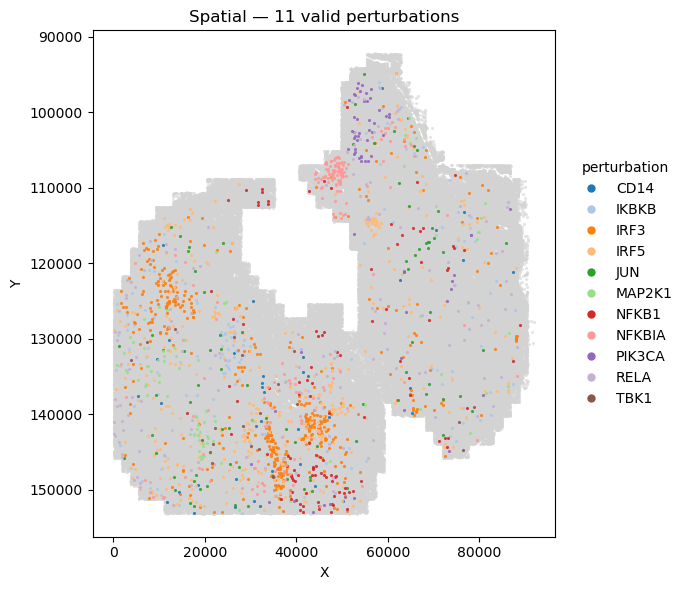

In [29]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, re
from matplotlib.lines import Line2D


# ---------------- File paths ----------------
P               = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
COUNTS_CSV      = "merged_perturbed_xy.csv"          # contains: cell_id, X, Y, ...
PERT_MATRIX_CSV = P/"tumorpooledperturbations.csv"     # rows=genes, cols=cells (or transposed)
MIN_COUNT  = 1


def canon_cell_id(s):
    if pd.isna(s): return None
    s = str(s).strip()
    m = re.match(r'(?i)cell[_\-\s]*(\d+)$', s)
    if m: return f"cell_{int(m.group(1))}"
    try:
        v = float(s)
        if np.isfinite(v) and abs(v-round(v)) < 1e-12:
            return f"cell_{int(round(v))}"
    except: pass
    return s.lower()

# --- load counts ---
df = pd.read_csv(COUNTS_CSV)
df["_canon"] = df["cell_id"].map(canon_cell_id)

# --- load perturbation matrix ---
pm = pd.read_csv(PERT_CSV, index_col=0).apply(pd.to_numeric, errors="coerce").fillna(0.0)
cols_canon = pd.Index([canon_cell_id(c) for c in pm.columns])
rows_canon = pd.Index([canon_cell_id(r) for r in pm.index])
ids = pd.Index(df["_canon"].dropna().unique())
if ids.intersection(rows_canon.dropna()).size > ids.intersection(cols_canon.dropna()).size:
    pm = pm.T
    cols_canon = pd.Index([canon_cell_id(c) for c in pm.columns])
pm_lookup = {canon: orig for orig, canon in zip(pm.columns, cols_canon) if canon is not None}

# --- assign perturbation labels ---
labs = []
for k in df["_canon"]:
    if k is None or k not in pm_lookup:
        labs.append("unassigned"); continue
    col = pm[pm_lookup[k]]
    labs.append(col.idxmax() if col.max() >= MIN_COUNT else "unassigned")
df["perturbation"] = labs

# --- keep only labels that correspond to real genes in counts CSV ---
gene_cols = [c for c in df.columns if c not in {"cell_id","X","Y","_canon","perturbation"}]
gene_set = set(gene_cols)
valid_labels = sorted(set(df["perturbation"]) & gene_set)
df.loc[~df["perturbation"].isin(valid_labels), "perturbation"] = "unassigned"

print(f"Valid labels (n={len(valid_labels)}): {valid_labels}")
print(df["perturbation"].value_counts())

# --- plot ---
cats = sorted(valid_labels)  # only the 11 genes
palette = plt.get_cmap("tab20").colors
color_map = {c: palette[i % len(palette)] for i, c in enumerate(cats)}

x, y = df["X"].to_numpy(), df["Y"].to_numpy()
plt.figure(figsize=(7,6))
ua_mask = (df["perturbation"] == "unassigned").to_numpy()
plt.scatter(x[ua_mask], y[ua_mask], s=5, c="#D3D3D3", alpha=0.6, linewidths=0, zorder=1)

handles = []
for c in cats:
    m = (df["perturbation"] == c).to_numpy()
    if m.any():
        plt.scatter(x[m], y[m], s=5, c=color_map[c], alpha=0.9, linewidths=0, zorder=2)
        handles.append(Line2D([0],[0], marker="o", linestyle="None",
                              markerfacecolor=color_map[c], markeredgecolor="none",
                              markersize=6, label=c))

plt.legend(handles=handles, frameon=False, loc="center left",
           bbox_to_anchor=(1.02,0.5), ncol=1, title="perturbation")

plt.gca().invert_yaxis()
plt.xlabel("X"); plt.ylabel("Y"); plt.title("Spatial — 11 valid perturbations")
plt.tight_layout()
# plt.savefig("spatial_11labels.png", dpi=300, bbox_inches="tight")
plt.show()


---

In [14]:
# 1) how many IDs are usable?
print("non-null df.cell_id:", df["cell_id"].notna().sum(), " / ", len(df))

# 2) peek at a few dataset IDs
print("sample df.cell_id:", df["cell_id"].dropna().astype(str).head(10).tolist())

# 3) pm axis shapes
print("pm shape:", pm.shape, "| rows (genes):", len(pm.index), " cols (cells):", len(pm.columns))
print("sample pm columns:", list(pm.columns[:10]))

# 4) canonicalize helpers
def canon_id(x):
    if pd.isna(x): return None
    s = str(x).strip()
    if s == "" or s.lower() in {"nan","none"}: return None
    try:
        v = float(s)
        if np.isfinite(v) and abs(v-round(v)) < 1e-12: return str(int(round(v)))
    except: pass
    return s

ids_canon = df["cell_id"].map(canon_id)
pm_cols_canon = pd.Index([canon_id(c) for c in pm.columns])

# 5) direct overlap counts
overlap = set(ids_canon.dropna()) & set(pm_cols_canon)
print("overlap(df.cell_id, pm.columns) =", len(overlap))

# 6) if TBK1 exists, how many positive columns BEFORE any labeling?
if "TBK1" in pm.index:
    tbk1_pos = (pm.loc["TBK1"] > 0).sum()
    print("TBK1 columns with >0 in pm:", tbk1_pos)
else:
    print("TBK1 not present in pm.index")


non-null df.cell_id: 9432  /  187215
sample df.cell_id: ['cell_1', 'cell_2', 'cell_3', 'cell_4', 'cell_5', 'cell_6', 'cell_7', 'cell_8', 'cell_9', 'cell_10']
pm shape: (36, 9432) | rows (genes): 36  cols (cells): 9432
sample pm columns: ['Cell_1', 'Cell_2', 'Cell_3', 'Cell_4', 'Cell_5', 'Cell_6', 'Cell_7', 'Cell_8', 'Cell_9', 'Cell_10']
overlap(df.cell_id, pm.columns) = 0
TBK1 columns with >0 in pm: 24


In [24]:
!pip3 install leidenalg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 4.6 MB/s  0:00:00 eta 0:00:01


In [17]:
import pandas as pd
from pathlib import Path

# ---- base path ----
P = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")

# ---- load ----
tumor  = pd.read_csv(P/"tumorMerfish.csv")
tumpt  = pd.read_csv(P/"tumorpooledperturbations.csv")

# ---- tumorMerfish gene set ----
meta_like = {"cell_id","id","index"}
tumor_genes = {str(c) for c in tumor.columns if str(c).lower() not in meta_like}

# ---- candidate perturbation genes ----
# Case 1: genes as columns
cols_genes = {str(c) for c in tumpt.columns if str(c).lower() not in meta_like}

# Case 2: genes in first column (rows)
rows_genes = set(tumpt.iloc[:, 0].astype(str).tolist())

# Pick the orientation that has bigger overlap with tumorMerfish
over_cols = len(cols_genes & tumor_genes)
over_rows = len(rows_genes & tumor_genes)
pert_genes = cols_genes if over_cols >= over_rows else rows_genes
source = "columns" if pert_genes is cols_genes else "first column"

# ---- find only those not in tumorMerfish ----
missing_in_tumor = sorted(pert_genes - tumor_genes)

print(f"Perturbation genes detected from {source}.")
print(f"Total perturbation genes: {len(pert_genes)}")
print(f"Total tumorMerfish genes: {len(tumor_genes)}")
print(f"Overlap: {len(pert_genes & tumor_genes)}")
print(f"Genes in perturbation table but NOT in tumorMerfish: {len(missing_in_tumor)}")

# show a preview
print(f"\n {len(missing_in_tumor)} missing genes:")
print(missing_in_tumor)

Perturbation genes detected from first column.
Total perturbation genes: 36
Total tumorMerfish genes: 500
Overlap: 11
Genes in perturbation table but NOT in tumorMerfish: 25

 25 missing genes:
['CHUK', 'Control', 'IRAK1', 'IRAK4', 'IRF7', 'LBP', 'LY96', 'MAP2K2', 'MAP2K3', 'MAP2K4', 'MAP2K6', 'MAP2K7', 'MAP3K7', 'MAPK14', 'MYD88', 'PELI1', 'RIPK1', 'TAB1', 'TAB2', 'TICAM1', 'TIRAP', 'TLR4', 'TRADD', 'TRAF6', 'TRAM1']


In [31]:
import pandas as pd

# ---- base path ----
P = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")

# ===== edit file name here =====
fname = P/"allcellsPerturbationTable.csv"

# read
df = pd.read_csv(fname)

# keep only numeric values
num = df.apply(pd.to_numeric, errors="coerce").fillna(0)

# ---- row sums ----
row_sums = num.sum(axis=1)
rows_eq1 = (row_sums >= 1).sum()
row_max = row_sums.max()
row_min = row_sums.min()

# ---- column sums ----
col_sums = num.sum(axis=0)
cols_eq1 = (col_sums >= 1).sum()
col_max = col_sums.max()
col_min = col_sums.min()

print(f"File: {fname}")
print(f"Total rows: {len(num)}, rows with sum == 1: {rows_eq1}")
print(f"Row sums -> min: {row_min}, max: {row_max}")

print(f"Total cols: {num.shape[1]}, cols with sum == 1: {cols_eq1}")
print(f"Col sums -> min: {col_min}, max: {col_max}")


File: /Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables/allcellsPerturbationTable.csv
Total rows: 187214, rows with sum == 1: 12749
Row sums -> min: 0, max: 3
Total cols: 77, cols with sum == 1: 76
Col sums -> min: 0, max: 2822


---

### What dataset you have

1. **Counts table (`matched_merfishcounttable_xy.csv`)**

   * Each row = one **cell**.
   * Columns include:

     * `cell_id` → the identifier of the cell (like C123).
     * `X`, `Y` → spatial coordinates of the cell.
     * All other columns = **gene expression counts**.

2. **Perturbation matrix (`tumorpooledperturbations.csv`)**

   * A design table showing which **perturbation** each cell received.
   * Rows (or columns) = perturbation labels:

     * **“control”** (unperturbed reference cells).
     * **Genes** (like TP53, MYC, etc.) representing the gene knockdown/perturbation applied.
   * The other dimension = **cell IDs**.
   * Values = 0 or >0, showing whether a cell belongs to that perturbation.


### How to know the perturbation

* For each `cell_id` in the counts table:

  1. Look it up in the perturbation matrix.
  2. If the corresponding entry is positive in a **gene row**, the cell is labeled with that **gene perturbation**.
  3. If the positive entry is in the **control row**, the cell is labeled as **control**.
  4. If nothing matches, the cell is labeled **unknown** (dropped later).


### Simple Example

Suppose:

* In counts table → `cell_id = C101`.
* In perturbation matrix → column `C101` has value `1` under row `TP53`.
  Then:
* **C101 is a TP53-perturbed cell**.

If instead the only nonzero is under row `control`, then:

* **C101 is a control cell**.


### By perturb

Cell count per perturbation gene (desc):
Control: 4264
IRF3: 459
IRF5: 410
IRAK4: 398
IRF7: 330
MAP2K2: 325
MAP2K6: 311
MAP2K3: 247
PELI1: 223
LBP: 210
NFKBIA: 184
IRAK1: 179
TAB2: 167
RELA: 162
TRAM1: 156
MYD88: 148
IKBKB: 139
RIPK1: 128
TIRAP: 123
NFKB1: 113
CHUK: 95
MAP2K1: 85
JUN: 84
TLR4: 69
MAP2K7: 67
PIK3CA: 66
TRAF6: 63
CD14: 40
LY96: 33
MAP3K7: 30
TICAM1: 30
TRADD: 29
TBK1: 22
TAB1: 21
MAPK14: 20
MAP2K4: 2

Number of perturbed genes (excl. Control): 35



/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cm)


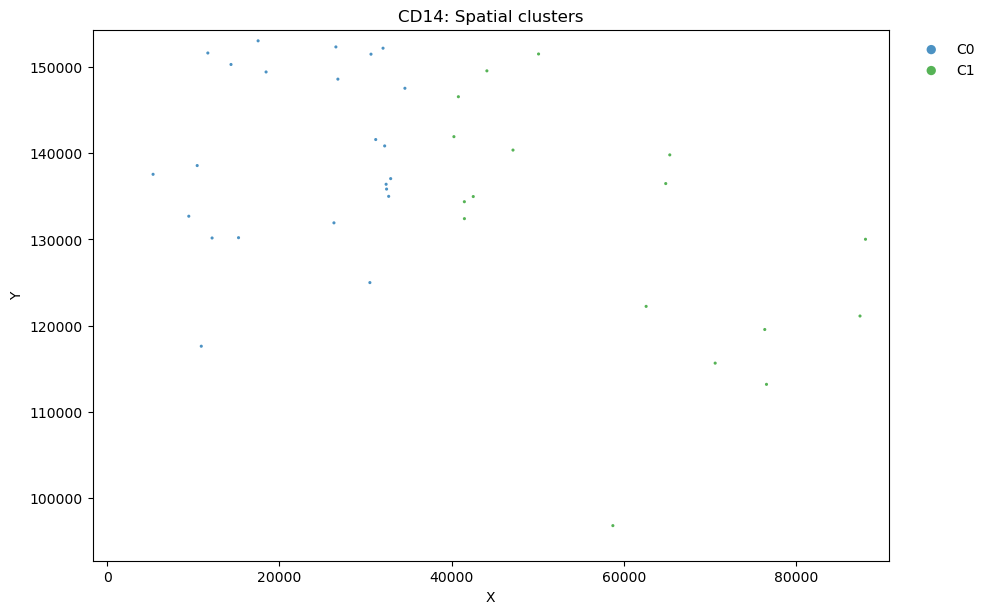

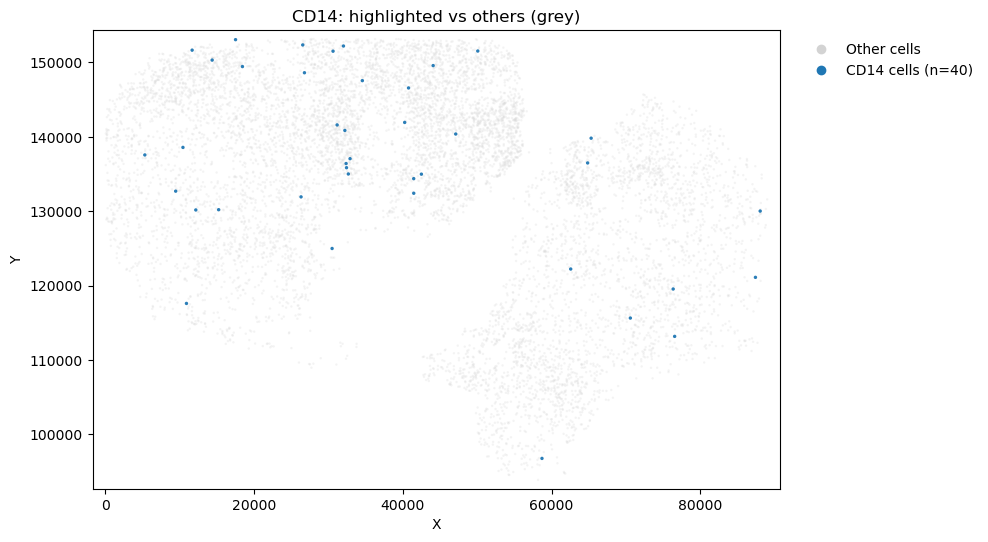

178
[CD14] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

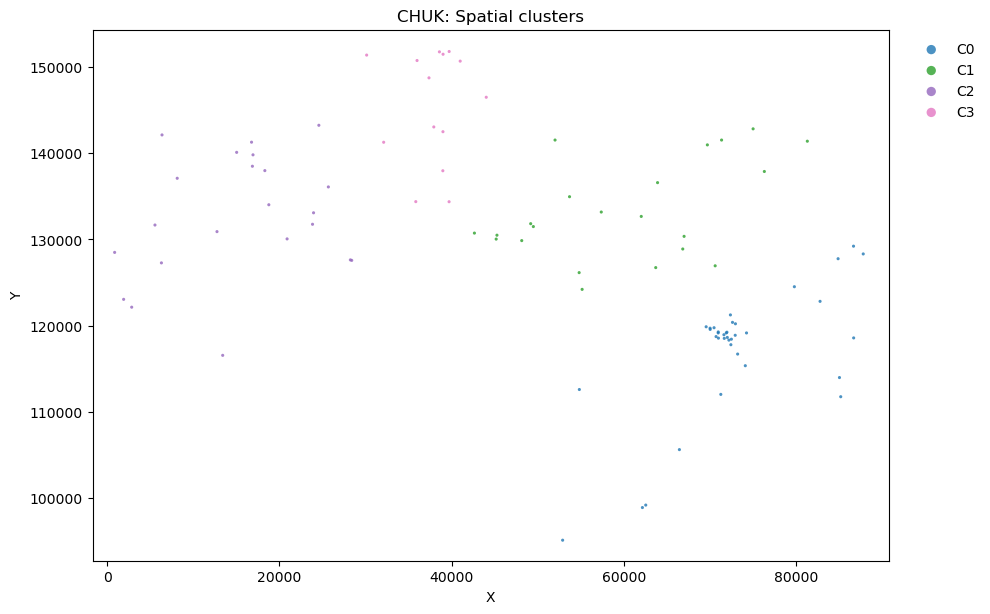

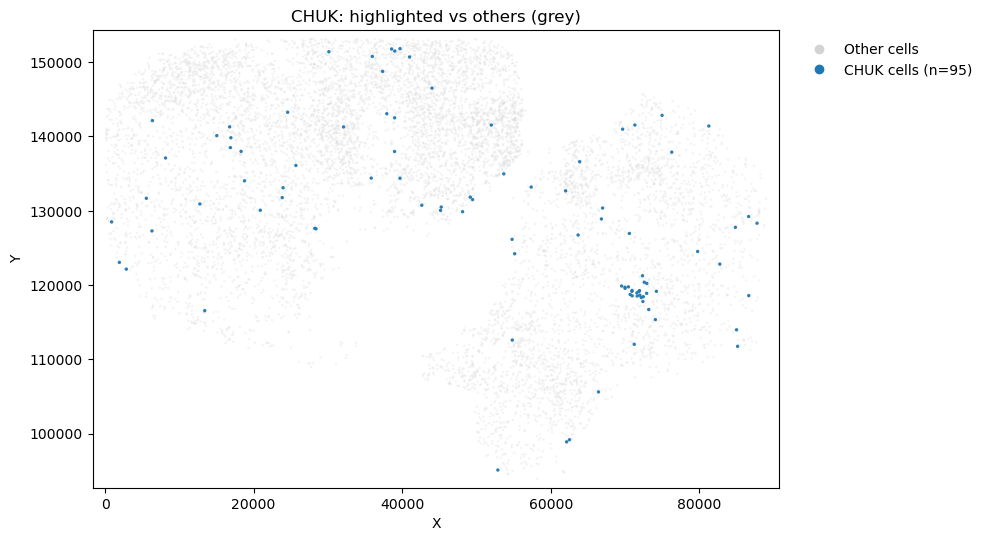

232
[CHUK] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

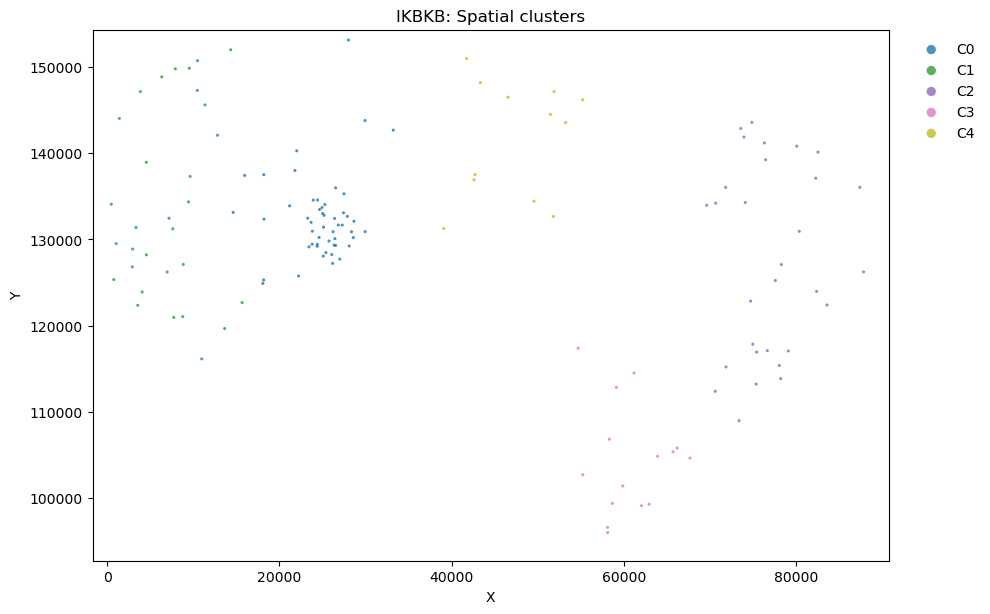

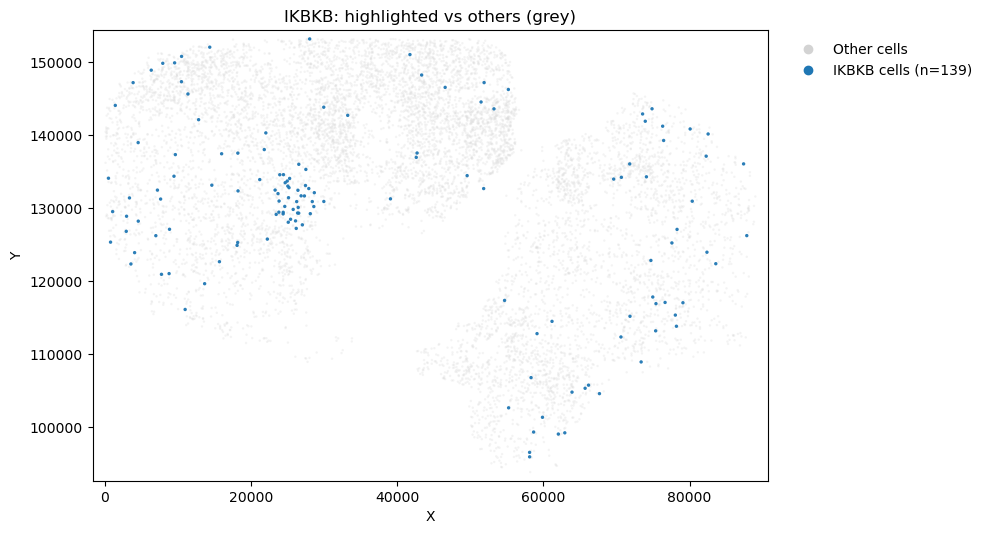

274
[IKBKB] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

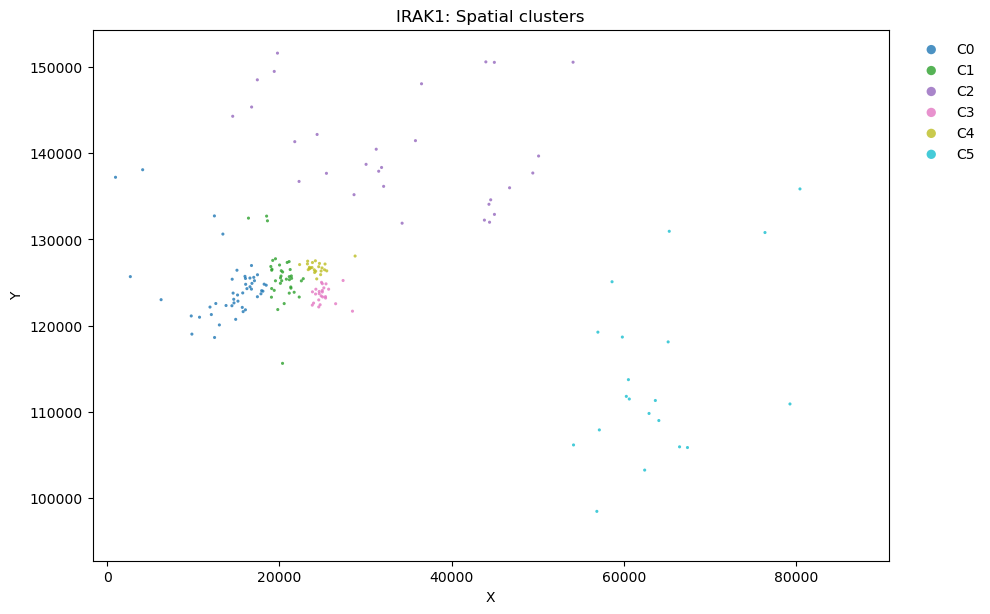

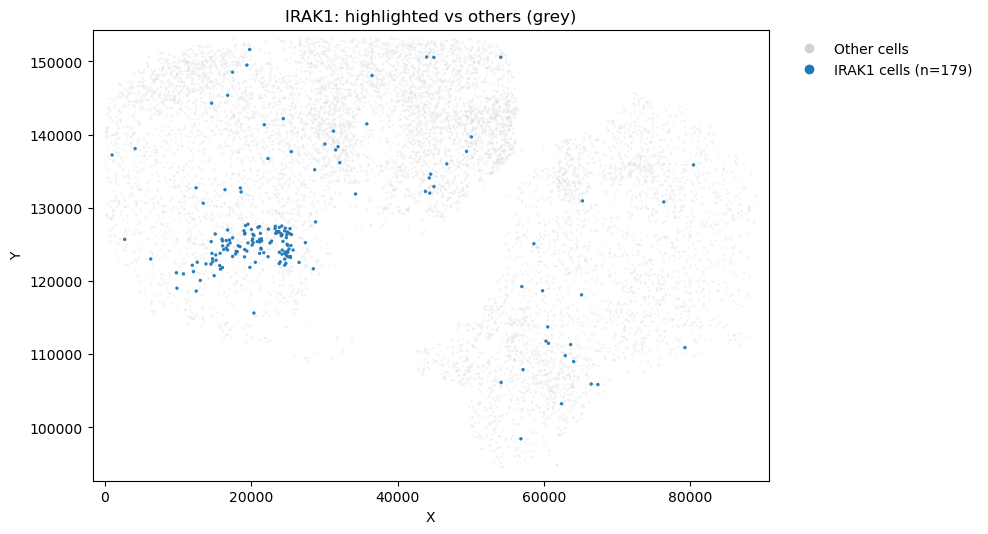

282
[IRAK1] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

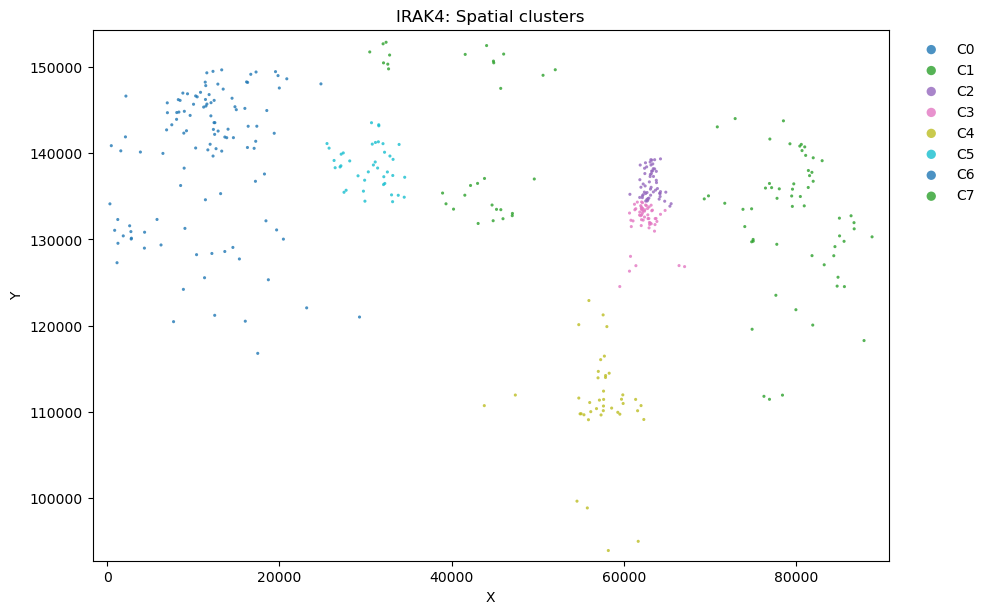

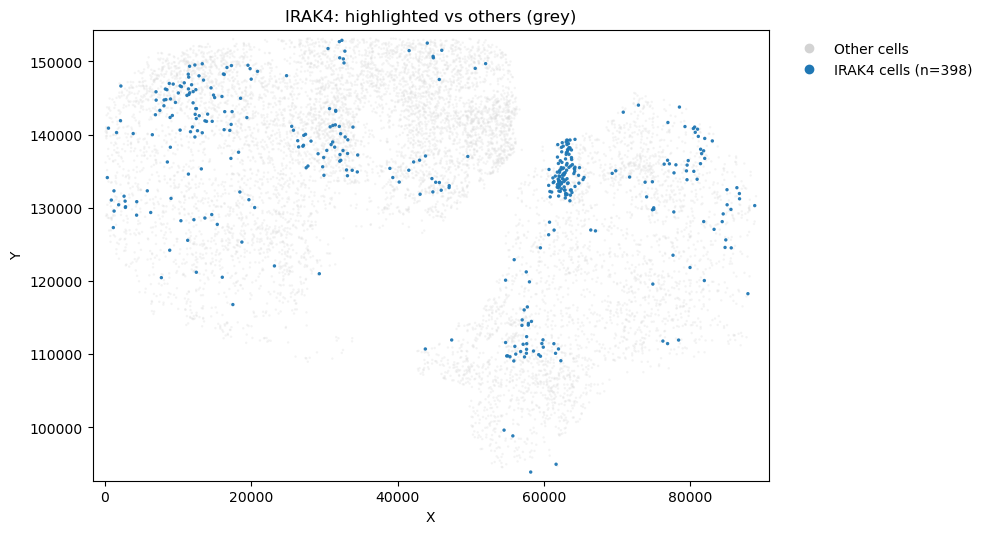

433
[IRAK4] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

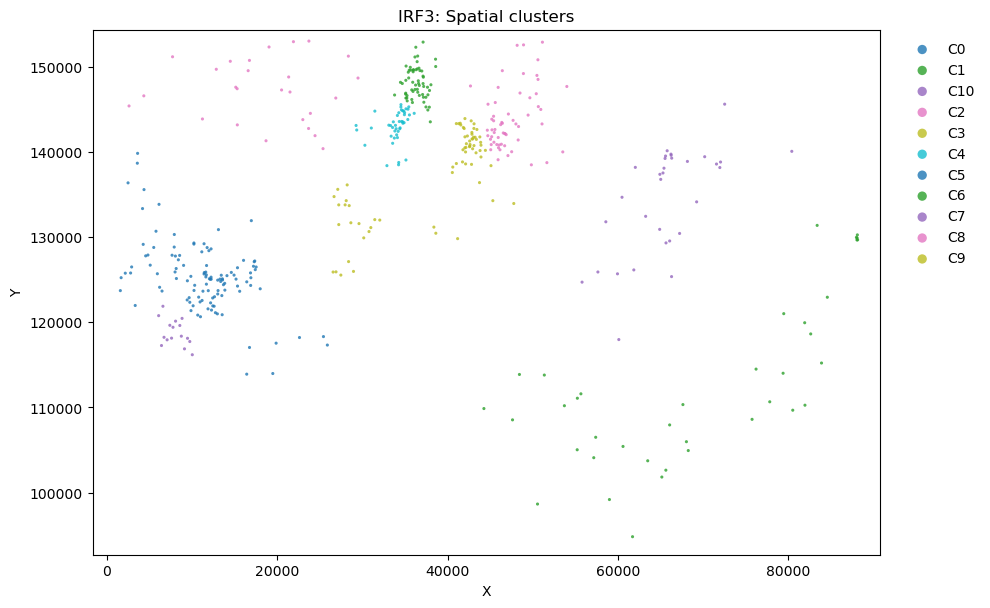

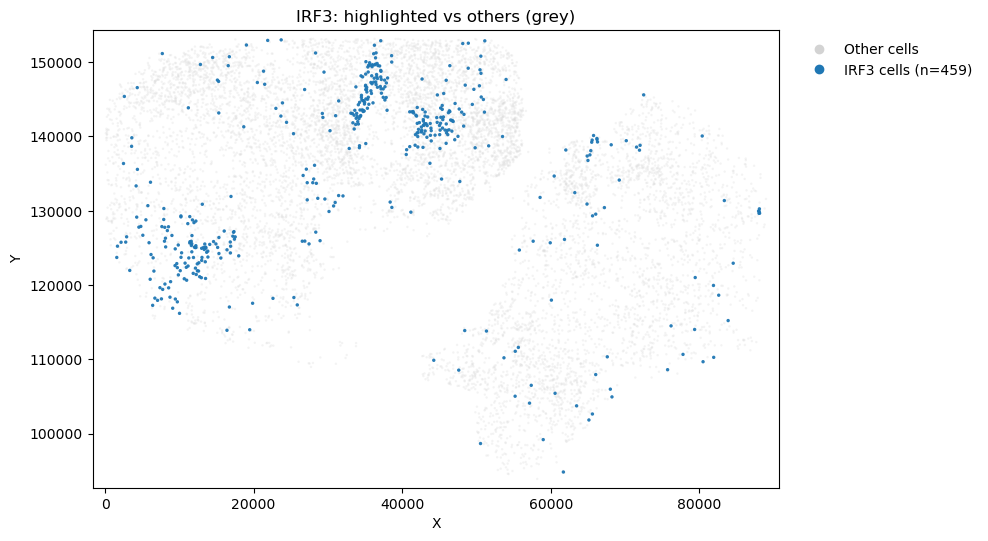

442
[IRF3] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

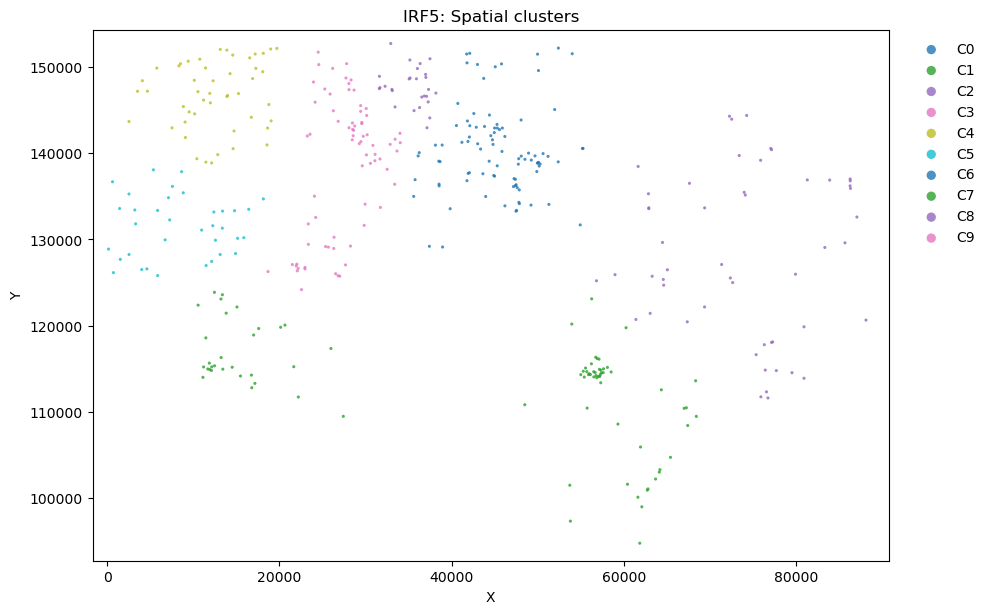

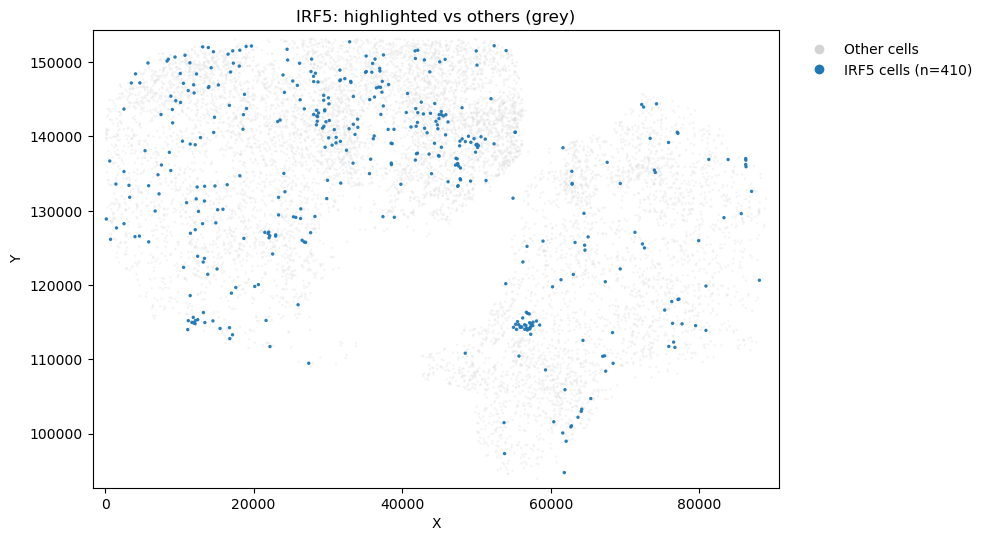

417
[IRF5] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

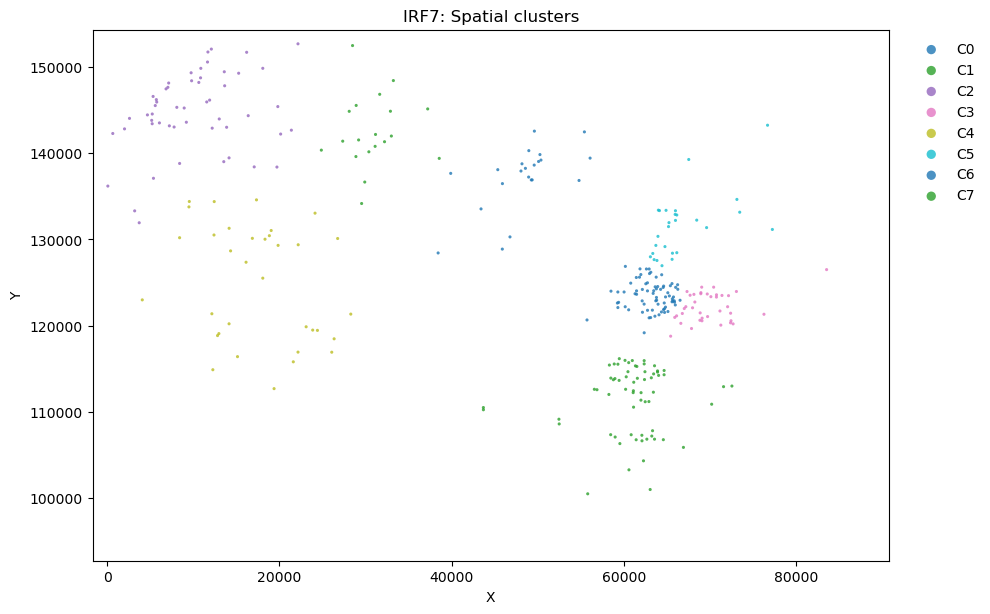

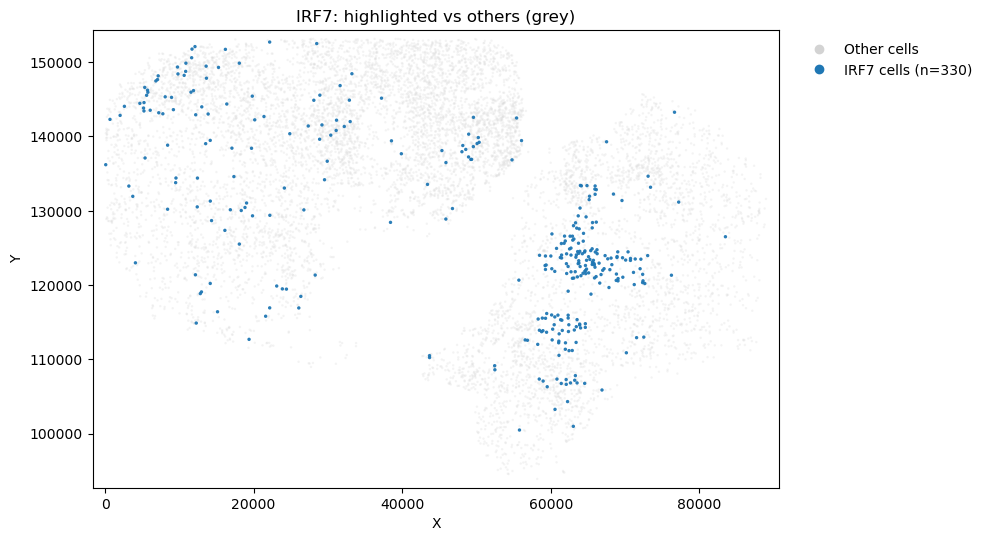

388
[IRF7] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

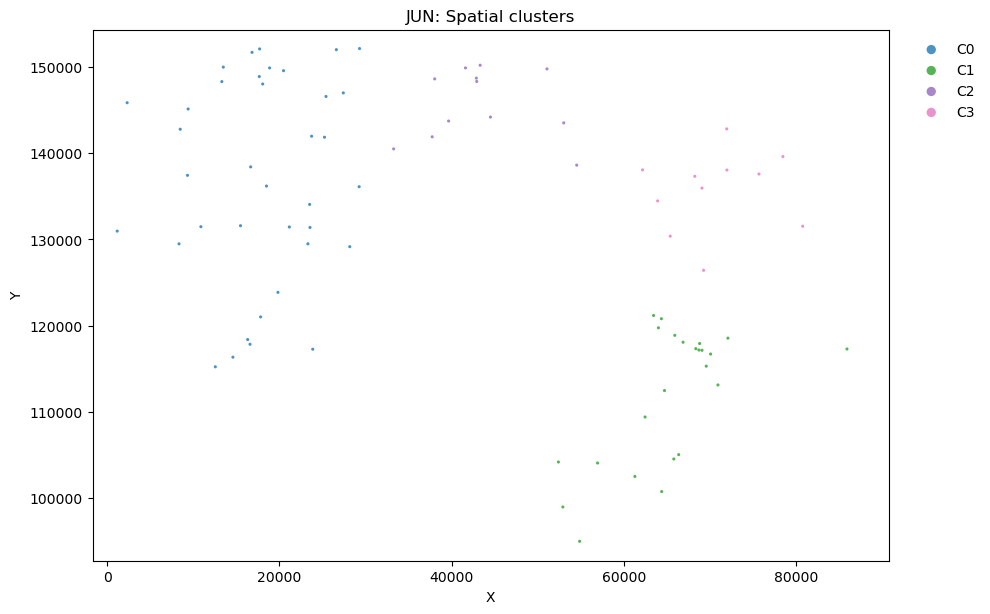

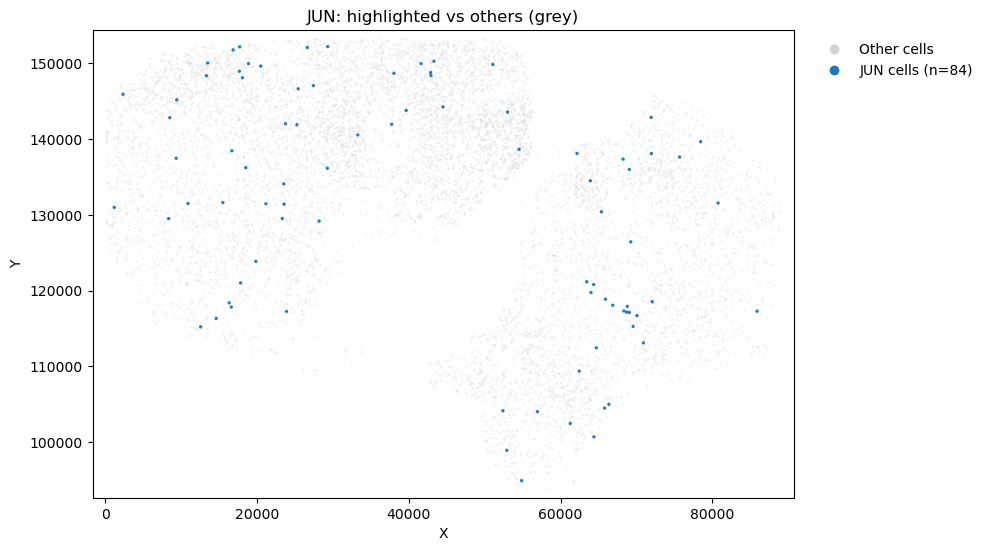

236
[JUN] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

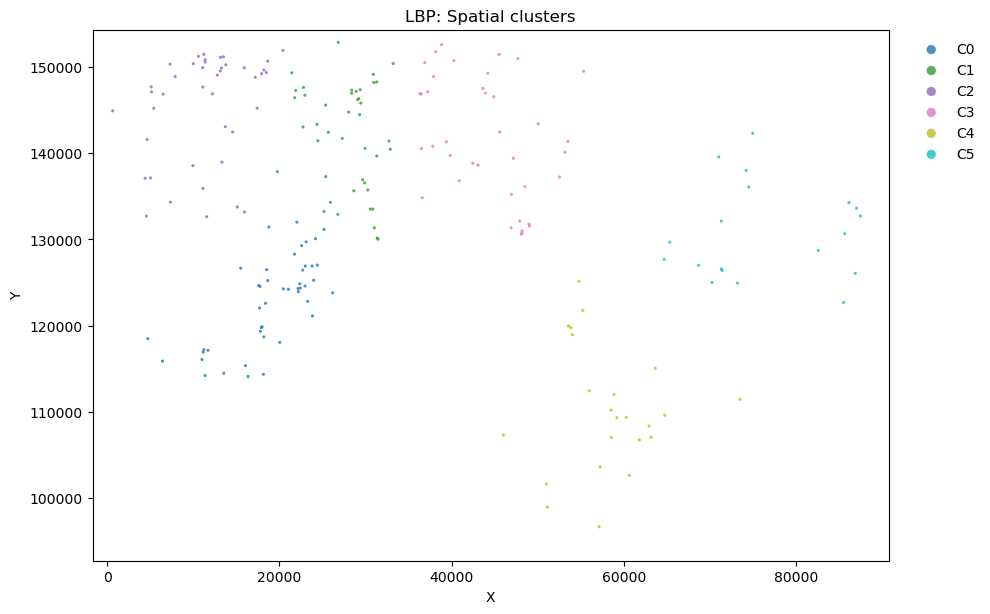

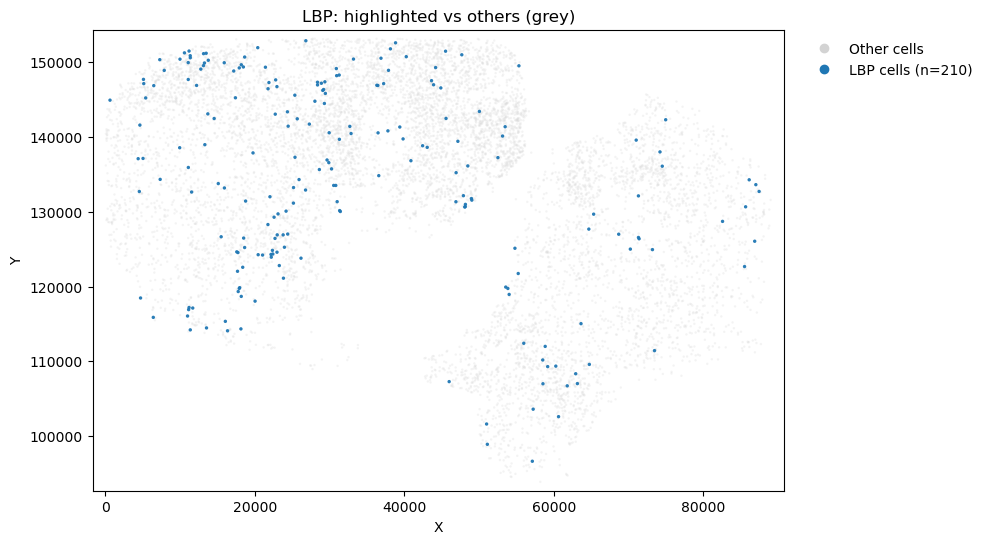

321
[LBP] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

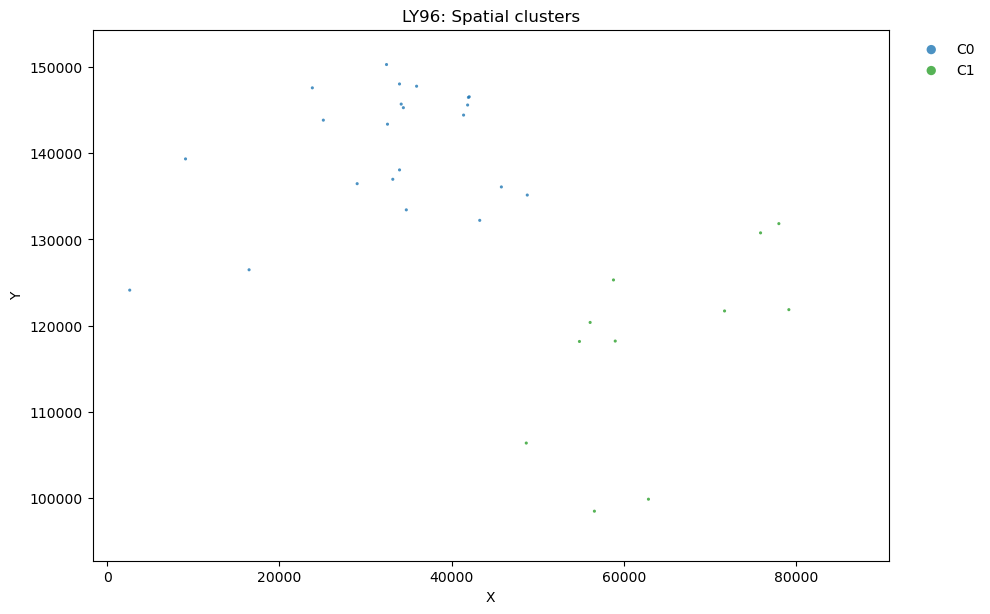

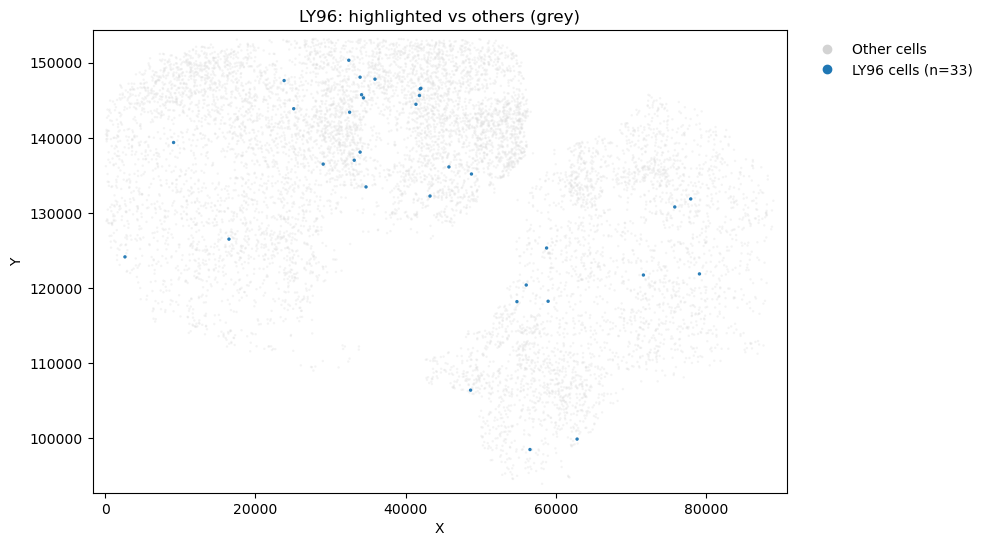

154
[LY96] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

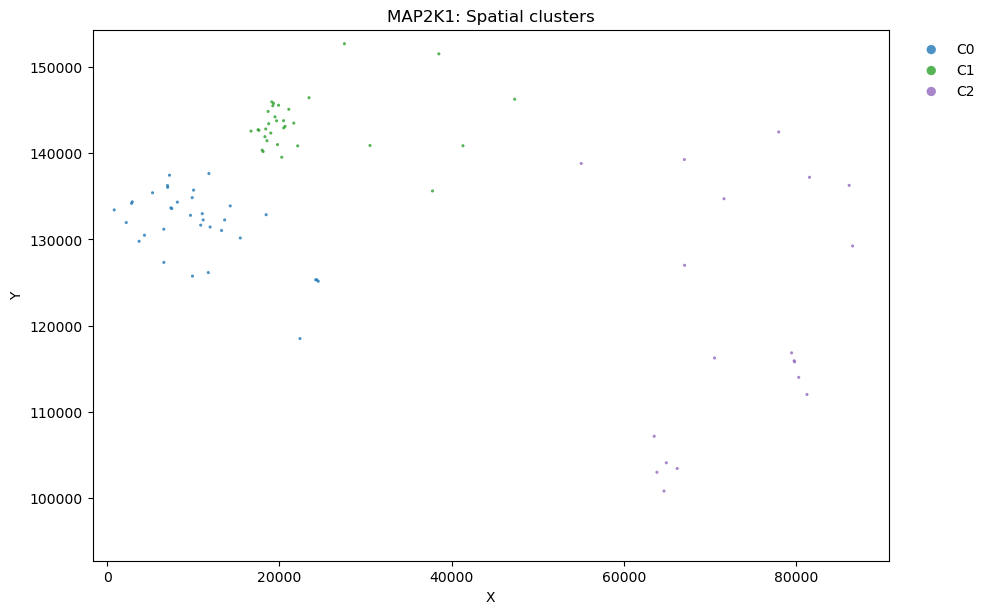

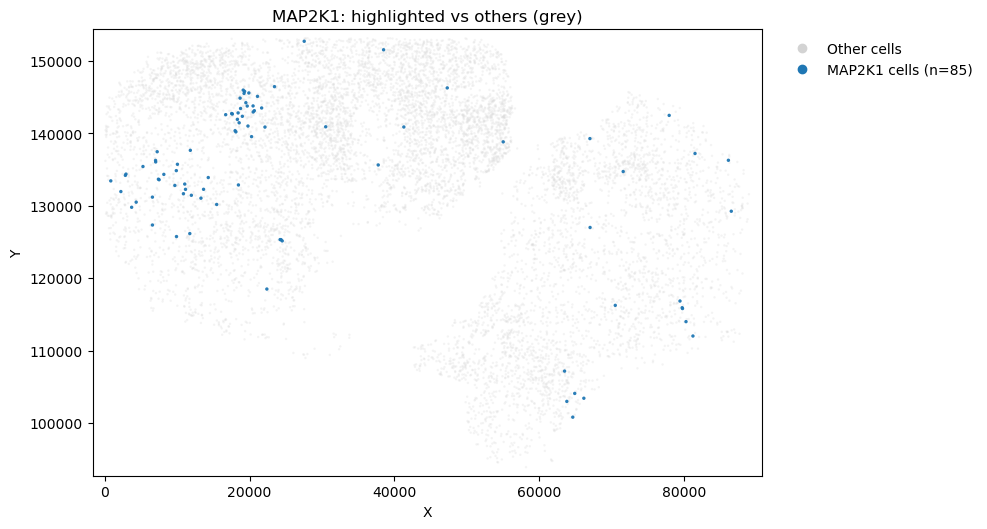

234
[MAP2K1] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

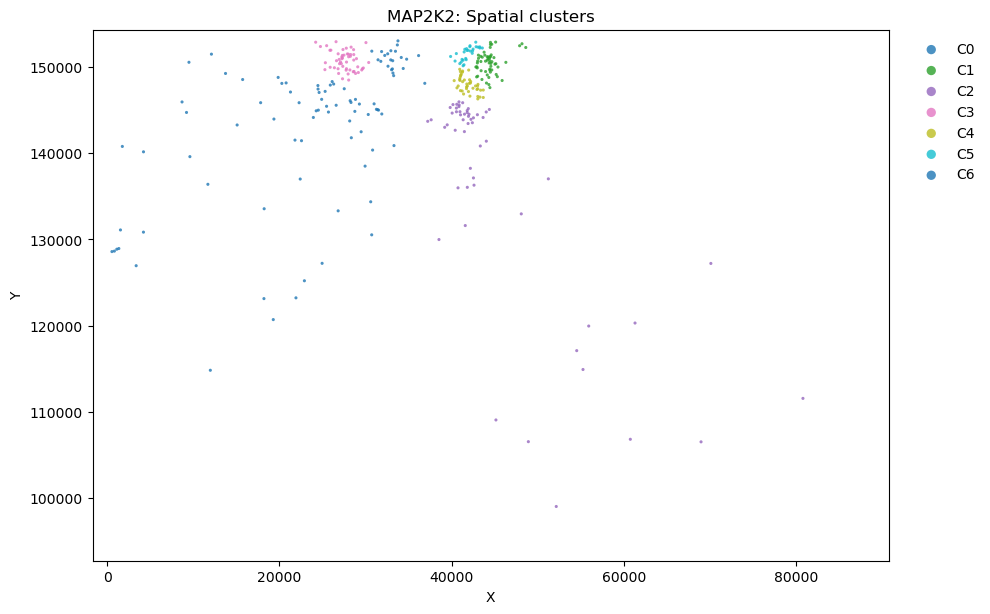

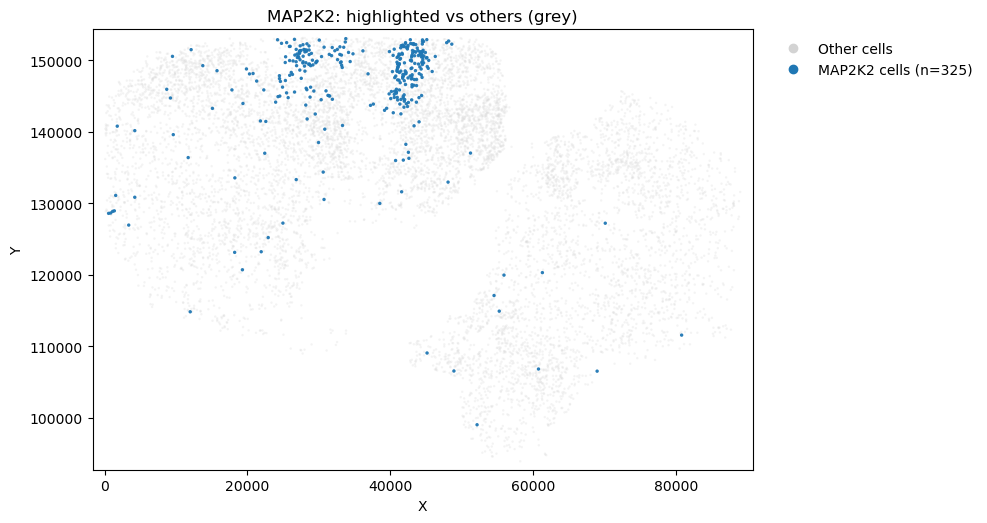

418
[MAP2K2] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

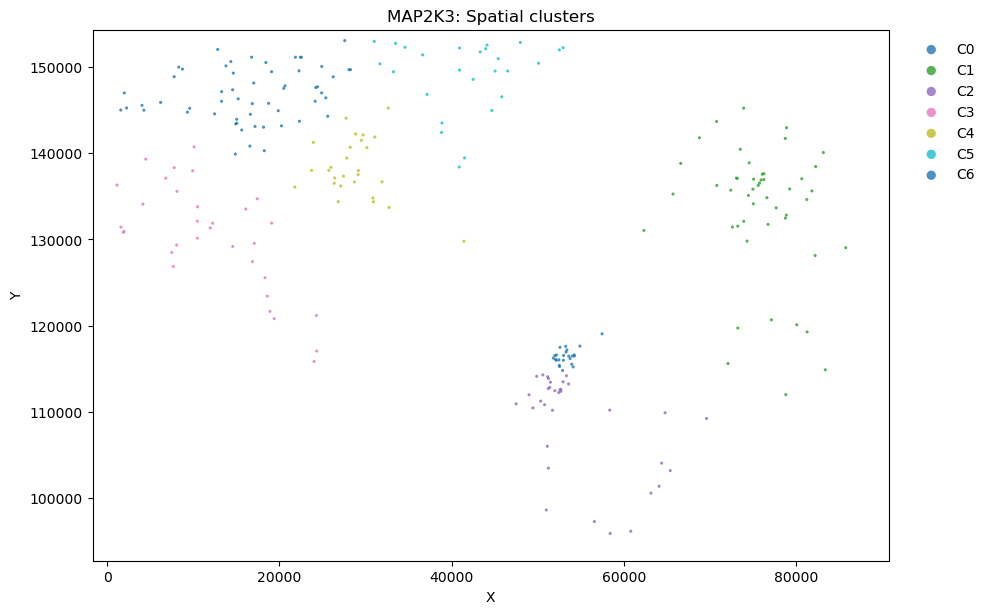

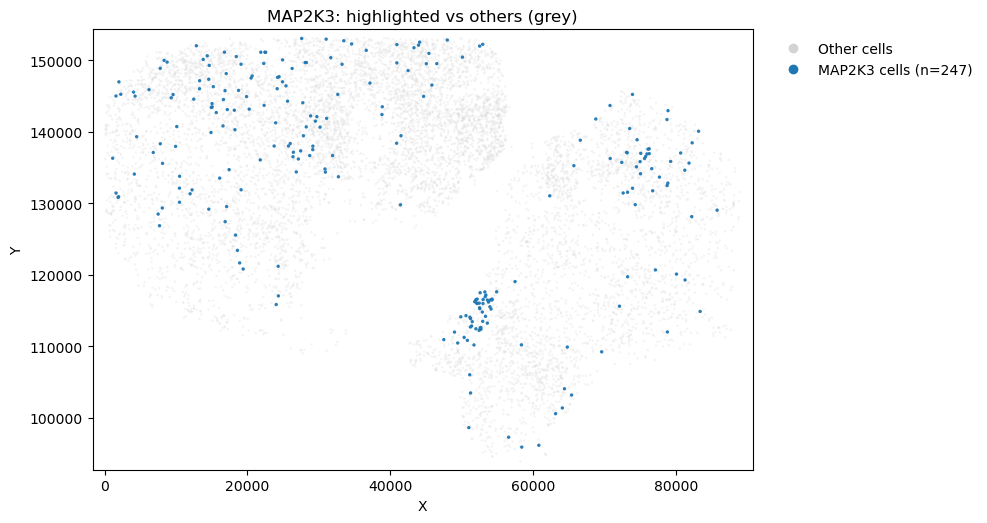

361
[MAP2K3] saved plots + DE
[MAP2K4] <10 cells → assigned single cluster '0'; DE skipped


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

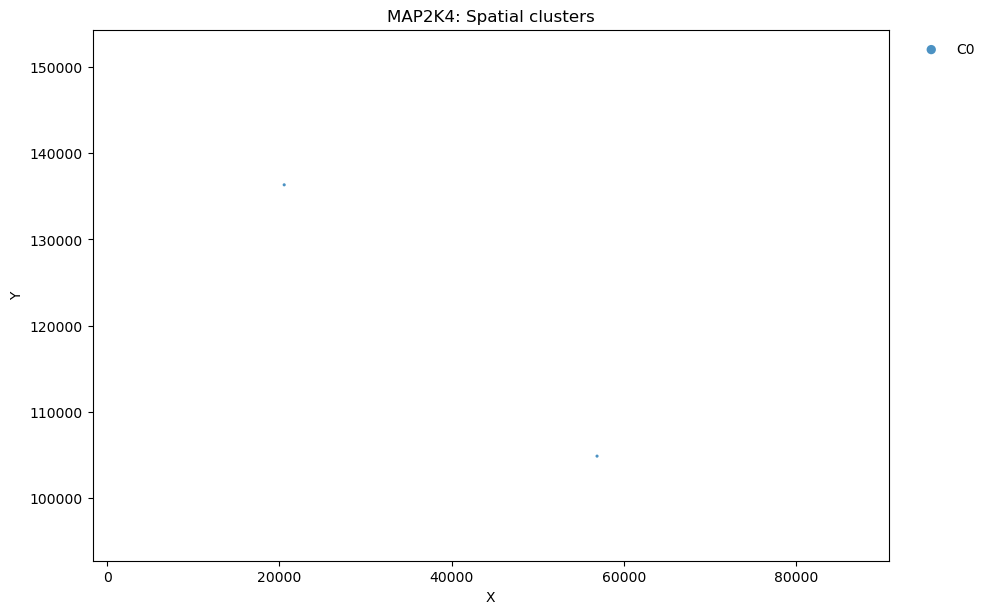

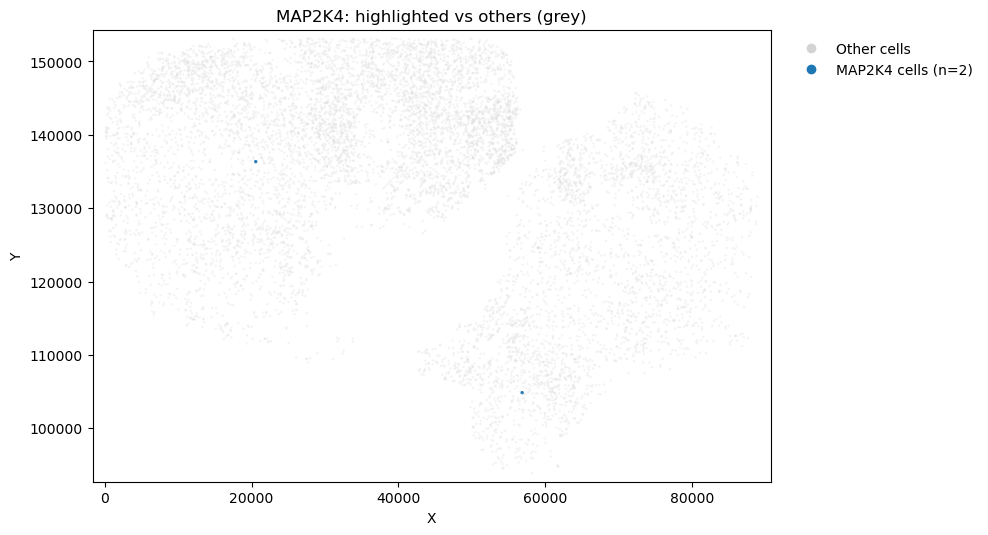

/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cm)


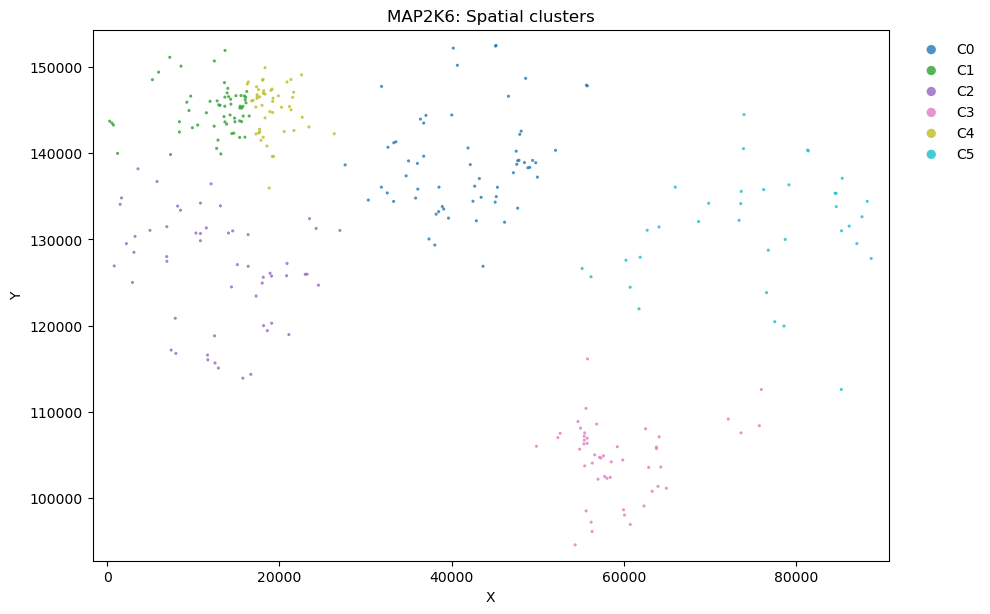

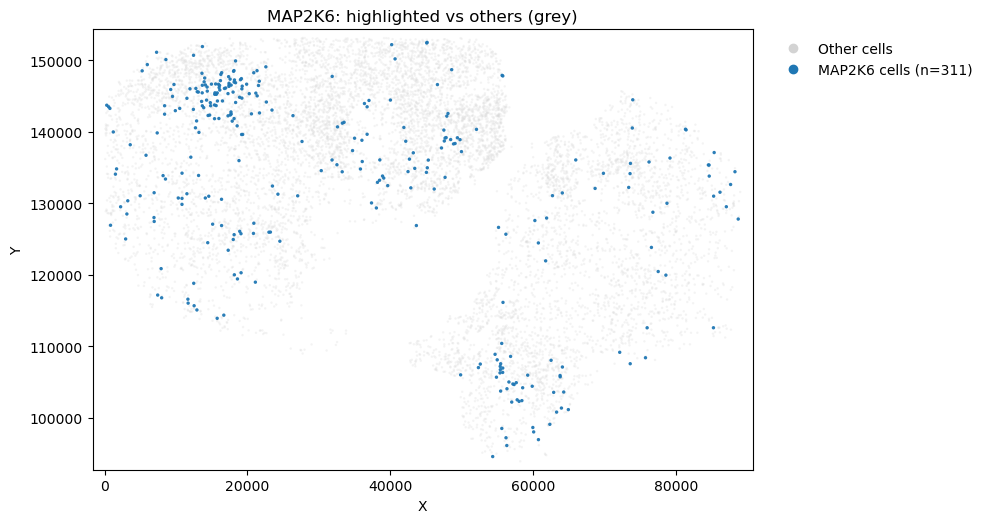

392
[MAP2K6] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to

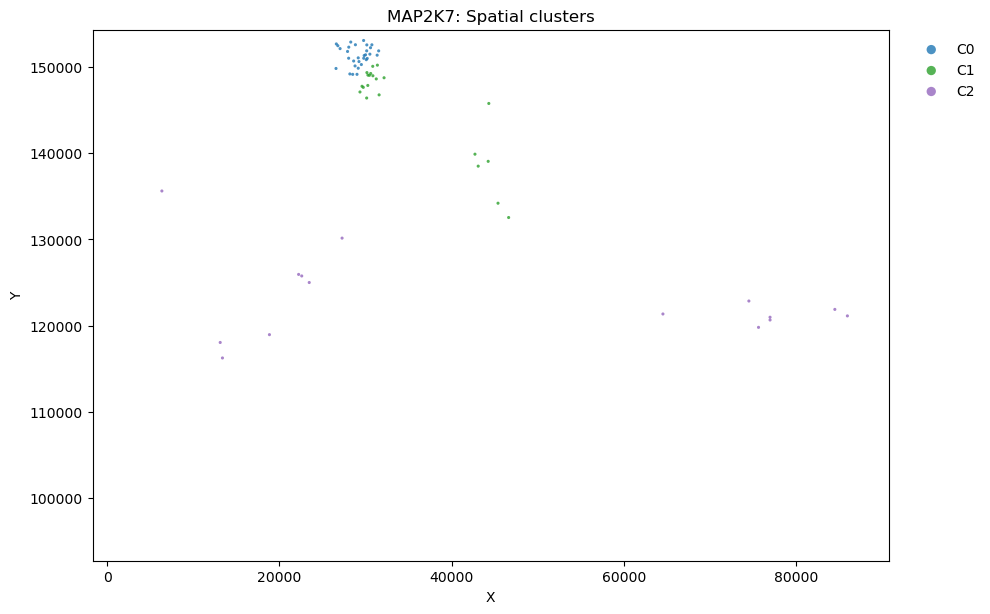

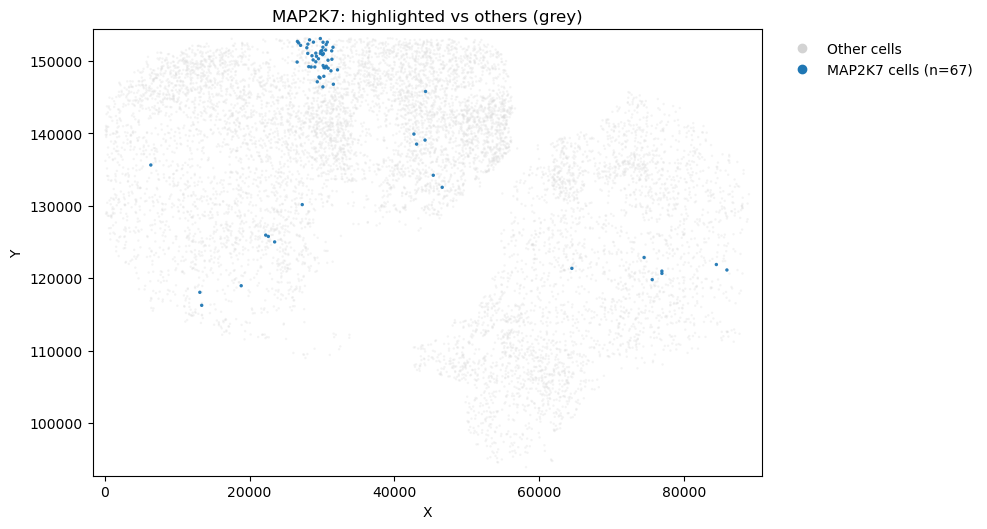

206
[MAP2K7] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

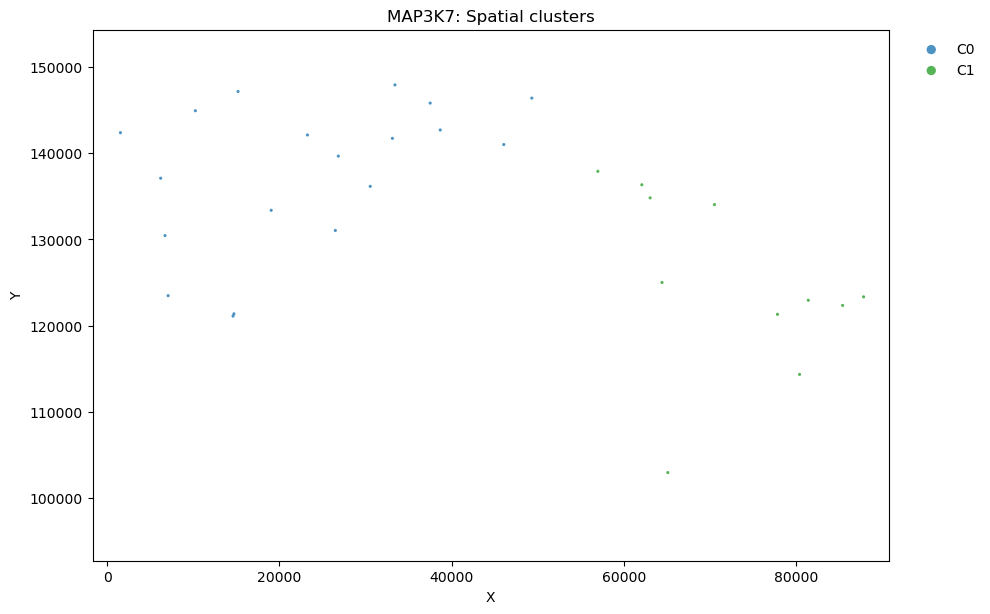

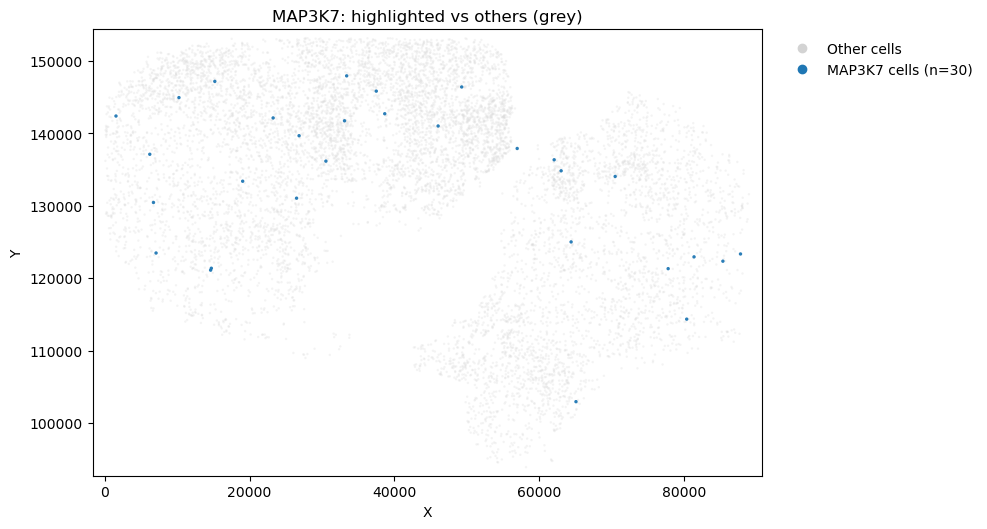

128
[MAP3K7] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to

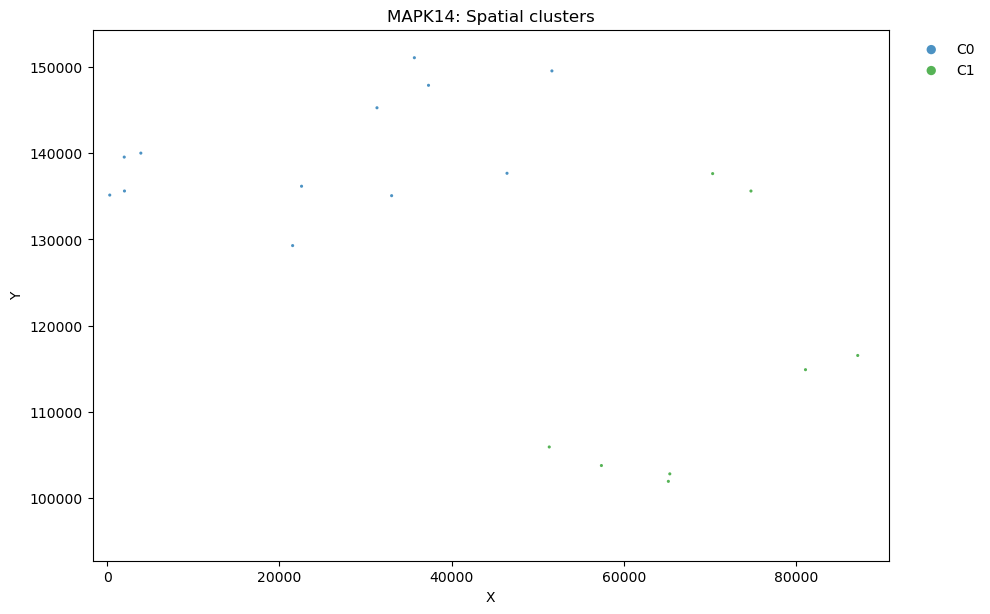

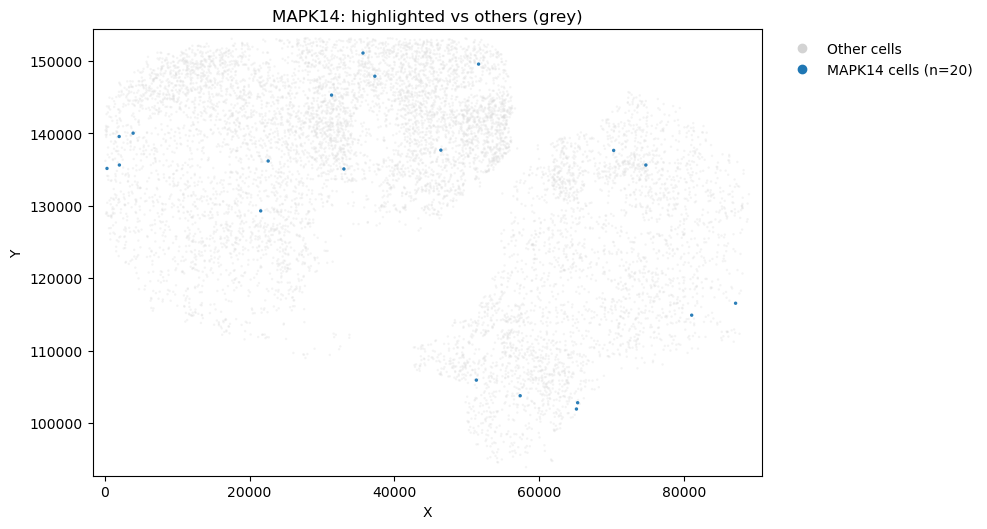

123
[MAPK14] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

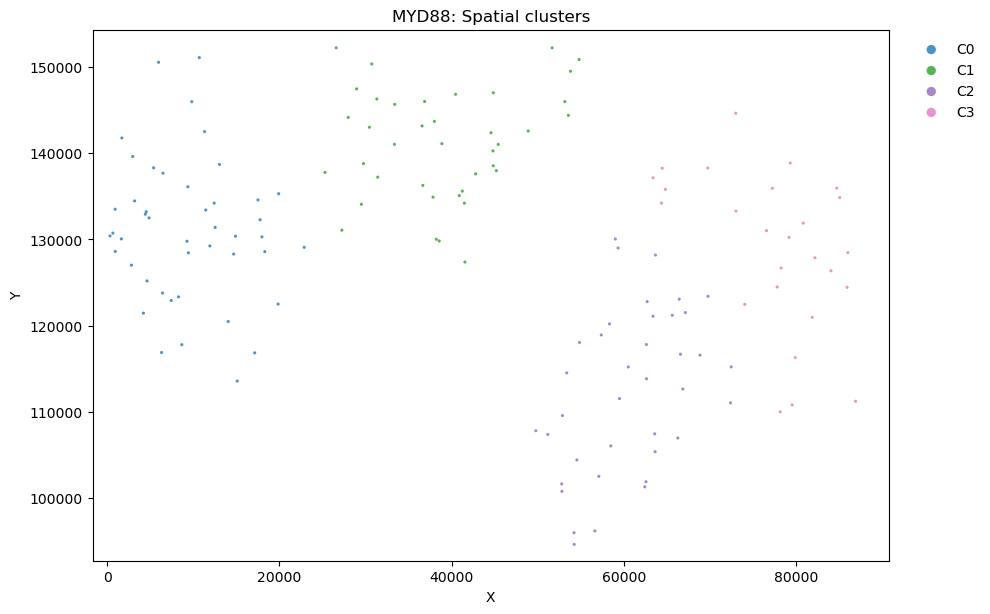

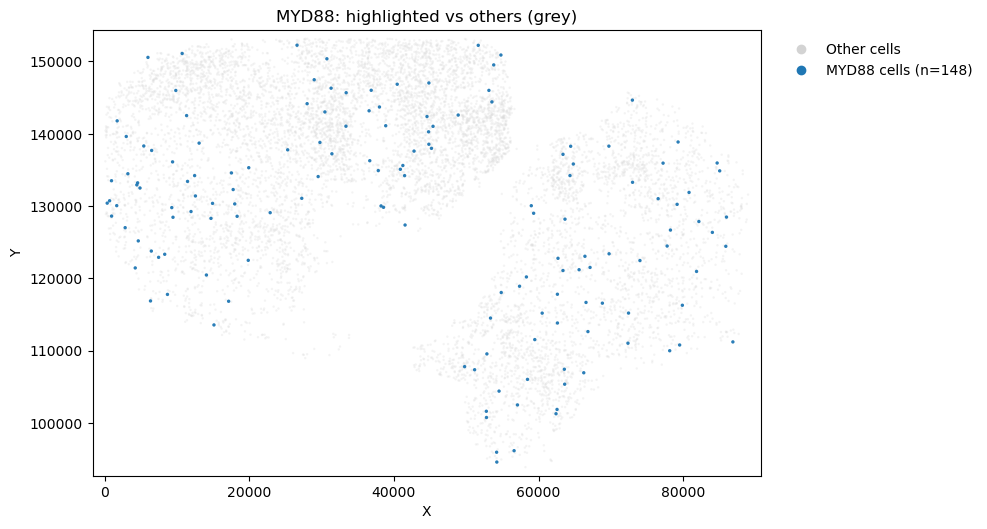

282
[MYD88] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

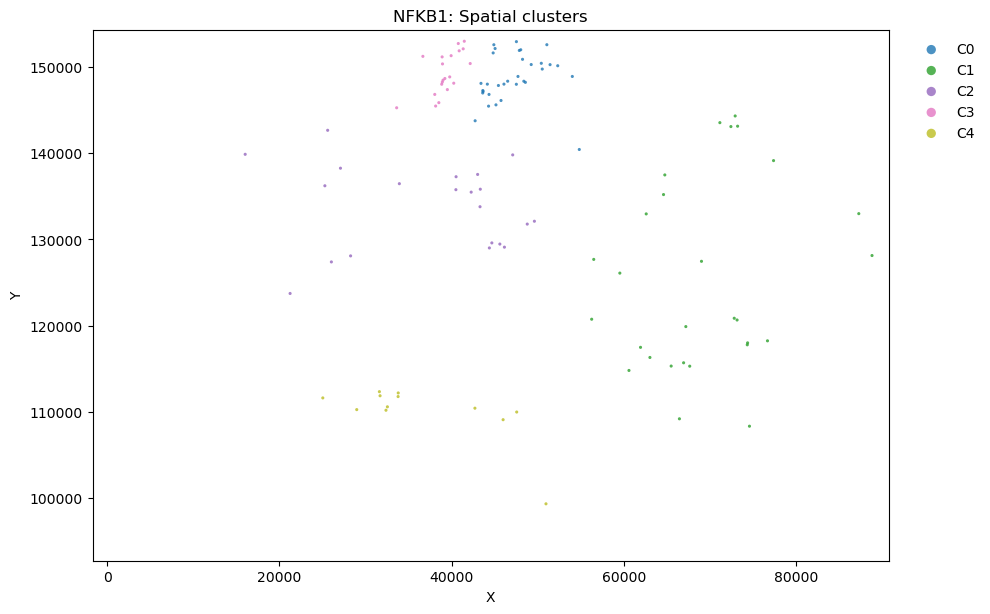

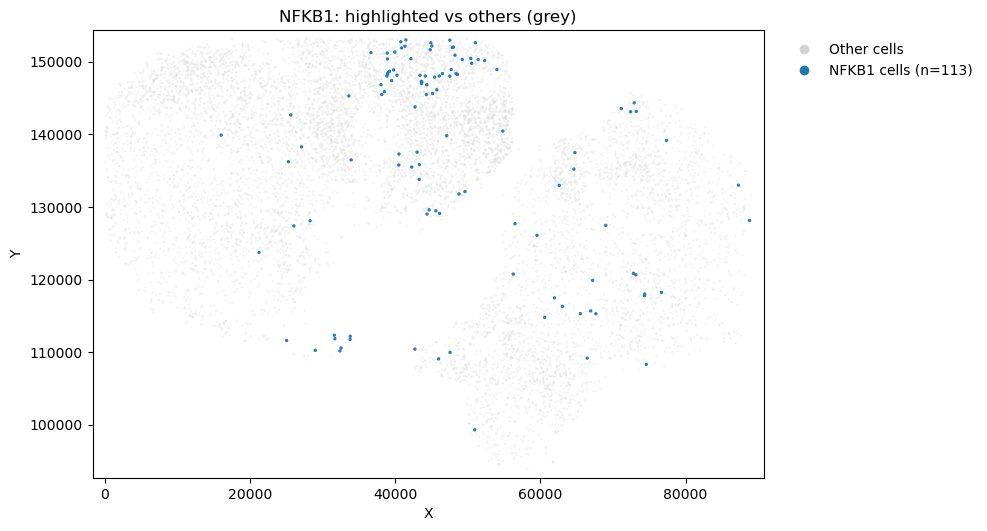

254
[NFKB1] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

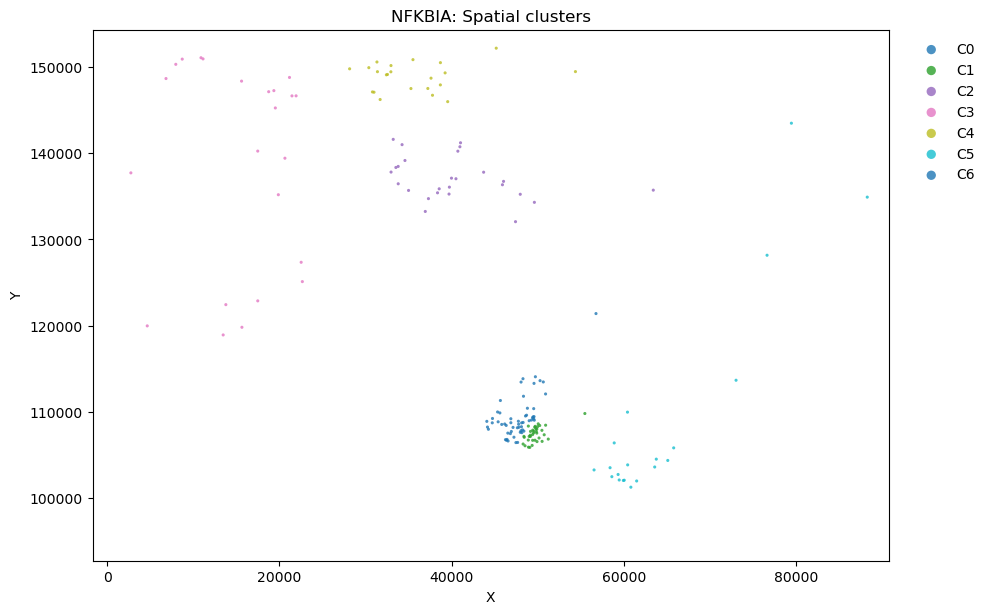

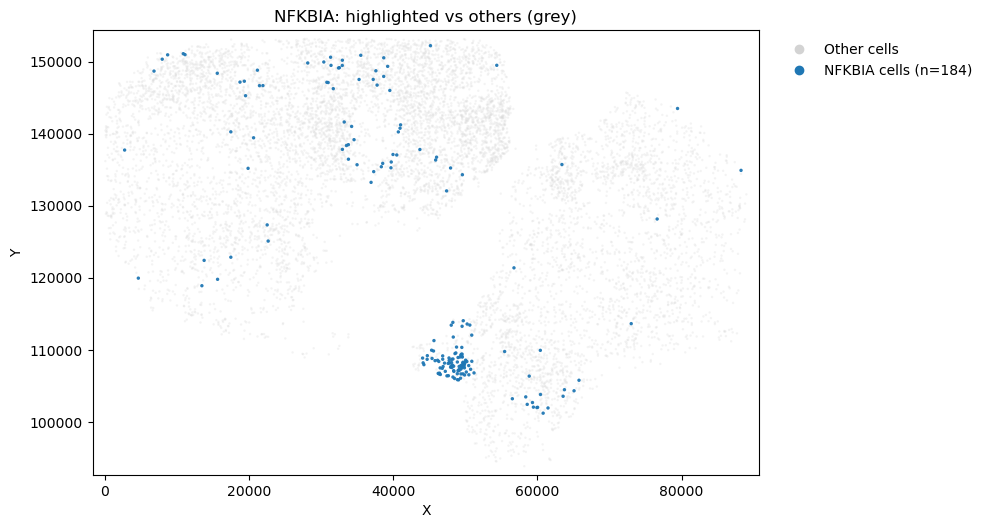

288
[NFKBIA] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

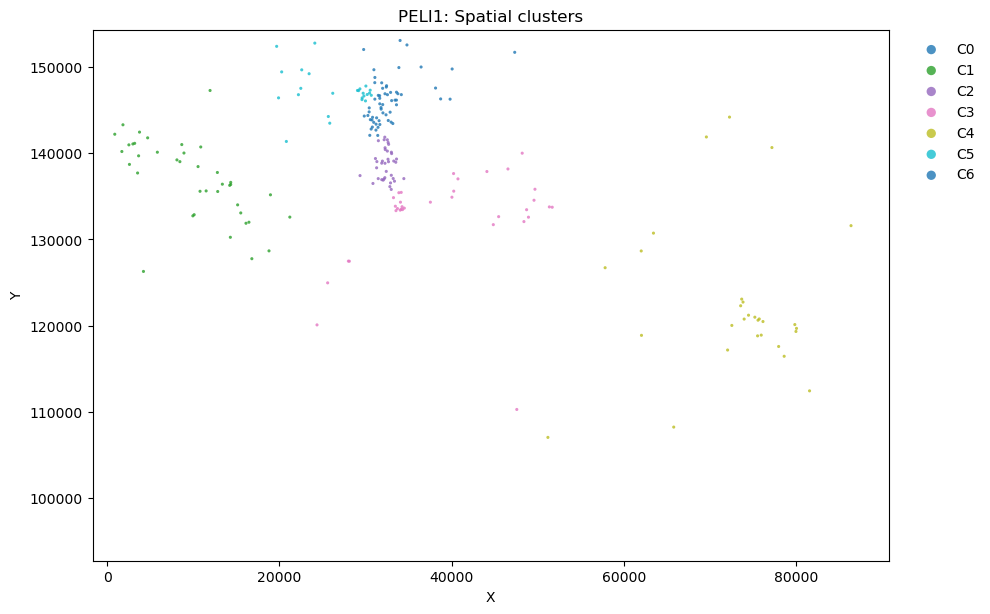

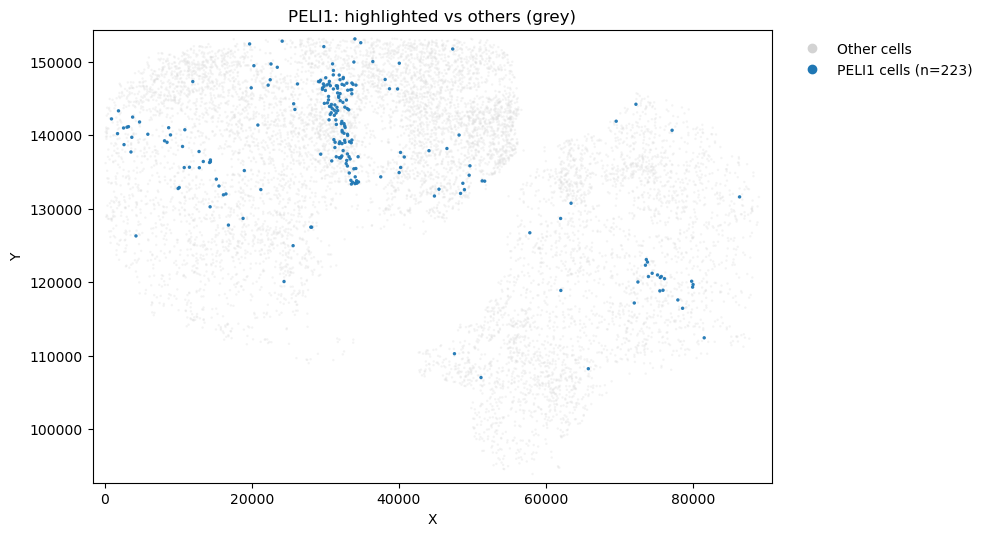

333
[PELI1] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

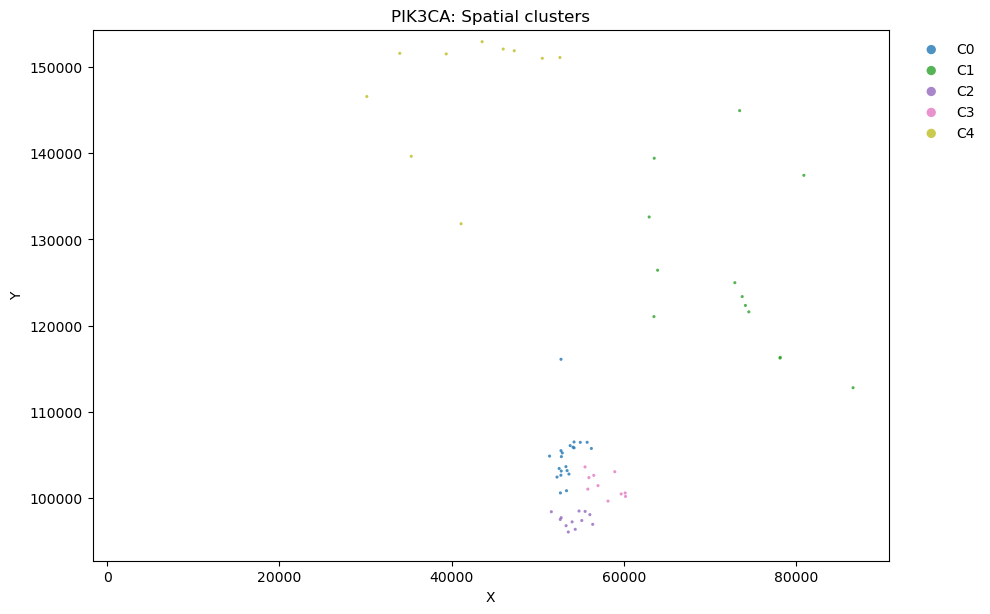

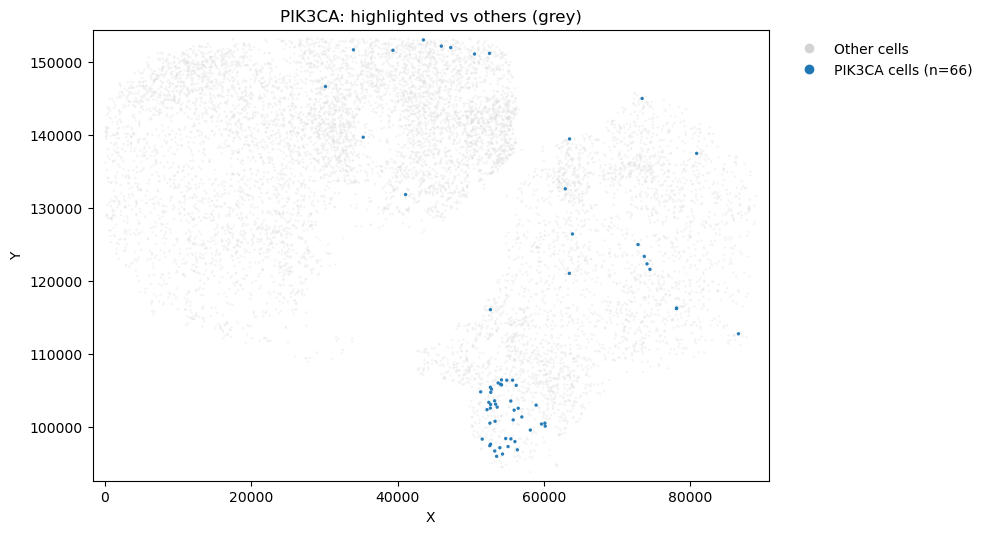

197
[PIK3CA] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

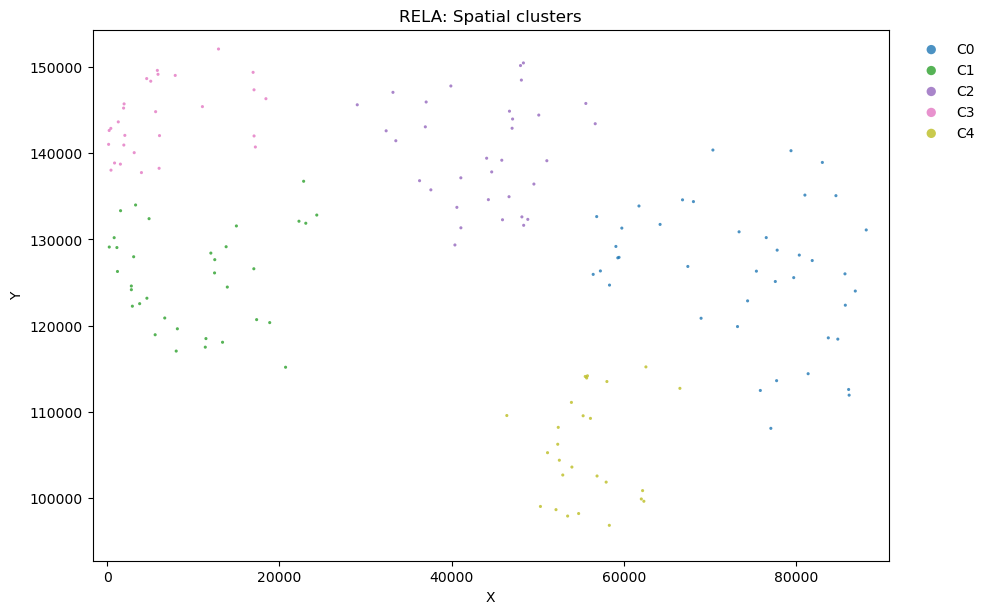

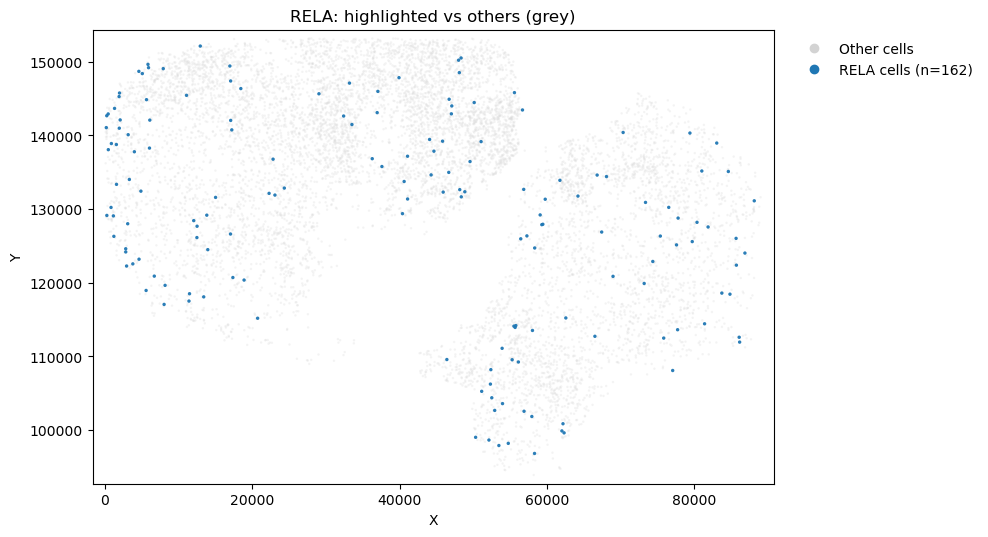

283
[RELA] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

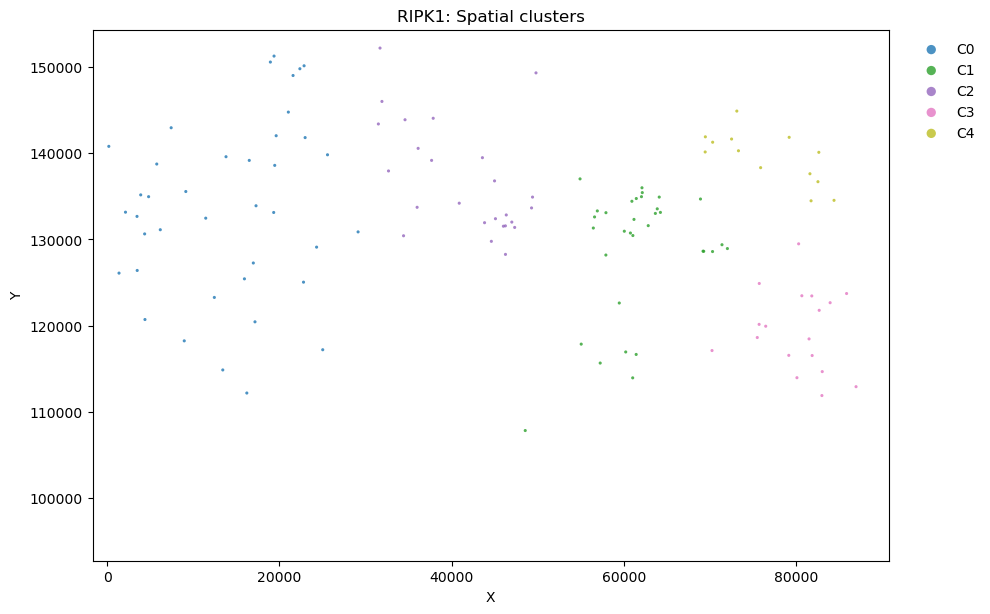

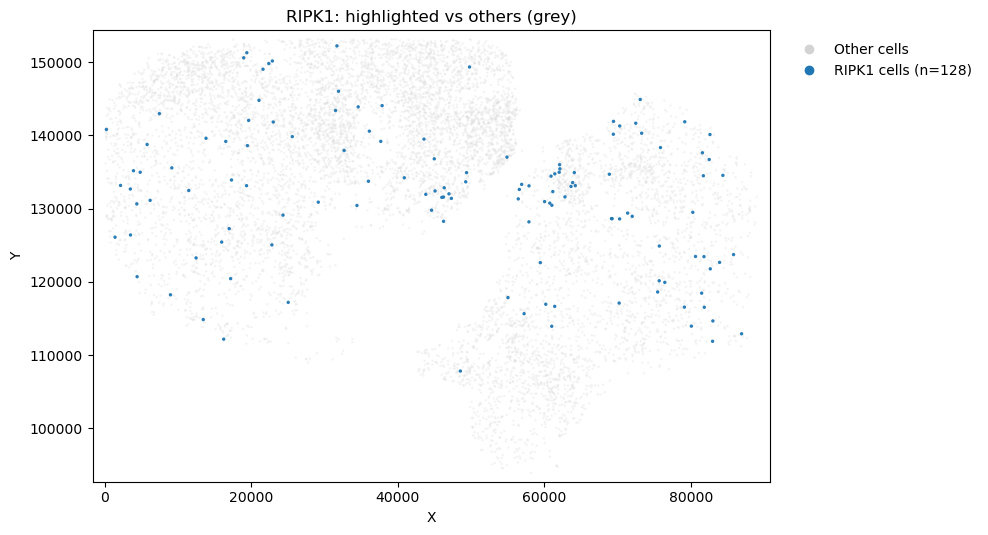

269
[RIPK1] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to

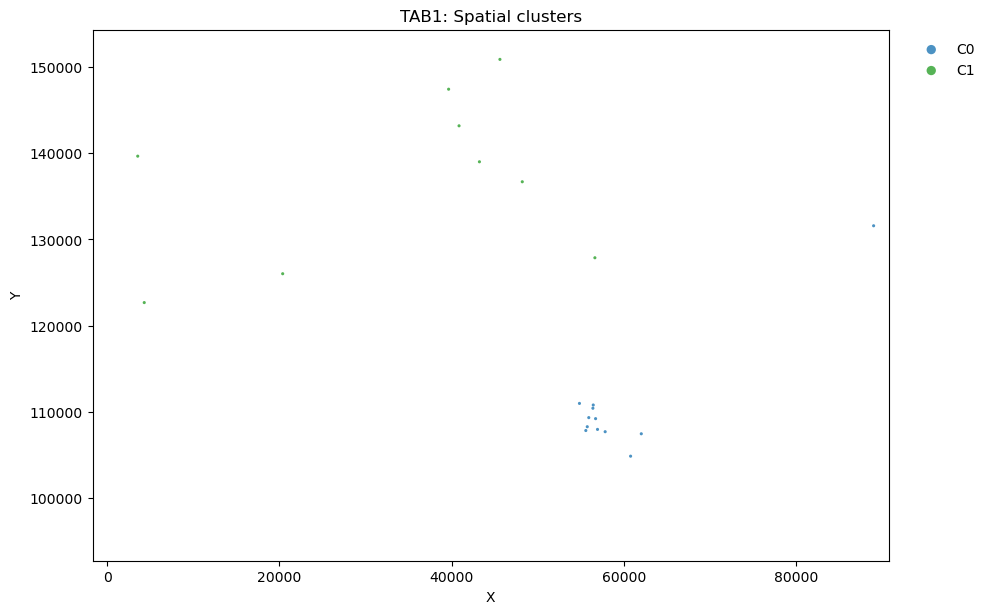

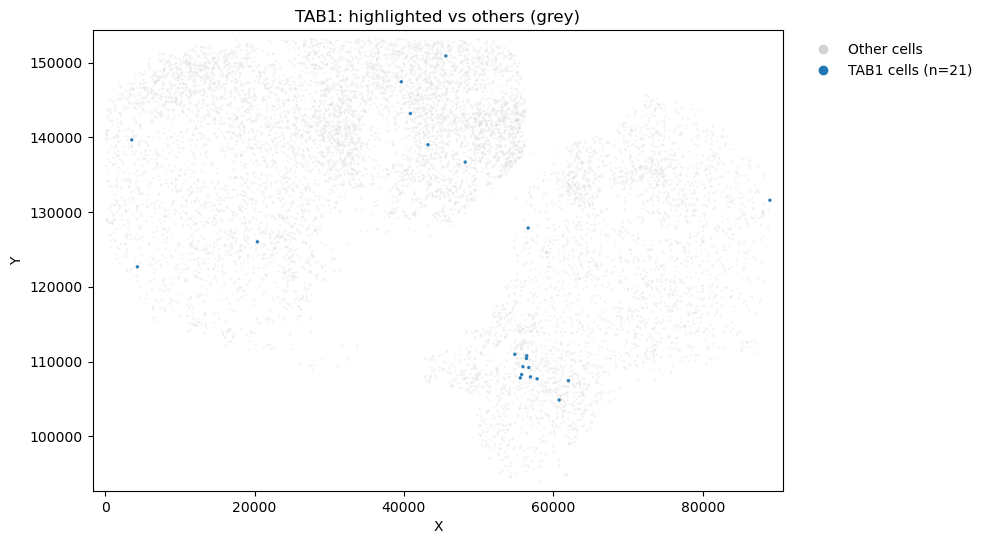

124
[TAB1] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

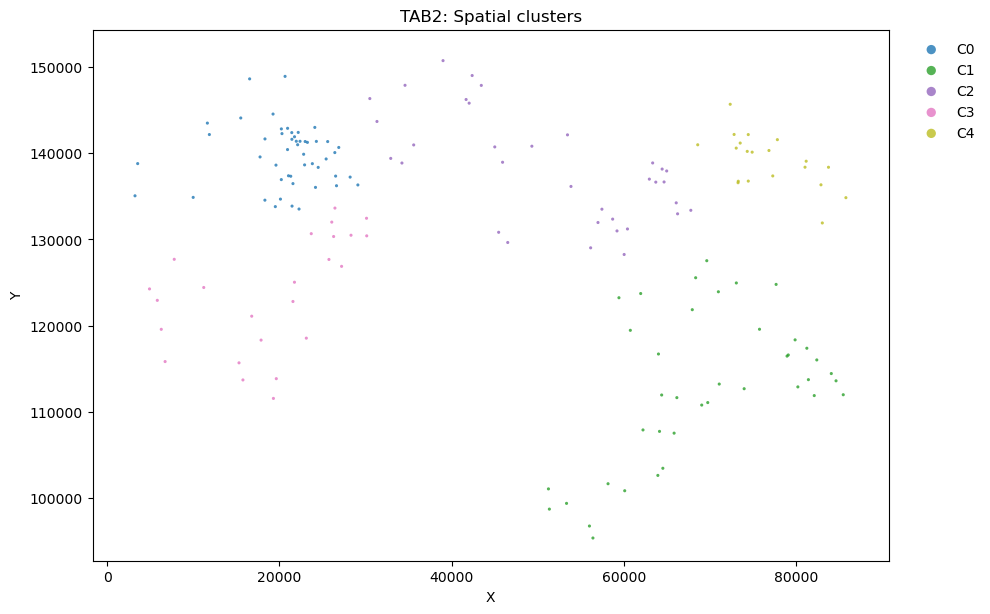

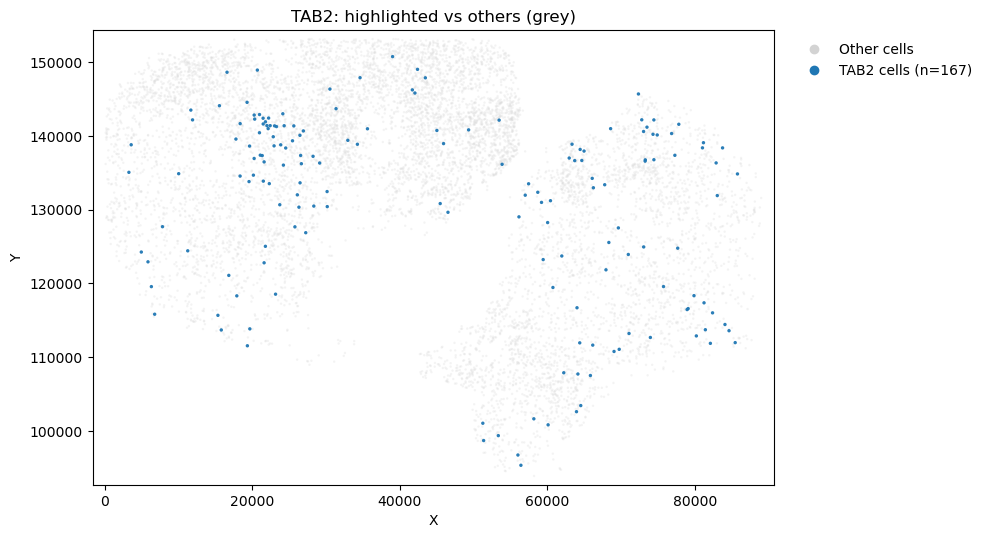

282
[TAB2] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to

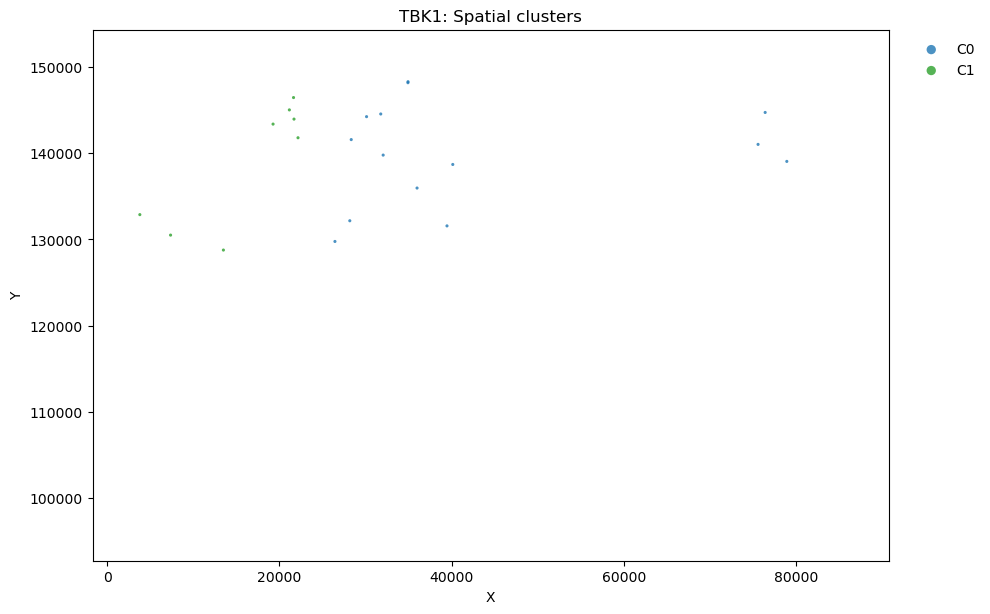

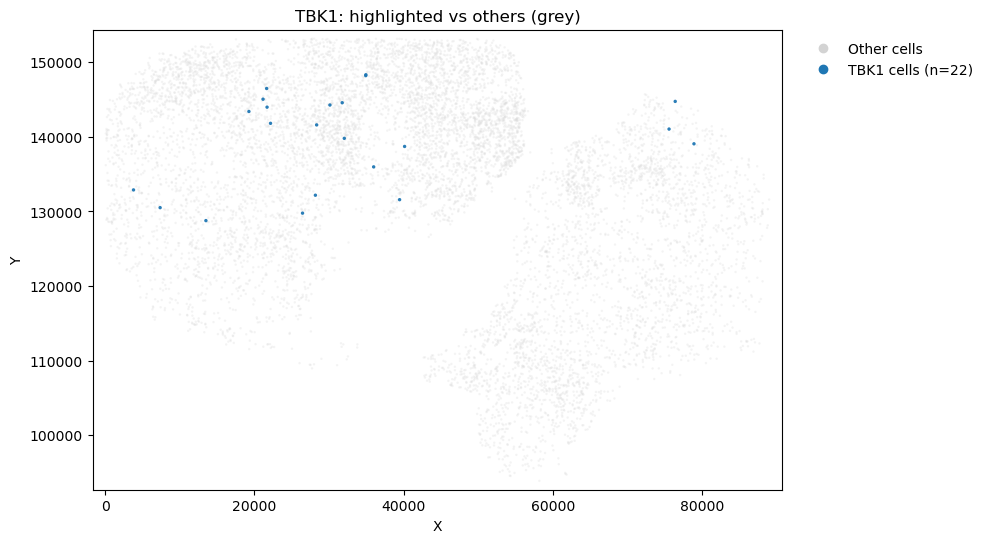

129
[TBK1] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

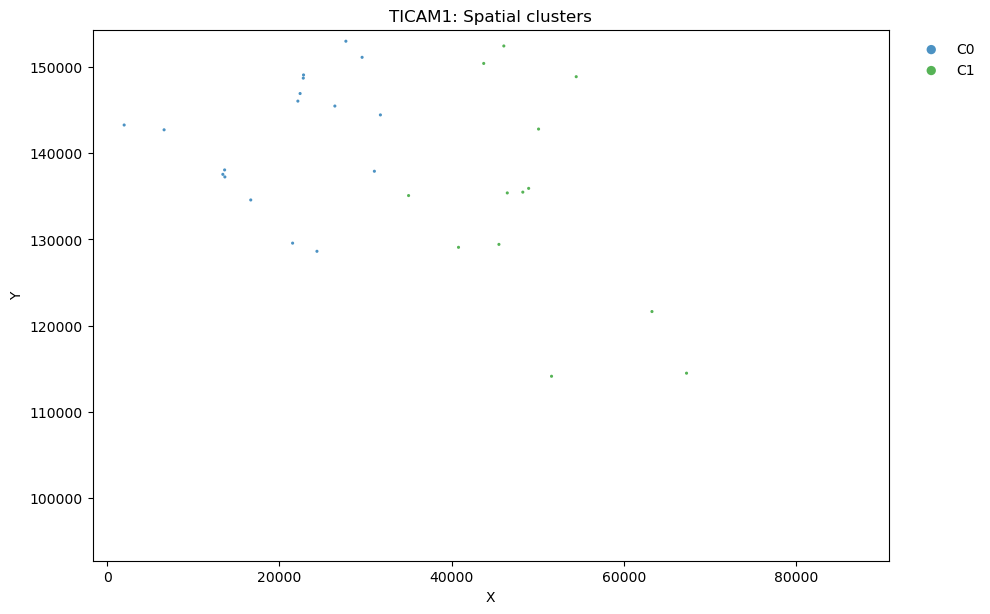

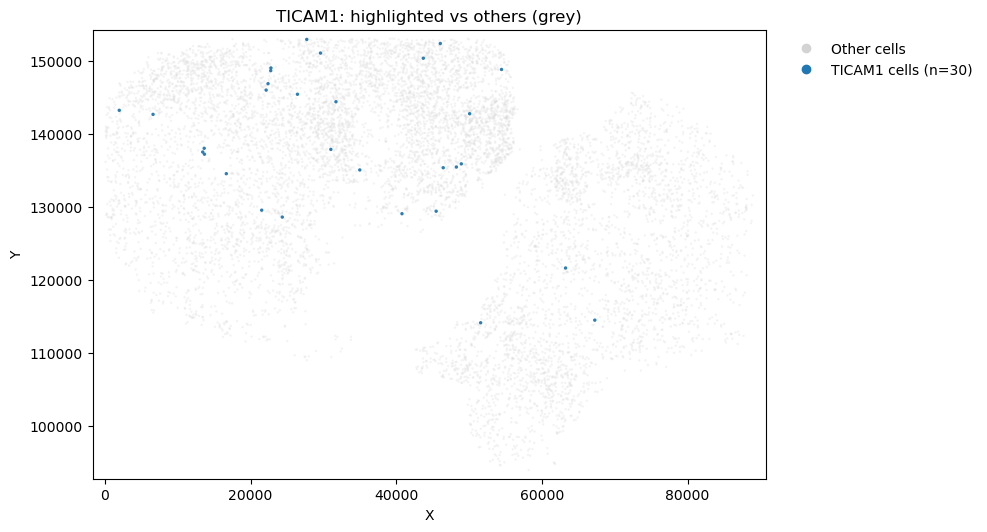

157
[TICAM1] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

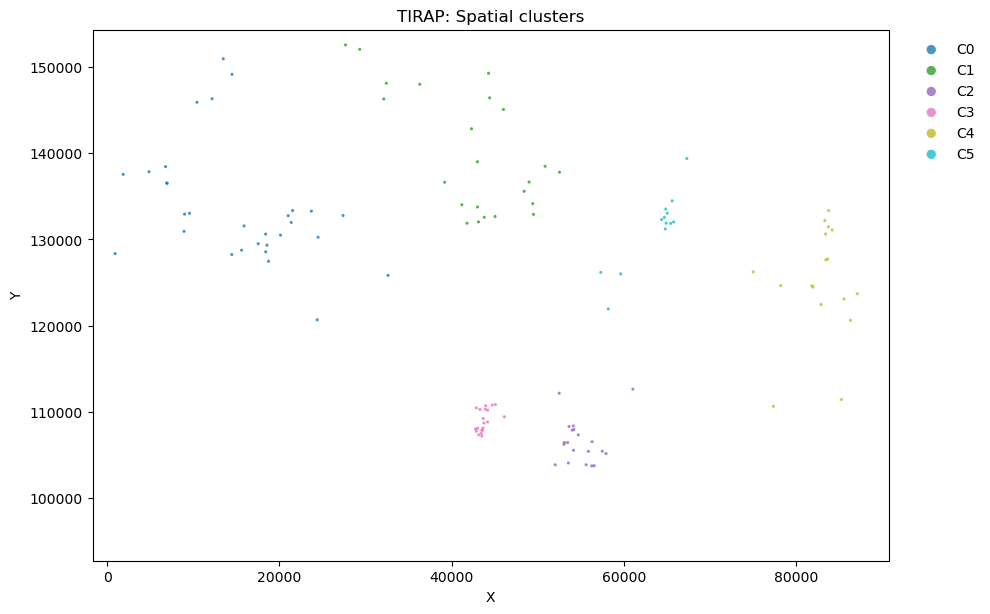

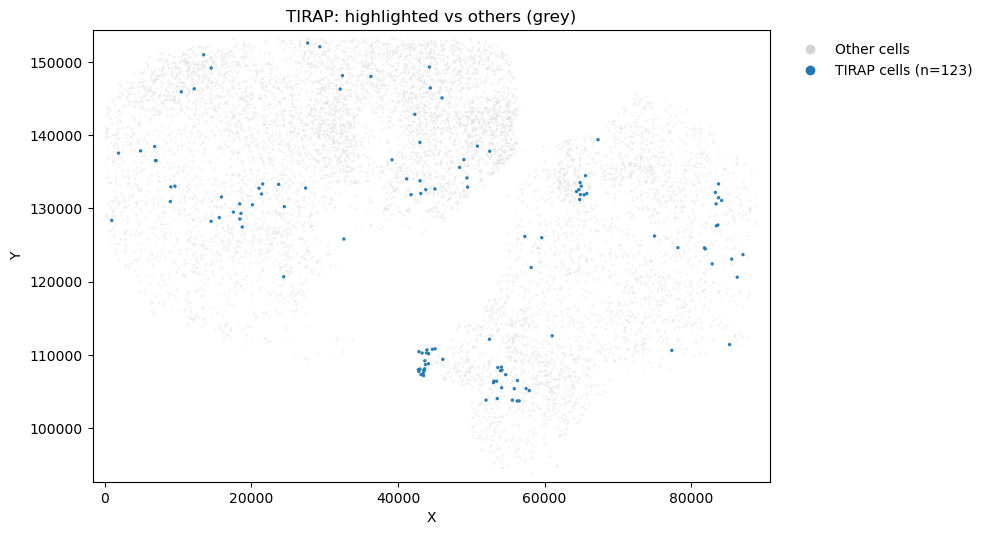

249
[TIRAP] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

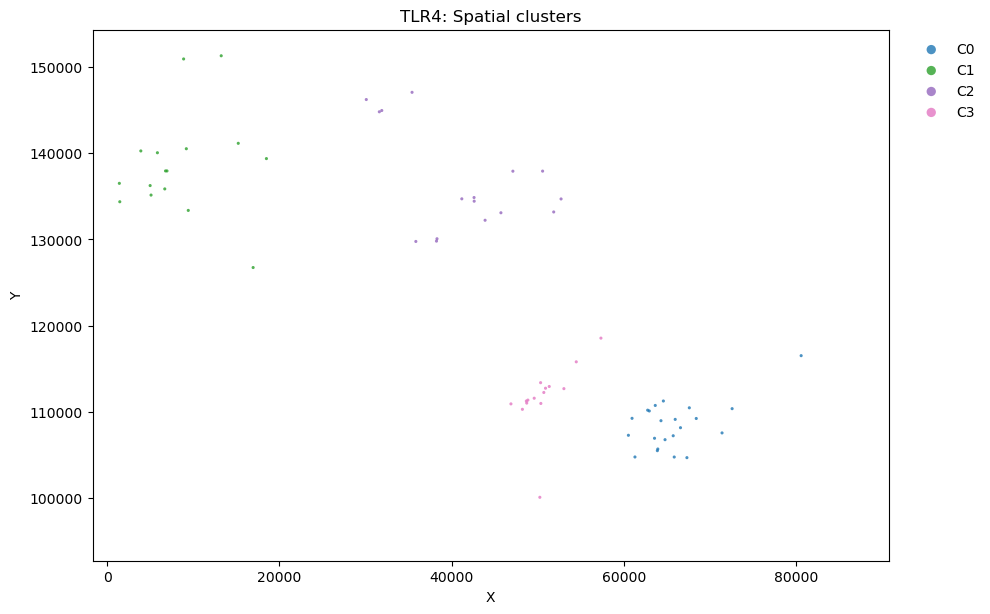

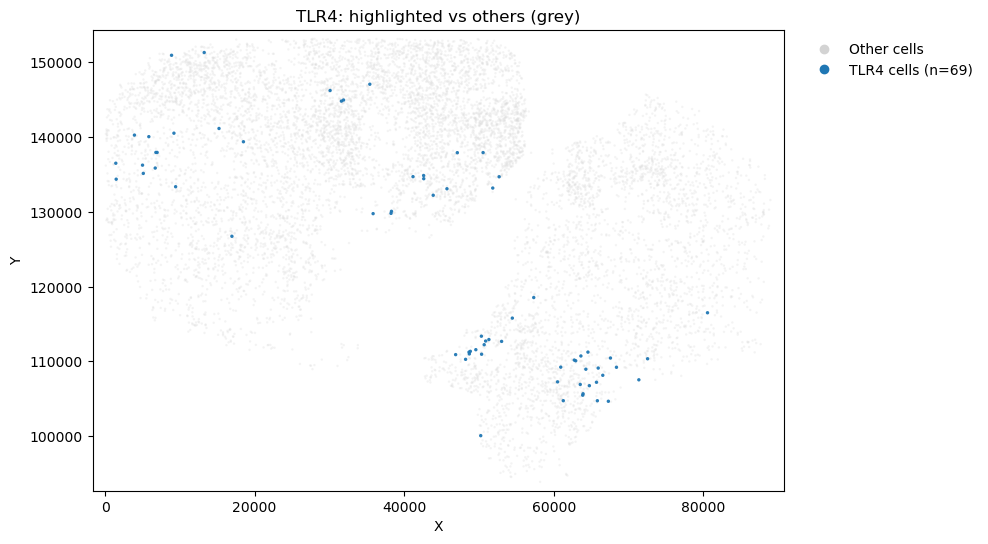

197
[TLR4] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

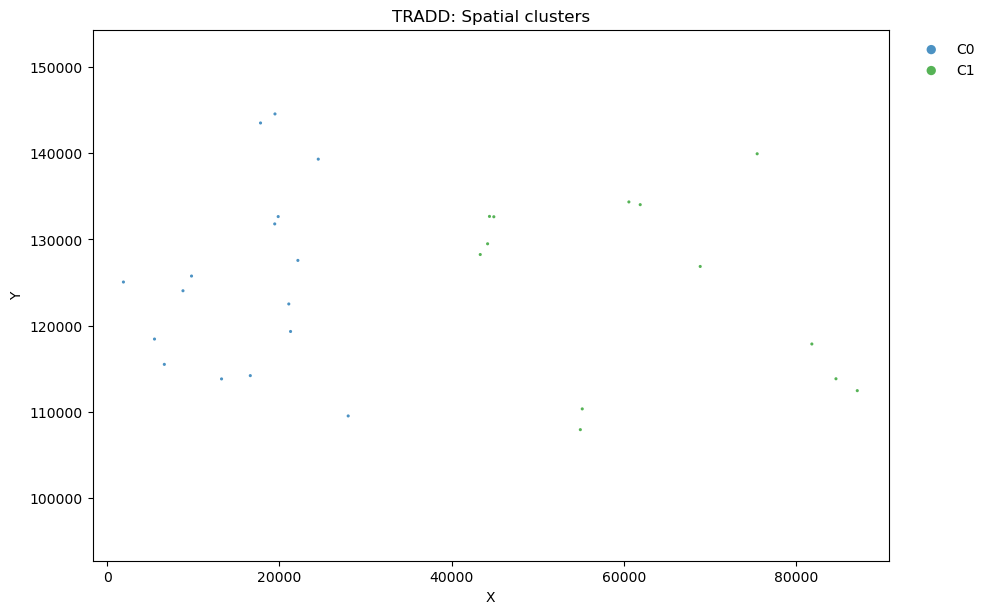

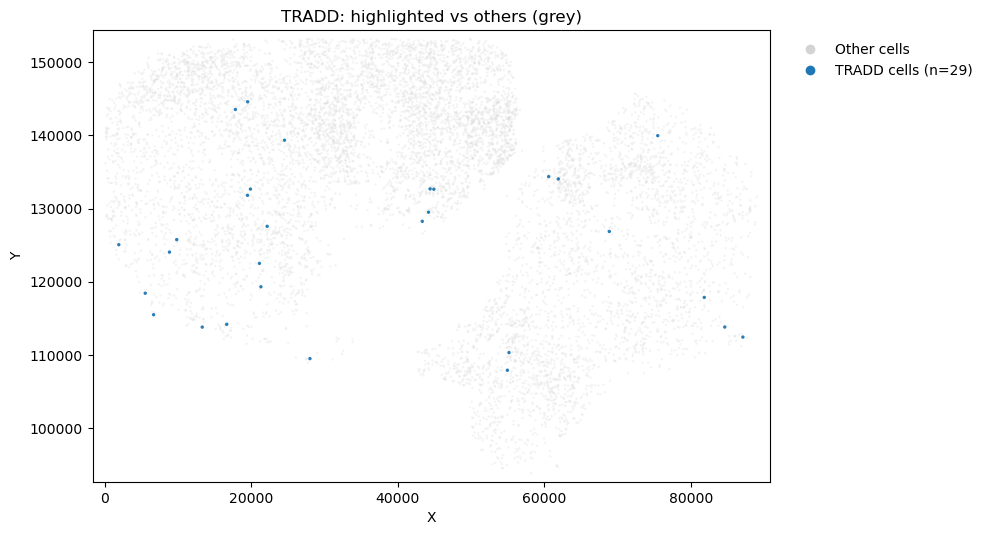

140
[TRADD] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

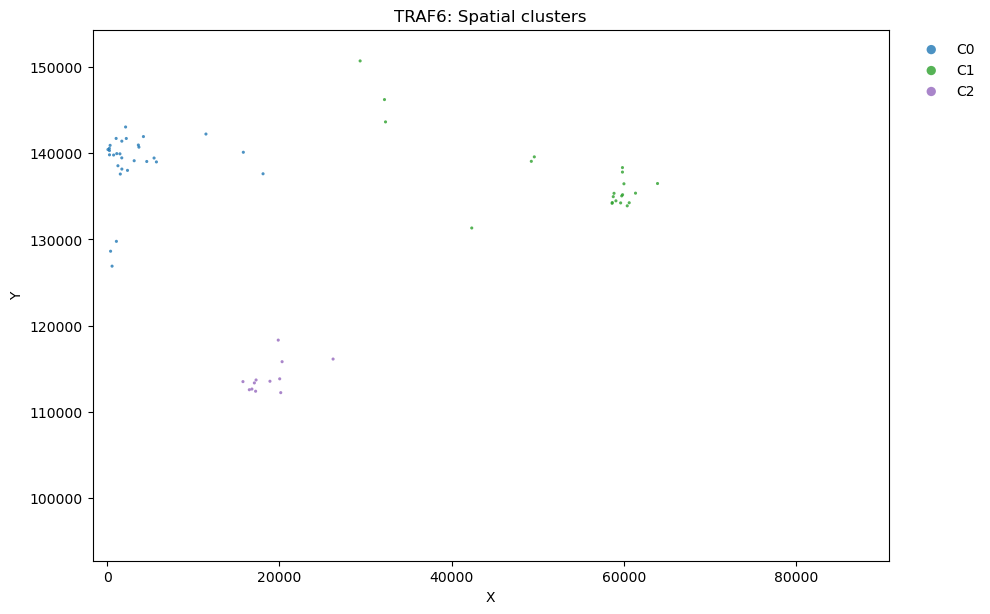

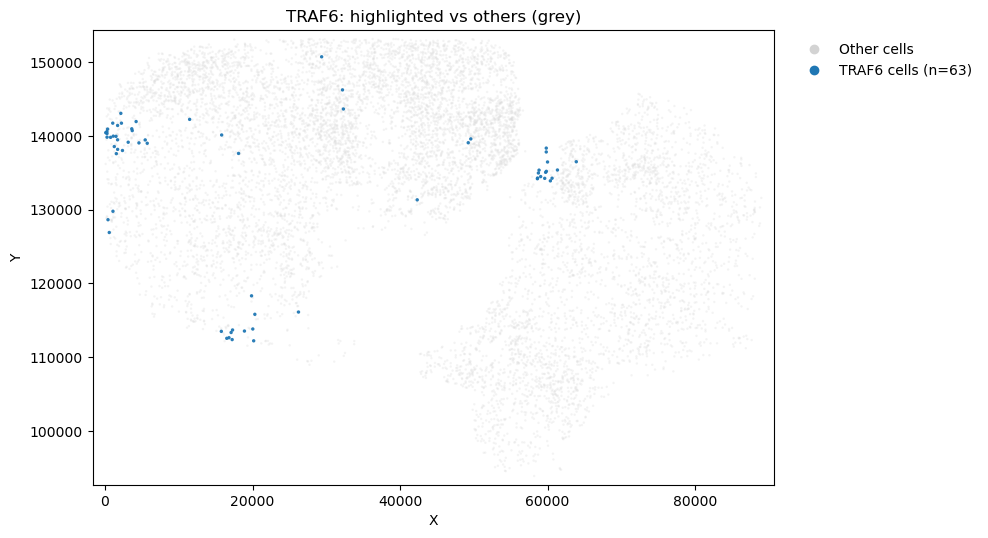

186
[TRAF6] saved plots + DE


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_97033/2197327198.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()

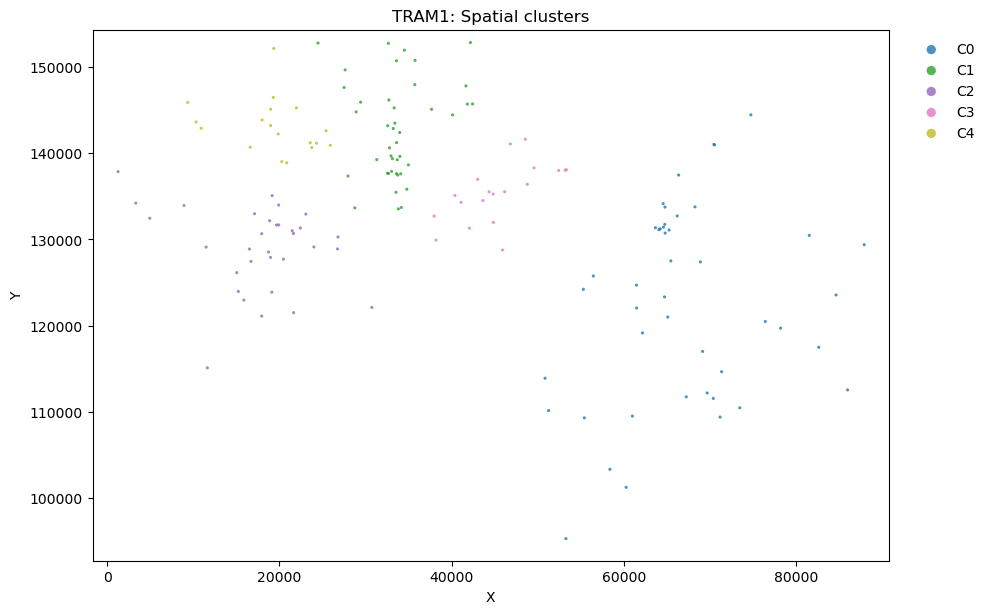

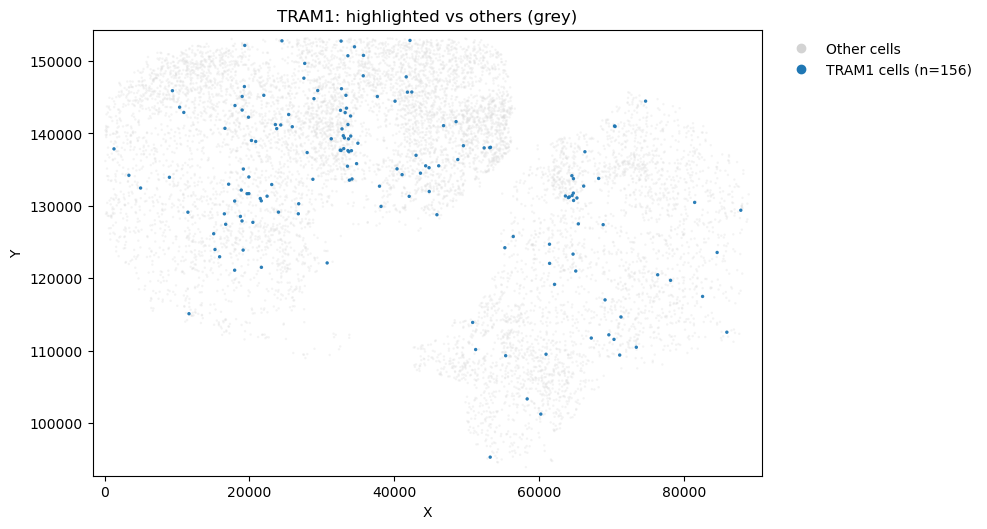

281
[TRAM1] saved plots + DE
✓ Done.


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()


In [44]:
# --- deps ---
import pandas as pd, numpy as np
from pathlib import Path
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
from scanpy.get import rank_genes_groups_df
from matplotlib.lines import Line2D

# --- config ---
P = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
COUNT_CSV   = "matched_merfishcounttable_xy.csv"              # cell_id, X, Y, gene1, ...
PERTURB_CSV = P / "tumorpooledperturbations.csv"              # genes x cells (>0 => hit)
OUT_DIR     = Path("./DE_single_target")
OUT_DIR.mkdir(exist_ok=True)

MIN_N       = 10
LEIDEN_RES  = 0.6
N_NEIGH     = 30

# --- palette (60 distinct) for cluster-only view ---
def colors60_distinct():
    cms = ["tab10","tab20","tab20b","tab20c","Set1","Set2","Set3","Dark2","Paired","Accent","Pastel1","Pastel2"]
    cols = []
    for cm in cms:
        cmap = plt.cm.get_cmap(cm)
        for t in np.linspace(0, 1, 6):
            cols.append(cmap(t))
            if len(cols) == 60:
                return cols
    return cols[:60]

# --- load & normalize IDs ---
counts  = pd.read_csv(COUNT_CSV)
perturb = pd.read_csv(PERTURB_CSV, index_col=0)

counts["cell_id"] = counts["cell_id"].astype(str).str.strip().str.upper()
perturb.columns   = perturb.columns.astype(str).str.strip().str.upper()
perturb.index     = perturb.index.astype(str).str.strip()

# --- cell -> perturb gene (first nonzero; else Control) ---
hit = perturb.gt(0)
cell_to_gene = pd.Series(np.where(hit.any(axis=0), hit.idxmax(axis=0), "Control"), index=hit.columns)

# align cells that have perturb info
counts = counts[counts["cell_id"].isin(cell_to_gene.index)].copy()
counts["perturb_gene"] = counts["cell_id"].map(cell_to_gene)

# expression cols from count table
non_expr = {"cell_id","X","Y","perturb_gene","treated_flag"}
expr_cols = [c for c in counts.columns if c not in non_expr and np.issubdtype(counts[c].dtype, np.number)]
assert len(expr_cols) > 0, "No numeric expression columns found."

# split meta / expr
meta = counts[["cell_id","X","Y","perturb_gene"]].set_index("cell_id")
expr = counts.set_index("cell_id")[expr_cols]

# global axis limits (consistent view) + small padding
global_xmin, global_xmax = meta["X"].min(), meta["X"].max()
global_ymin, global_ymax = meta["Y"].min(), meta["Y"].max()
xpad = 0.02 * (global_xmax - global_xmin)
ypad = 0.02 * (global_ymax - global_ymin)
XMIN, XMAX = global_xmin - xpad, global_xmax + xpad
YMIN, YMAX = global_ymin - ypad, global_ymax + ypad

# targets: ignore Control
TARGETS = [g for g in sorted(perturb.index.tolist()) if g.upper() != "CONTROL"]

# optional summary (descending + count of perturbed genes)
gene_counts = meta["perturb_gene"].value_counts().sort_values(ascending=False)
print("Cell count per perturbation gene (desc):")
for g, n in gene_counts.items():
    print(f"{g}: {n}")
print("\nNumber of perturbed genes (excl. Control):", len([g for g in gene_counts.index if g.upper() != "CONTROL"]))
print()

def plot_clusters_only(adata, TARGET):
    clusters = sorted(adata.obs["spatial_cluster"].unique())
    pal = colors60_distinct()
    cmap = {cl: pal[i % 60] for i, cl in enumerate(clusters)}

    fig = plt.figure(figsize=(10,8))
    for cl in clusters:
        sel = adata.obs["spatial_cluster"] == cl
        plt.scatter(adata.obs.loc[sel,"X"], adata.obs.loc[sel,"Y"],
                    s=5, alpha=0.8, edgecolors="none", color=cmap[cl], label=f"C{cl}")
    plt.title(f"{TARGET}: Spatial clusters")
    plt.xlabel("X"); plt.ylabel("Y")
    plt.xlim(XMIN, XMAX); plt.ylim(YMIN, YMAX)
    plt.gca().set_aspect("equal","box")
    plt.legend(markerscale=3, frameon=False, bbox_to_anchor=(1.02,1), loc="upper left")
    plt.tight_layout()
    plt.show()
    fig.savefig(OUT_DIR / f"SpatialClusters_{TARGET}.png", dpi=300)
    plt.close()

def plot_two_color_overlay(adata, TARGET):
    fig = plt.figure(figsize=(10,8))

    # background = all cells NOT in kept TARGET set (others + any filtered TARGET cells)
    bg_mask = ~meta.index.isin(adata.obs_names)
    plt.scatter(meta.loc[bg_mask, "X"], meta.loc[bg_mask, "Y"],
                s=3, alpha=0.25, color="lightgrey", edgecolors="none",
                zorder=1, rasterized=True)

    # TARGET cells (kept) single color
    plt.scatter(adata.obs["X"], adata.obs["Y"],
                s=6, alpha=0.95, color="tab:blue", edgecolors="none",
                zorder=2, rasterized=True)

    plt.title(f"{TARGET}: highlighted vs others (grey)")
    plt.xlabel("X"); plt.ylabel("Y")
    plt.xlim(XMIN, XMAX); plt.ylim(YMIN, YMAX)
    plt.gca().set_aspect("equal","box")
    legend_handles = [
        Line2D([], [], marker='o', linestyle='None', markersize=6, color='lightgrey', label='Other cells'),
        Line2D([], [], marker='o', linestyle='None', markersize=6, color='tab:blue',  label=f'{TARGET} cells (n={adata.n_obs})')
    ]
    plt.legend(handles=legend_handles, frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()
    fig.savefig(OUT_DIR / f"SpatialOverlay_{TARGET}.png", dpi=300)
    plt.close()

def analyze_target(TARGET: str):
    mask = meta["perturb_gene"].eq(TARGET)
    n_cells = int(mask.sum())

    expr_t = expr.loc[mask]
    obs_t  = meta.loc[mask, ["X","Y","perturb_gene"]].copy()

    # AnnData
    adata = ad.AnnData(expr_t.values, obs=obs_t, var=pd.DataFrame(index=expr_t.columns))
    adata.obs_names = expr_t.index; adata.var_names = expr_t.columns
    adata.obsm["spatial"] = adata.obs[["X","Y"]].to_numpy()

    # Case 1: n_cells < MIN_N → keep all; assign single cluster "0"; plot; skip DE
    if n_cells < MIN_N:
        adata.obs["spatial_cluster"] = pd.Categorical(["0"] * n_cells)
        print(f"[{TARGET}] <{MIN_N} cells → assigned single cluster '0'; DE skipped")
        plot_clusters_only(adata, TARGET)
        plot_two_color_overlay(adata, TARGET)
        return

    # Case 2: run full pipeline
    sc.pp.filter_genes(adata, min_counts=10)
    if adata.n_vars < 10:
        adata.obs["spatial_cluster"] = pd.Categorical(["0"] * adata.n_obs)
        print(f"[{TARGET}] few genes after filter → single cluster '0'; DE skipped")
        plot_clusters_only(adata, TARGET)
        plot_two_color_overlay(adata, TARGET)
        return

    # sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.neighbors(adata, use_rep="spatial", n_neighbors=N_NEIGH, metric="euclidean")
    sc.tl.leiden(adata, resolution=LEIDEN_RES, key_added="spatial_cluster")

    # drop tiny clusters (< MIN_N) but never drop whole gene
    sizes = adata.obs["spatial_cluster"].value_counts()
    keep_clusters = sizes[sizes >= MIN_N].index

    if len(keep_clusters) == 0:
        # if all clusters tiny, collapse to single
        adata.obs["spatial_cluster"] = pd.Categorical(["0"] * adata.n_obs)
        print(f"[{TARGET}] all clusters <{MIN_N} → single cluster '0'; DE skipped")
        plot_clusters_only(adata, TARGET)
        plot_two_color_overlay(adata, TARGET)
        return
    else:
        # keep large clusters; reassign tiny ones into nearest kept cluster in (X,Y)
        kept = adata.obs["spatial_cluster"].isin(keep_clusters)
        if kept.sum() < adata.n_obs:
            # simple nearest-centroid reassignment
            kept_centroids = (
                adata.obs.loc[kept, ["spatial_cluster","X","Y"]]
                .groupby("spatial_cluster")[["X","Y"]]
                .mean()
            )
            tiny_idx = adata.obs.index[~kept]
            tiny_xy  = adata.obs.loc[tiny_idx, ["X","Y"]].to_numpy()
            kept_xy  = kept_centroids[["X","Y"]].to_numpy()
            # assign to nearest kept centroid
            import numpy.linalg as LA
            dists = ((tiny_xy[:,None,:] - kept_xy[None,:,:])**2).sum(axis=2)**0.5
            nearest = dists.argmin(axis=1)
            map_back = dict(enumerate(kept_centroids.index.tolist()))
            reassigned = [map_back[i] for i in nearest]
            adata.obs.loc[tiny_idx, "spatial_cluster"] = reassigned
            adata.obs["spatial_cluster"] = pd.Categorical(adata.obs["spatial_cluster"].astype(str))

    # ensure at least 2 clusters remain
    if adata.obs["spatial_cluster"].nunique() < 2:
        adata.obs["spatial_cluster"] = pd.Categorical(["0"] * adata.n_obs)
        print(f"[{TARGET}] <2 clusters after reassignment → single cluster '0'; DE skipped")
        plot_clusters_only(adata, TARGET)
        plot_two_color_overlay(adata, TARGET)
        return

    # plots
    plot_clusters_only(adata, TARGET)
    plot_two_color_overlay(adata, TARGET)

    N_ALL = adata.n_vars 
    print(N_ALL)

    # DE: cluster vs rest (only if ≥2 clusters)
    sc.tl.rank_genes_groups(
        adata,
        groupby="spatial_cluster",
        method="wilcoxon",
        reference="rest",
        tie_correct=True,
        use_raw=False,
        pts=True,
        n_genes=N_ALL
    )
    de = rank_genes_groups_df(adata, group=None)
    de.to_csv(OUT_DIR / f"DE_{TARGET}_cluster_vs_rest.csv", index=False)
    print(f"[{TARGET}] saved plots + DE")

# --- run loop ---
for tg in TARGETS:
    analyze_target(tg)

print("✓ Done.")

### By location

In [1]:
# --- deps ---
import pandas as pd, numpy as np
from pathlib import Path
from sklearn.neighbors import NearestNeighbors

# --- config ---
P            = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
COUNT_CSV    = "matched_merfishcounttable_xy.csv"      # cell_id, X, Y, gene1, ...
PERTURB_CSV  = P / "tumorpooledperturbations.csv"      # rows=genes, cols=cells (>0 => hit)
TOPK         = 100                                     # top-K neighbors (excluding self)

# --- load counts ---
counts = pd.read_csv(COUNT_CSV)
counts["cell_id"] = counts["cell_id"].astype(str).str.strip().str.upper()
meta   = counts[["cell_id","X","Y"]].copy()

expr_cols = [c for c in counts.columns if c not in {"cell_id","X","Y"}]
counts[expr_cols] = counts[expr_cols].apply(pd.to_numeric, errors="coerce").fillna(0.0)
expr = counts.set_index("cell_id")[expr_cols].astype(float)
meta = meta.set_index("cell_id").loc[expr.index]

# --- load perturb + map per cell ---
perturb = pd.read_csv(PERTURB_CSV, index_col=0)
perturb.columns = perturb.columns.astype(str).str.strip().str.upper()
perturb.index   = perturb.index.astype(str).str.strip()

hit = perturb.gt(0)
cell_to_gene = pd.Series(np.where(hit.any(axis=0), hit.idxmax(axis=0), "Control"),
                         index=hit.columns)
cell_to_gene = cell_to_gene.reindex(expr.index).fillna("Control")
meta["perturb_gene"] = cell_to_gene

# --- build kNN on XY and compute neighbor-averaged expression (exclude self) ---
cells = expr.index.to_numpy()
XY    = meta.loc[cells, ["X","Y"]].to_numpy()
X     = expr.to_numpy(dtype=float)
G     = expr.columns.to_numpy()

k_eff = int(min(TOPK + 1, len(cells)))  # +1 to include self, then drop self
nn = NearestNeighbors(n_neighbors=k_eff).fit(XY)
idx = nn.kneighbors(XY, return_distance=False)          # shape (n, k_eff)

# drop self in each row (self is always present as one of the neighbors)
# ensure the first column is self; if not guaranteed, remove by ID match
# robust removal:
self_pos = (idx == np.arange(idx.shape[0])[:, None])
# for each row, find the column where self sits
self_col = self_pos.argmax(axis=1)
rows = np.arange(idx.shape[0])[:, None]
idx_wo_self = np.delete(idx, self_col, axis=1)          # shape (n, k_eff-1) = ~TOPK

# average expression over neighbors (excluding self)
X_avg = X[idx_wo_self].mean(axis=1)                     # shape (n, n_genes)

# --- assemble output DataFrame ---
out = pd.DataFrame(X_avg, index=cells, columns=G)
out.insert(0, "perturb_gene", meta.loc[cells, "perturb_gene"].to_numpy())
out.insert(0, "Y", meta.loc[cells, "Y"].to_numpy())
out.insert(0, "X", meta.loc[cells, "X"].to_numpy())

out
# Example: return/show one row (pick any cell_id)
# row = out[out["cell_id"] == "YOUR_CELL_ID_HERE"]  # keep as a guide
# print(row.head(1))

# Optional: save
# out.to_csv("neighbor_avg_top100.csv", index=False)

# 'out' now has: cell_id, X, Y, perturb_gene, and neighbor-averaged counts for all genes

,X,Y,perturb_gene,PDK4,CCL26,CX3CL1,PGLYRP1,CD4,SNAI2,TNFRSF17,...,PDPN,IL4,TRBC1,SERPINA1,FGFR2,ATM,PRF1,IL10,IL17A,NOTCH1
CELL_1,87.561842,136197.870810,IRF7,0.13,0.02,0.07,0.05,0.02,0.01,0.05,...,0.14,0.05,0.05,0.45,0.00,0.19,0.07,0.01,0.06,0.26
CELL_2,100.038085,140438.670907,TRAF6,0.18,0.02,0.05,0.01,0.01,0.01,0.04,...,0.08,0.04,0.05,0.40,0.00,0.18,0.16,0.02,0.05,0.30
CELL_3,200.362184,139500.293533,Control,0.15,0.02,0.04,0.01,0.01,0.01,0.07,...,0.10,0.04,0.04,0.43,0.00,0.18,0.12,0.02,0.07,0.30
CELL_4,144.921319,139788.104339,Control,0.13,0.02,0.04,0.01,0.01,0.02,0.04,...,0.10,0.04,0.04,0.41,0.00,0.18,0.12,0.02,0.06,0.30
CELL_5,163.934023,128884.449827,IRF5,0.04,0.00,0.04,0.08,0.05,0.08,0.00,...,0.20,0.03,0.03,0.24,0.01,0.07,0.04,0.02,0.02,0.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CELL_9428,88244.545882,134424.754573,MAP2K6,0.12,0.01,0.00,0.01,0.02,0.02,0.01,...,0.01,0.04,0.03,0.21,0.02,0.05,0.09,0.06,0.02,0.21
CELL_9429,88700.061980,127798.418263,MAP2K6,0.09,0.01,0.03,0.01,0.03,0.03,0.00,...,0.04,0.03,0.02,0.33,0.03,0.06,0.10,0.02,0.02,0.19
CELL_9430,88800.573538,130303.483781,IRAK4,0.11,0.01,0.02,0.01,0.02,0.03,0.01,...,0.03,0.04,0.02,0.28,0.03,0.05,0.09,0.02,0.03,0.23
CELL_9431,88795.947106,128134.653268,NFKB1,0.09,0.01,0.03,0.01,0.03,0.04,0.00,...,0.03,0.03,0.02,0.33,0.03,0.06,0.11,0.02,0.03,0.20


In [2]:
# --- PCA-free clustering + DE on neighbor-averaged expression ---

import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
from pathlib import Path

OUT_DIR = Path("./DE_loc_neighbors_cluster"); OUT_DIR.mkdir(exist_ok=True)
LEIDEN_RES   = 0.6
N_NEIGH_CLUS = 30
RANDOM_STATE = 0

# prerequisites from previous step:
# - X_avg: np.ndarray (n_cells, n_genes)  neighbor-averaged expression
# - cells: np.ndarray of cell_ids          (n_cells,)
# - G:     np.ndarray of gene names        (n_genes,)
# - meta:  DataFrame indexed by cell_id with columns ["X","Y","perturb_gene"]

a = ad.AnnData(X_avg, obs=meta.loc[cells].copy(), var=pd.DataFrame(index=G))
a.obs_names = cells
a.var_names = G

# optional transform on averaged values (can skip if unwanted)
sc.pp.log1p(a)

# --- PCA-free neighbors/graph in expression space ---
sc.pp.neighbors(a, n_neighbors=N_NEIGH_CLUS, use_rep="X", metric="euclidean")  # no PCA
sc.tl.leiden(a, resolution=LEIDEN_RES, key_added="cluster", random_state=RANDOM_STATE)

print("Cluster sizes:", a.obs["cluster"].value_counts().to_dict())

# --- Differential expression: cluster vs rest; return ALL genes ---
sc.tl.rank_genes_groups(
    a,
    groupby="cluster",
    method="wilcoxon",
    reference="rest",
    tie_correct=True,
    use_raw=False,
    pts=True,
    n_genes=a.n_vars         # all genes
)

de = sc.get.rank_genes_groups_df(a, group=None)
de.to_csv(OUT_DIR / "DE_cluster_vs_rest_all_genes_PCAfree.csv", index=False)
print("genes/cluster exported:", len(a.uns["rank_genes_groups"]["names"]))

/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_

Cluster sizes: {'0': 498, '1': 457, '2': 435, '3': 430, '4': 412, '5': 402, '6': 400, '7': 400, '8': 390, '9': 388, '10': 373, '11': 356, '12': 356, '13': 347, '14': 334, '15': 307, '16': 300, '17': 286, '18': 285, '19': 281, '20': 280, '21': 280, '22': 271, '23': 256, '24': 208, '25': 187, '26': 172, '27': 128, '28': 121, '29': 92}


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


genes/cluster exported: 500


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:401: PerformanceWa

/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_96846/2454105825.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap("tab20b", 20)
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_96846/2454105825.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap2 = cm.get_cmap("tab20c", 20)
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_96846/2454105825.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


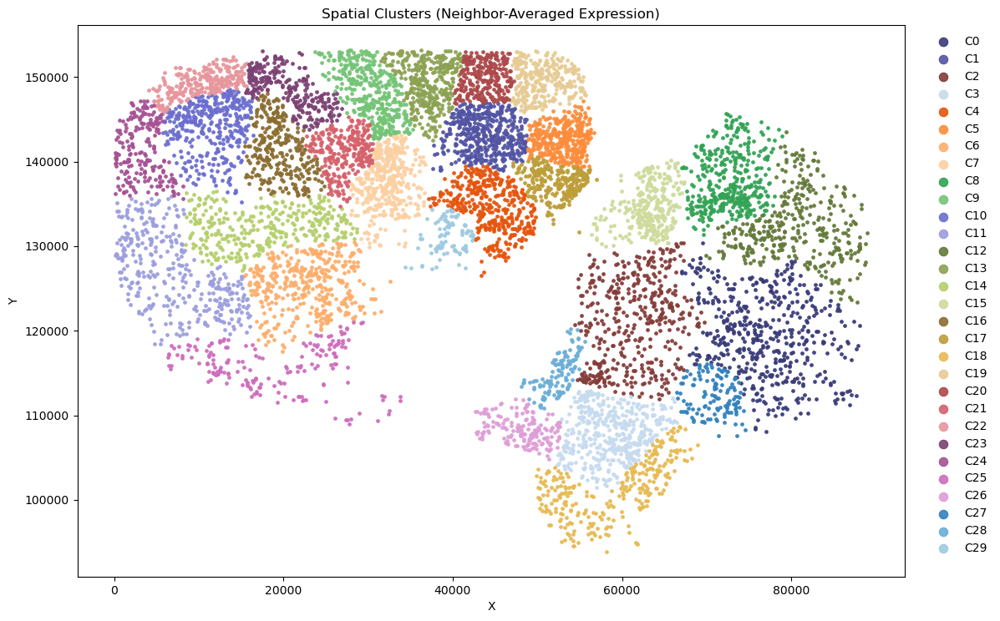

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

clusters = sorted(a.obs["cluster"].unique())
n = len(clusters)

# Get 40 distinct colors by combining tab20b + tab20c
cmap1 = cm.get_cmap("tab20b", 20)
cmap2 = cm.get_cmap("tab20c", 20)
colors = np.vstack([cmap1(np.arange(20)), cmap2(np.arange(20))])

# If n < 40, just take first n colors
colors = colors[:n]

color_map = {cl: colors[i] for i, cl in enumerate(clusters)}

plt.figure(figsize=(12, 8))

for cl, sub in a.obs.groupby("cluster"):
    plt.scatter(
        sub["X"], sub["Y"],
        s=6,
        alpha=0.9,
        color=color_map[cl],
        label=f"C{cl}"
    )

plt.title("Spatial Clusters (Neighbor-Averaged Expression)")
plt.xlabel("X")
plt.ylabel("Y")
plt.gca().set_aspect("equal", "box")
plt.legend(
    markerscale=3,
    frameon=False,
    bbox_to_anchor=(1.02, 1),
    loc="upper left"
)
plt.tight_layout()
plt.show()


In [4]:
# --- deps ---
import pandas as pd, numpy as np
from pathlib import Path
from sklearn.neighbors import NearestNeighbors

# --- config ---
P            = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
COUNT_CSV    = "matched_merfishcounttable_xy.csv"      # cell_id, X, Y, gene1, ...
PERTURB_CSV  = P / "tumorpooledperturbations.csv"      # rows=genes, cols=cells (>0 => hit)
TOPK         = 300                                     # top-K neighbors (excluding self)

# --- load counts ---
counts = pd.read_csv(COUNT_CSV)
counts["cell_id"] = counts["cell_id"].astype(str).str.strip().str.upper()
meta   = counts[["cell_id","X","Y"]].copy()

expr_cols = [c for c in counts.columns if c not in {"cell_id","X","Y"}]
counts[expr_cols] = counts[expr_cols].apply(pd.to_numeric, errors="coerce").fillna(0.0)
expr = counts.set_index("cell_id")[expr_cols].astype(float)
meta = meta.set_index("cell_id").loc[expr.index]

# --- load perturb + map per cell ---
perturb = pd.read_csv(PERTURB_CSV, index_col=0)
perturb.columns = perturb.columns.astype(str).str.strip().str.upper()
perturb.index   = perturb.index.astype(str).str.strip()

hit = perturb.gt(0)
cell_to_gene = pd.Series(np.where(hit.any(axis=0), hit.idxmax(axis=0), "Control"),
                         index=hit.columns)
cell_to_gene = cell_to_gene.reindex(expr.index).fillna("Control")
meta["perturb_gene"] = cell_to_gene

# --- build kNN on XY and compute neighbor-averaged expression (exclude self) ---
cells = expr.index.to_numpy()
XY    = meta.loc[cells, ["X","Y"]].to_numpy()
X     = expr.to_numpy(dtype=float)
G     = expr.columns.to_numpy()

k_eff = int(min(TOPK + 1, len(cells)))  # +1 to include self, then drop self
nn = NearestNeighbors(n_neighbors=k_eff).fit(XY)
idx = nn.kneighbors(XY, return_distance=False)          # shape (n, k_eff)

# drop self in each row (self is always present as one of the neighbors)
# ensure the first column is self; if not guaranteed, remove by ID match
# robust removal:
self_pos = (idx == np.arange(idx.shape[0])[:, None])
# for each row, find the column where self sits
self_col = self_pos.argmax(axis=1)
rows = np.arange(idx.shape[0])[:, None]
idx_wo_self = np.delete(idx, self_col, axis=1)          # shape (n, k_eff-1) = ~TOPK

# average expression over neighbors (excluding self)
X_avg = X[idx_wo_self].mean(axis=1)                     # shape (n, n_genes)

# --- assemble output DataFrame ---
out = pd.DataFrame(X_avg, index=cells, columns=G)
out.insert(0, "perturb_gene", meta.loc[cells, "perturb_gene"].to_numpy())
out.insert(0, "Y", meta.loc[cells, "Y"].to_numpy())
out.insert(0, "X", meta.loc[cells, "X"].to_numpy())

out
# Example: return/show one row (pick any cell_id)
# row = out[out["cell_id"] == "YOUR_CELL_ID_HERE"]  # keep as a guide
# print(row.head(1))

# Optional: save
# out.to_csv("neighbor_avg_top100.csv", index=False)

# 'out' now has: cell_id, X, Y, perturb_gene, and neighbor-averaged counts for all genes

,X,Y,perturb_gene,PDK4,CCL26,CX3CL1,PGLYRP1,CD4,SNAI2,TNFRSF17,...,PDPN,IL4,TRBC1,SERPINA1,FGFR2,ATM,PRF1,IL10,IL17A,NOTCH1
CELL_1,87.561842,136197.870810,IRF7,0.130000,0.006667,0.046667,0.036667,0.016667,0.040000,0.033333,...,0.226667,0.026667,0.033333,0.366667,0.003333,0.140000,0.090000,0.023333,0.040000,0.290000
CELL_2,100.038085,140438.670907,TRAF6,0.190000,0.010000,0.040000,0.033333,0.023333,0.026667,0.046667,...,0.150000,0.036667,0.030000,0.386667,0.003333,0.173333,0.083333,0.030000,0.043333,0.326667
CELL_3,200.362184,139500.293533,Control,0.183333,0.010000,0.043333,0.033333,0.016667,0.026667,0.046667,...,0.156667,0.040000,0.033333,0.380000,0.003333,0.160000,0.093333,0.033333,0.046667,0.313333
CELL_4,144.921319,139788.104339,Control,0.183333,0.010000,0.043333,0.033333,0.023333,0.020000,0.046667,...,0.153333,0.040000,0.033333,0.386667,0.003333,0.163333,0.083333,0.033333,0.043333,0.323333
CELL_5,163.934023,128884.449827,IRF5,0.083333,0.006667,0.043333,0.046667,0.026667,0.053333,0.023333,...,0.230000,0.023333,0.033333,0.343333,0.006667,0.100000,0.040000,0.023333,0.043333,0.300000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CELL_9428,88244.545882,134424.754573,MAP2K6,0.120000,0.010000,0.016667,0.030000,0.016667,0.043333,0.010000,...,0.070000,0.040000,0.026667,0.286667,0.010000,0.033333,0.110000,0.053333,0.036667,0.233333
CELL_9429,88700.061980,127798.418263,MAP2K6,0.120000,0.006667,0.033333,0.040000,0.046667,0.046667,0.006667,...,0.106667,0.046667,0.036667,0.276667,0.010000,0.080000,0.110000,0.036667,0.026667,0.243333
CELL_9430,88800.573538,130303.483781,IRAK4,0.126667,0.006667,0.026667,0.040000,0.033333,0.046667,0.010000,...,0.083333,0.046667,0.033333,0.286667,0.010000,0.050000,0.116667,0.043333,0.036667,0.220000
CELL_9431,88795.947106,128134.653268,NFKB1,0.123333,0.006667,0.033333,0.043333,0.046667,0.043333,0.006667,...,0.106667,0.046667,0.036667,0.273333,0.010000,0.076667,0.113333,0.040000,0.026667,0.233333


In [5]:
# --- PCA-free clustering + DE on neighbor-averaged expression ---

import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
from pathlib import Path

OUT_DIR = Path("./DE_loc_neighbors_cluster"); OUT_DIR.mkdir(exist_ok=True)
LEIDEN_RES   = 0.6
N_NEIGH_CLUS = 30
RANDOM_STATE = 0

# prerequisites from previous step:
# - X_avg: np.ndarray (n_cells, n_genes)  neighbor-averaged expression
# - cells: np.ndarray of cell_ids          (n_cells,)
# - G:     np.ndarray of gene names        (n_genes,)
# - meta:  DataFrame indexed by cell_id with columns ["X","Y","perturb_gene"]

a = ad.AnnData(X_avg, obs=meta.loc[cells].copy(), var=pd.DataFrame(index=G))
a.obs_names = cells
a.var_names = G

# optional transform on averaged values (can skip if unwanted)
sc.pp.log1p(a)

# --- PCA-free neighbors/graph in expression space ---
sc.pp.neighbors(a, n_neighbors=N_NEIGH_CLUS, use_rep="X", metric="euclidean")  # no PCA
sc.tl.leiden(a, resolution=LEIDEN_RES, key_added="cluster", random_state=RANDOM_STATE)

print("Cluster sizes:", a.obs["cluster"].value_counts().to_dict())

# --- Differential expression: cluster vs rest; return ALL genes ---
sc.tl.rank_genes_groups(
    a,
    groupby="cluster",
    method="wilcoxon",
    reference="rest",
    tie_correct=True,
    use_raw=False,
    pts=True,
    n_genes=a.n_vars         # all genes
)

de = sc.get.rank_genes_groups_df(a, group=None)
de.to_csv(OUT_DIR / "DE_cluster_vs_rest_all_genes_PCAfree.csv", index=False)
print("genes/cluster exported:", len(a.uns["rank_genes_groups"]["names"]))

Cluster sizes: {'0': 460, '1': 412, '2': 410, '3': 404, '4': 394, '5': 393, '6': 373, '7': 372, '8': 363, '9': 329, '10': 322, '11': 320, '12': 304, '13': 298, '14': 293, '15': 292, '16': 287, '17': 276, '18': 263, '19': 252, '20': 234, '21': 232, '22': 231, '23': 227, '24': 218, '25': 216, '26': 213, '27': 198, '28': 192, '29': 187, '30': 169, '31': 163, '32': 135}


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


genes/cluster exported: 500


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:401: PerformanceWa

/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_96846/2454105825.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = cm.get_cmap("tab20b", 20)
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_96846/2454105825.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap2 = cm.get_cmap("tab20c", 20)
/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_96846/2454105825.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


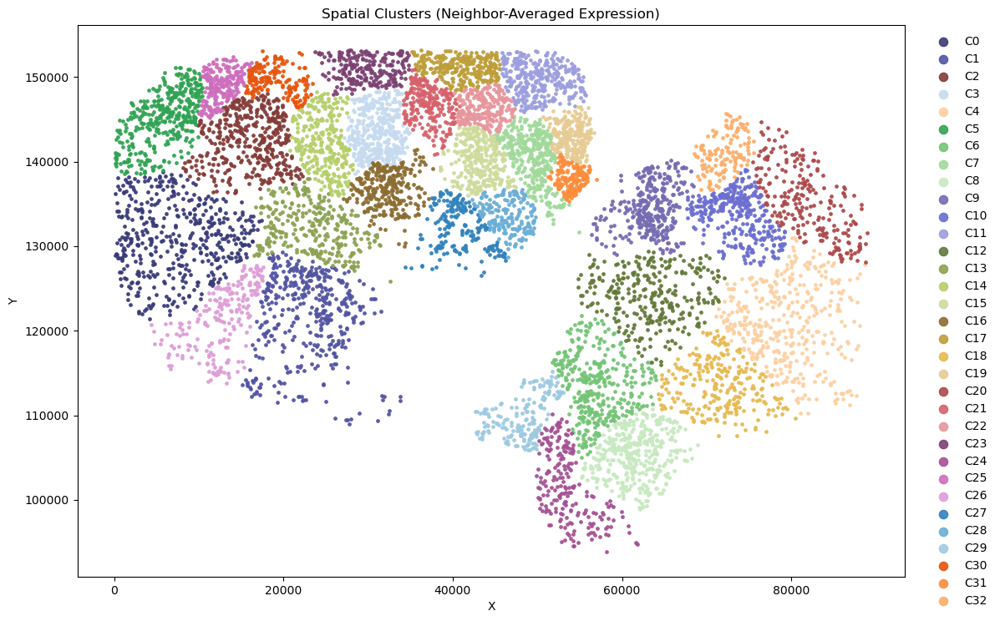

In [6]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

clusters = sorted(a.obs["cluster"].unique())
n = len(clusters)

# Get 40 distinct colors by combining tab20b + tab20c
cmap1 = cm.get_cmap("tab20b", 20)
cmap2 = cm.get_cmap("tab20c", 20)
colors = np.vstack([cmap1(np.arange(20)), cmap2(np.arange(20))])

# If n < 40, just take first n colors
colors = colors[:n]

color_map = {cl: colors[i] for i, cl in enumerate(clusters)}

plt.figure(figsize=(12, 8))

for cl, sub in a.obs.groupby("cluster"):
    plt.scatter(
        sub["X"], sub["Y"],
        s=6,
        alpha=0.9,
        color=color_map[cl],
        label=f"C{cl}"
    )

plt.title("Spatial Clusters (Neighbor-Averaged Expression)")
plt.xlabel("X")
plt.ylabel("Y")
plt.gca().set_aspect("equal", "box")
plt.legend(
    markerscale=3,
    frameon=False,
    bbox_to_anchor=(1.02, 1),
    loc="upper left"
)
plt.tight_layout()
plt.show()


### local-control subtraction

Do perturbation effects and spatial effects combine additively, or do they interact?

In [ ]:
# --- deps ---
import pandas as pd, numpy as np
from pathlib import Path
from sklearn.neighbors import NearestNeighbors

import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# --- config ---
P            = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
COUNT_CSV    =  "matched_merfishcounttable_xy.csv"   # cell_id, X, Y, gene1, ...
PERTURB_CSV  = P / "tumorpooledperturbations.csv"      # rows=genes, cols=cells (>0 => hit)

K_LIST       = [100]    # neighbor sizes for control baseline
OUT_DIR      = Path("./DE_loc_resid_cluster"); OUT_DIR.mkdir(exist_ok=True)

LEIDEN_RES   = 0.6
N_NEIGH_CLUS = 30
RANDOM_STATE = 0

# --- load counts ---
counts = pd.read_csv(COUNT_CSV)
counts["cell_id"] = counts["cell_id"].astype(str).str.strip().str.upper()
meta   = counts[["cell_id","X","Y"]].copy()

expr_cols = [c for c in counts.columns if c not in {"cell_id","X","Y"}]
counts[expr_cols] = counts[expr_cols].apply(pd.to_numeric, errors="coerce").fillna(0.0)
expr = counts.set_index("cell_id")[expr_cols].astype(float)
meta = meta.set_index("cell_id").loc[expr.index]

# --- load perturb + map per cell ---
perturb = pd.read_csv(PERTURB_CSV, index_col=0)
perturb.columns = perturb.columns.astype(str).str.strip().str.upper()
perturb.index   = perturb.index.astype(str).str.strip()

hit = perturb.gt(0)
cell_to_gene = pd.Series(
    np.where(hit.any(axis=0), hit.idxmax(axis=0), "Control"),
    index=hit.columns
)
cell_to_gene = cell_to_gene.reindex(expr.index).fillna("Control")
meta["perturb_gene"] = cell_to_gene

# --- basic arrays ---
cells = expr.index.to_numpy()
XY    = meta.loc[cells, ["X","Y"]].to_numpy()
X     = expr.to_numpy(dtype=float)
G     = expr.columns.to_numpy()

# --- split control vs perturbed ---
is_control = meta.loc[cells, "perturb_gene"].eq("Control").to_numpy()
is_perturb = ~is_control

cells_ctrl = cells[is_control]
cells_pert = cells[is_perturb]

XY_ctrl    = XY[is_control]
XY_pert    = XY[is_perturb]

X_ctrl     = X[is_control]   # control expression
X_pert     = X[is_perturb]   # perturbed expression (raw)

if XY_ctrl.shape[0] == 0 or XY_pert.shape[0] == 0:
    raise ValueError("No control cells or no perturbed cells found.")

# --- kNN on control cells only (spatial neighbors) ---
max_k = min(max(K_LIST), XY_ctrl.shape[0])
nn = NearestNeighbors(n_neighbors=max_k).fit(XY_ctrl)
idx = nn.kneighbors(XY_pert, return_distance=False)      # (n_pert, max_k)

def neighbor_mean(X_ctrl, idx_mat, k):
    k = min(k, idx_mat.shape[1])
    return X_ctrl[idx_mat[:, :k]].mean(axis=1)

# --- compute residuals for each k: perturbed - local control mean ---
resid_dict = {}
for k in K_LIST:
    baseline_k = neighbor_mean(X_ctrl, idx, k)           # local control mean
    resid_k    = X_pert - baseline_k                     # SUBTRACTION here
    resid_dict[k] = resid_k
    print(f"k={k}: residual matrix shape {resid_k.shape}")

# --- function: PCA-free clustering + DE + spatial plot ---
def run_cluster_de_plot(resid_mat, k):
    # AnnData only for perturbed cells
    obs_k = meta.loc[cells_pert, ["X","Y","perturb_gene"]].copy()
    a = ad.AnnData(resid_mat, obs=obs_k, var=pd.DataFrame(index=G))
    a.obs_names = cells_pert
    a.var_names = G

    # residuals can be negative -> no log1p
    sc.pp.neighbors(a, n_neighbors=N_NEIGH_CLUS, use_rep="X", metric="euclidean")
    sc.tl.leiden(a, resolution=LEIDEN_RES, key_added="cluster",
                 random_state=RANDOM_STATE)

    print(f"\n=== k={k} ===")
    print("Cluster sizes:", a.obs["cluster"].value_counts().to_dict())

    # DE cluster vs rest, all genes
    sc.tl.rank_genes_groups(
        a,
        groupby="cluster",
        method="wilcoxon",
        reference="rest",
        tie_correct=True,
        use_raw=False,
        pts=True,
        n_genes=a.n_vars
    )

    de = sc.get.rank_genes_groups_df(a, group=None)
    de.to_csv(OUT_DIR / f"DE_cluster_vs_rest_all_genes_resid_k{k}_PCAfree.csv",
              index=False)
    print("DE saved for k =", k)

    # spatial plot with distinct colors
    clusters = sorted(a.obs["cluster"].unique())
    n = len(clusters)

    cmap = cm.get_cmap("tab20b", 20)
    base_colors = cmap(np.arange(20))

    # Take only every 2nd color to avoid same-hue pairs
    distinct_colors = base_colors[::2]    # yields 10 really distinct colors

    colors = distinct_colors[:n]
    color_map = {cl: colors[i] for i, cl in enumerate(clusters)}

    plt.figure(figsize=(12, 8))
    for cl, sub in a.obs.groupby("cluster"):
        plt.scatter(
            sub["X"], sub["Y"],
            s=6,
            alpha=0.9,
            color=color_map[cl],
            label=f"C{cl}"
        )

    plt.title(f"Spatial clusters (residuals, k={k})")
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.gca().set_aspect("equal","box")
    plt.legend(
        markerscale=3,
        frameon=False,
        bbox_to_anchor=(1.02,1),
        loc="upper left"
    )
    plt.tight_layout()
    plt.show()

    return a

# --- run for k=100 and k=300 ---
adata_k = {}
for k in K_LIST:
    adata_k[k] = run_cluster_de_plot(resid_dict[k], k)


##### find perturbed gene plot (cluster) by location subtraction

In [15]:
# after adata_k[100] is created
adata_100 = adata_k[100]

x_all = adata_100.obs["X"].to_numpy()
y_all = adata_100.obs["Y"].to_numpy()

XMIN_raw, XMAX_raw = x_all.min(), x_all.max()
YMIN_raw, YMAX_raw = y_all.min(), y_all.max()

# --- add ~5% padding on each side (mimics matplotlib default margins) ---
pad_x = 0.05 * (XMAX_raw - XMIN_raw)
pad_y = 0.05 * (YMAX_raw - YMIN_raw)

XMIN = XMIN_raw - pad_x
XMAX = XMAX_raw + pad_x
YMIN = YMIN_raw - pad_y
YMAX = YMAX_raw + pad_y

print("Padded global limits:")
print("  X:", XMIN, XMAX)
print("  Y:", YMIN, YMAX)

# get cluster labels from k=100 AnnData
clusters_all = sorted(adata_100.obs["cluster"].unique())

# build color palette identical to main spatial plot
cmap = cm.get_cmap("tab20b", 20)
base_colors = cmap(np.arange(20))       # 20 tab20b colors
distinct_colors = base_colors[::2]      # take every 2nd → 10 distinct colors

# map cluster → color
cluster_color = {
    cl: distinct_colors[i % len(distinct_colors)]
    for i, cl in enumerate(clusters_all)
}

print("Cluster → color mapping:", cluster_color)

Padded global limits:
  X: -4357.117462333082 93425.82722933336
  Y: 90929.55704006169 156109.20138797013
Cluster → color mapping: {'0': array([0.22352941, 0.23137255, 0.4745098 , 1.        ]), '1': array([0.41960784, 0.43137255, 0.81176471, 1.        ]), '2': array([0.38823529, 0.4745098 , 0.22352941, 1.        ]), '3': array([0.70980392, 0.81176471, 0.41960784, 1.        ]), '4': array([0.54901961, 0.42745098, 0.19215686, 1.        ])}


/var/folders/df/6ly7fyfn1ds6r9brqjdcjjn00000gn/T/ipykernel_15645/2168169553.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab20b", 20)


In [ ]:
def make_per_gene_plots(adata, out_dir):
    obs = adata.obs.copy()
    obs["cluster"] = obs["cluster"].astype(str)

    # background = all perturbed cells
    bg_X = obs["X"].to_numpy()
    bg_Y = obs["Y"].to_numpy()

    genes = sorted(g for g in obs["perturb_gene"].unique() if g != "Control")

    for g in genes:
        sub = obs[obs["perturb_gene"] == g]

        # (A) spatial clusters (gene only)
        plt.figure(figsize=(12, 8))
        for cl, df_cl in sub.groupby("cluster"):
            plt.scatter(
                df_cl["X"], df_cl["Y"],
                s=6,
                alpha=0.9,
                color=cluster_color[cl],
                label=f"C{cl}"
            )

        plt.title(f"{g}: Spatial clusters")
        plt.xlabel("X"); plt.ylabel("Y")
        plt.xlim(XMIN, XMAX)
        plt.ylim(YMIN, YMAX)
        plt.gca().set_aspect("equal", "box")
        plt.legend(
        markerscale=3,
        frameon=False,
        bbox_to_anchor=(1.02,1),
        loc="upper left")
        plt.tight_layout()
        plt.savefig(out_dir / f"{g}_A_spatial_clusters_k100.png", dpi=300)
        plt.show()
        plt.close()

        # (B) highlight vs others (grey)
        plt.figure(figsize=(12, 8))

        plt.scatter(
            bg_X, bg_Y,
            s=5,
            alpha=0.25,
            color="lightgrey",
            label="Other cells"
        )
        plt.scatter(
            sub["X"], sub["Y"],
            s=12,
            alpha=0.9,
            color="dodgerblue",
            label=f"{g} cells (n={len(sub)})"
        )

        plt.title(f"{g}: highlighted vs others (grey)")
        plt.xlabel("X"); plt.ylabel("Y")
        plt.xlim(XMIN, XMAX)
        plt.ylim(YMIN, YMAX)
        plt.gca().set_aspect("equal", "box")
        plt.legend(
        frameon=False,
        bbox_to_anchor=(1.02,1),
        loc="upper left")
        plt.tight_layout()
        plt.savefig(out_dir / f"{g}_B_highlight_vs_others_k100.png", dpi=300)
        plt.show()
        plt.close()

make_per_gene_plots(adata_100, OUT_DIR)

##### 4 boxplot, find 2 obvious clusters with nearby control

Expression matrix shape: (9432, 500)

Perturbation counts:
perturbation
Control    4264
IRF3        459
IRF5        410
IRAK4       398
IRF7        330
Name: count, dtype: int64

Cluster sizes:
cluster
0    3903
1    2580
2    2444
3     505
Name: count, dtype: int64


/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


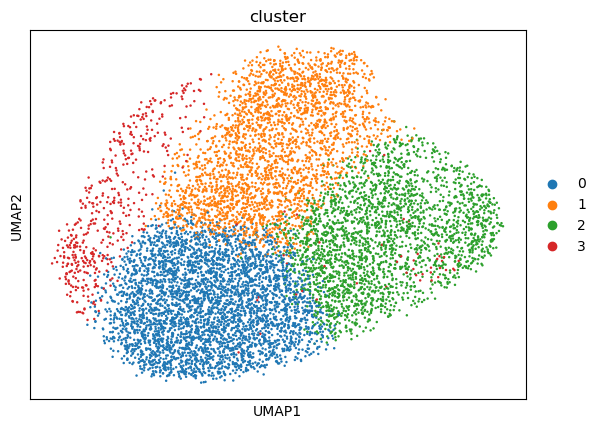

<Figure size 640x480 with 0 Axes>

/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


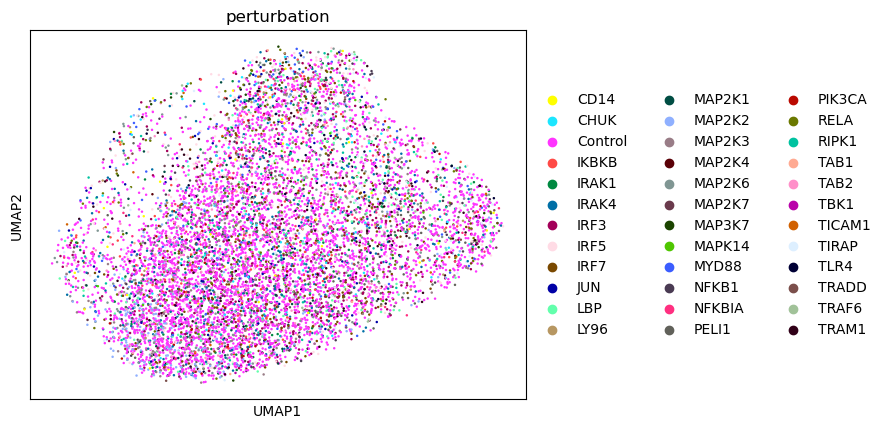

<Figure size 640x480 with 0 Axes>

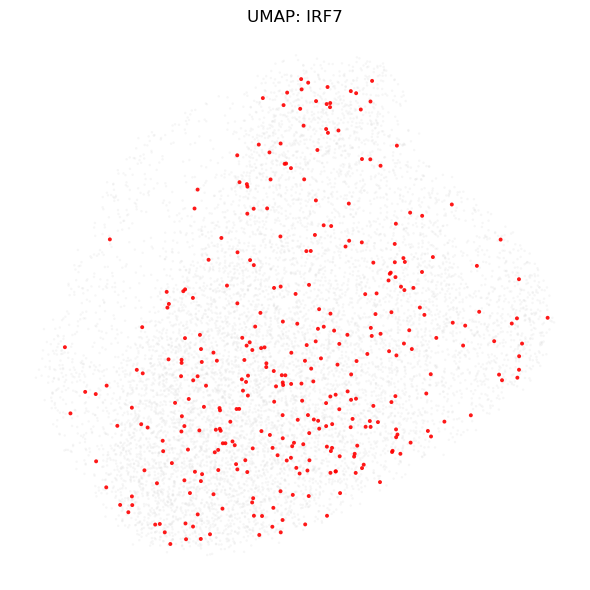

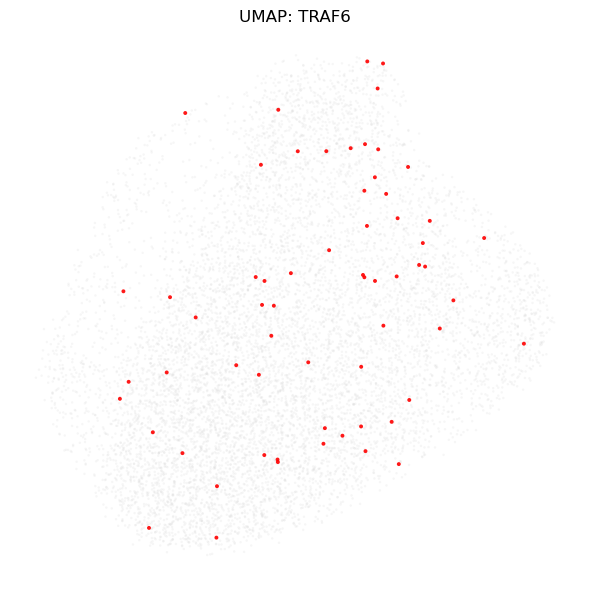

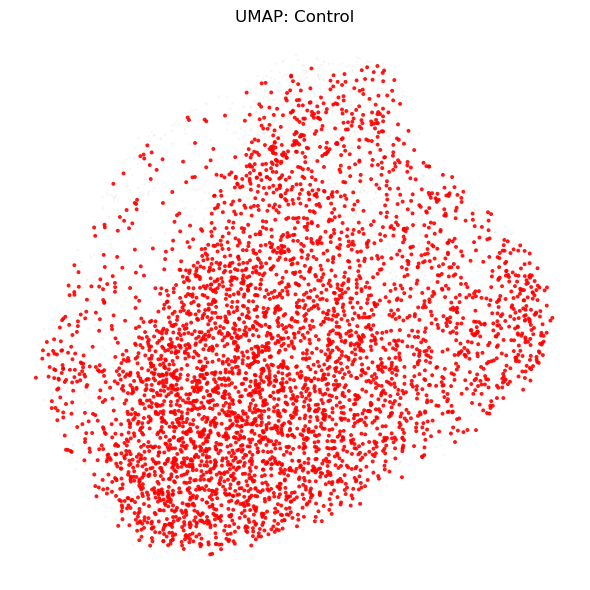

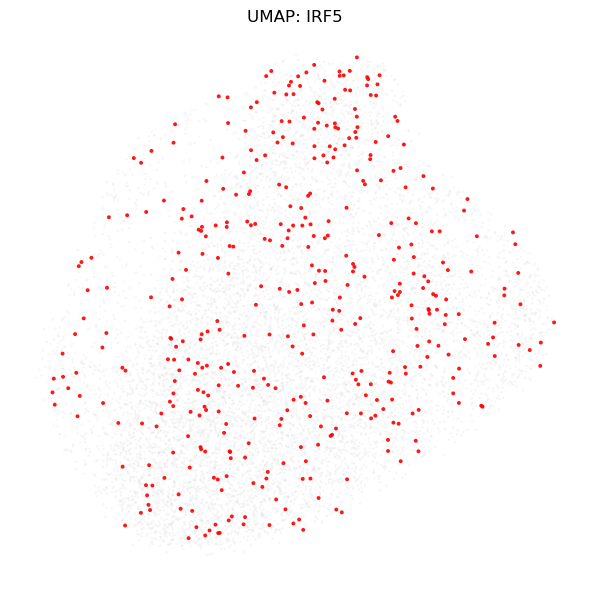

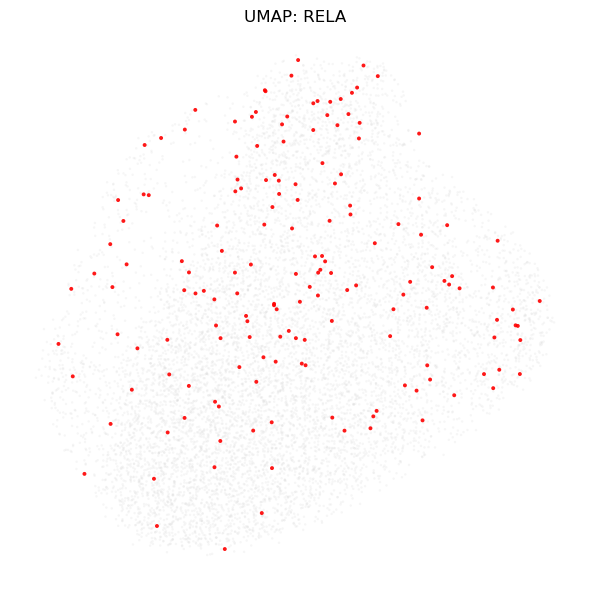

...

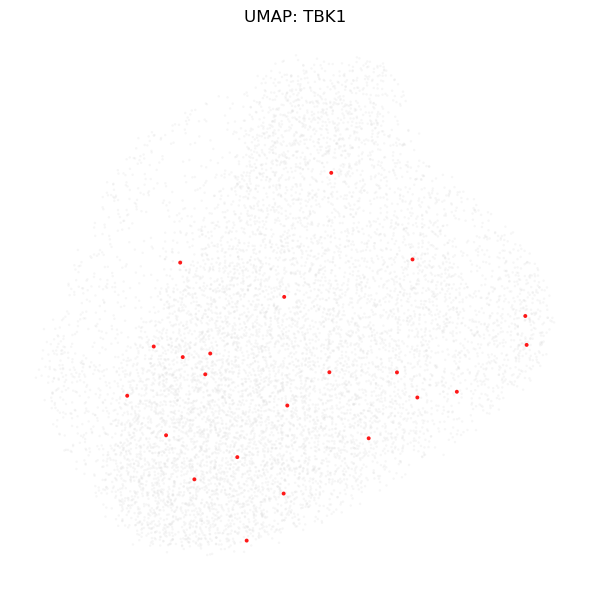

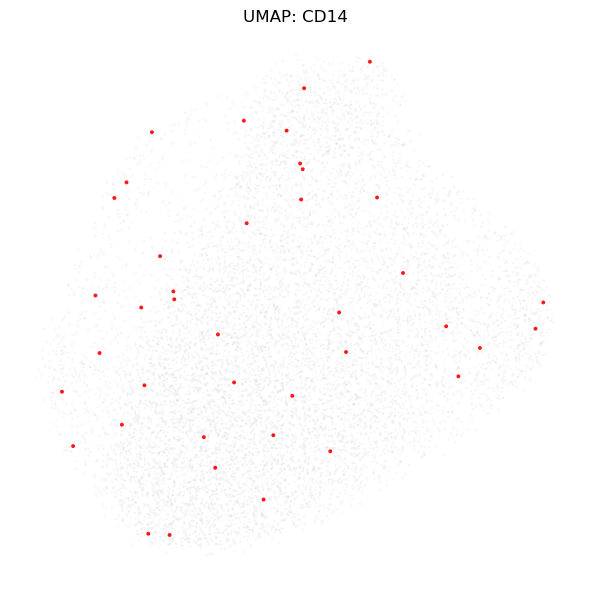

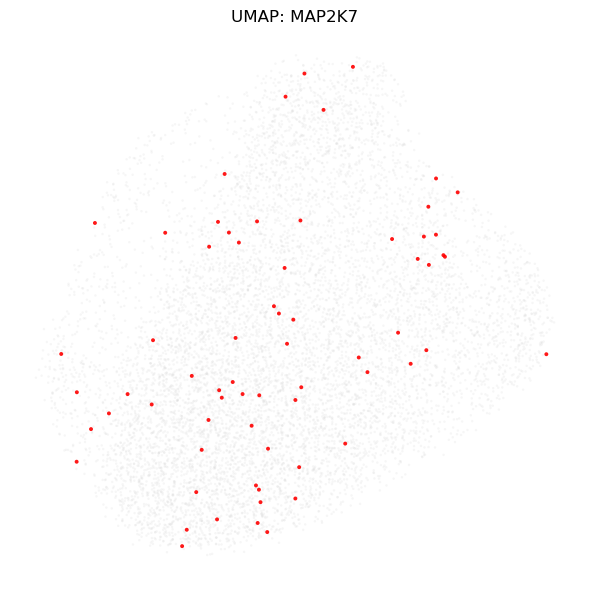

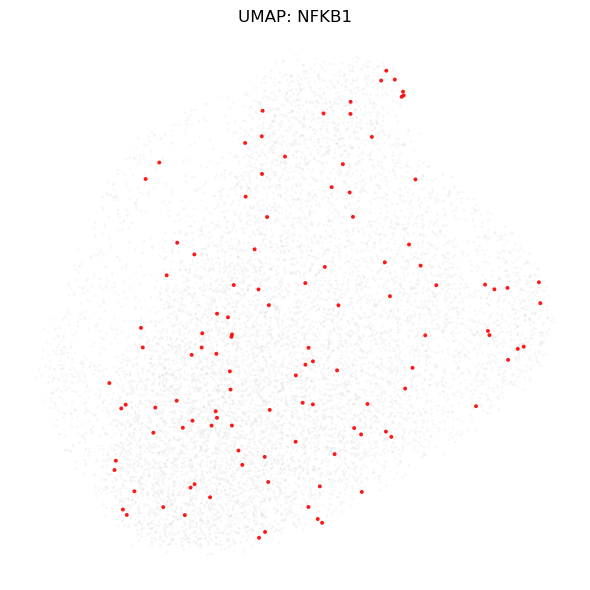

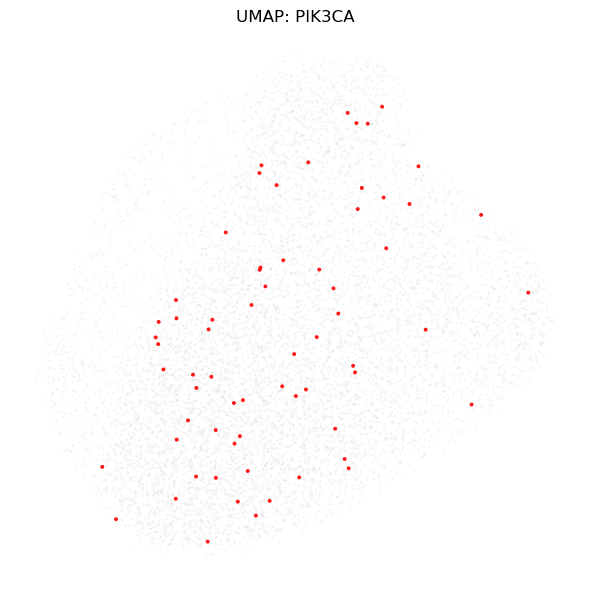


Saved smoothed AnnData to: data/adata_smoothed_simple.h5ad


In [22]:
# --- deps ---
import os
from pathlib import Path

import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt

# --- paths ---
P           = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
COUNT_CSV   =  "matched_merfishcounttable_xy.csv"        # cell_id, X, Y, gene1, ...
PERTURB_CSV = P / "tumorpooledperturbations.csv"            # rows=genes, cols=cells (>0 => hit)
OUT_DIR     = Path("data"); OUT_DIR.mkdir(exist_ok=True)
FIG_DIR     = Path("fig");  FIG_DIR.mkdir(exist_ok=True)

CONTROL_LABEL = "Control"

# =========================
# 1. Load counts + metadata
# =========================
counts = pd.read_csv(COUNT_CSV)
counts["cell_id"] = counts["cell_id"].astype(str).str.strip().str.upper()

meta = counts[["cell_id", "X", "Y"]].copy()

expr_cols = [c for c in counts.columns if c not in {"cell_id", "X", "Y"}]
counts[expr_cols] = counts[expr_cols].apply(pd.to_numeric, errors="coerce").fillna(0.0)

expr = counts.set_index("cell_id")[expr_cols].astype(float)
meta = meta.set_index("cell_id").loc[expr.index]

print("Expression matrix shape:", expr.shape)

# ======================================
# 2. Load perturbations, map per cell
# ======================================
perturb = pd.read_csv(PERTURB_CSV, index_col=0)
perturb.columns = perturb.columns.astype(str).str.strip().str.upper()
perturb.index   = perturb.index.astype(str).str.strip()

hit = perturb.gt(0)
cell_to_gene = pd.Series(
    np.where(hit.any(axis=0), hit.idxmax(axis=0), CONTROL_LABEL),
    index=hit.columns
)
cell_to_gene = cell_to_gene.reindex(expr.index).fillna(CONTROL_LABEL)
meta["perturbation"] = cell_to_gene

print("\nPerturbation counts:")
print(meta["perturbation"].value_counts().head())

# =========================
# 3. Build AnnData + smooth
# =========================
adata = ad.AnnData(expr)
adata.obs = meta.copy()
adata.var_names = expr.columns

# simple global normalization + log1p as smoothed expression
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# =========================
# 4. Neighbors, UMAP, Leiden
# =========================
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=30, random_state=0)
sc.tl.umap(adata, random_state=0)
sc.tl.leiden(adata, resolution=0.6, key_added="cluster")

print("\nCluster sizes:")
print(adata.obs["cluster"].value_counts())

# =========================
# 5. UMAP plots to inspect clusters
# =========================

# UMAP colored by cluster
sc.pl.umap(adata, color=["cluster"], wspace=0.4)
plt.savefig(FIG_DIR / "umap_clusters_smoothed.png", dpi=300, bbox_inches="tight")
plt.show()

# UMAP colored by perturbation
sc.pl.umap(adata, color=["perturbation"], wspace=0.4)
plt.savefig(FIG_DIR / "umap_perturbation_smoothed.png", dpi=300, bbox_inches="tight")
plt.show()

# optional: per-perturbation UMAPs (small multiples)
for pert in meta["perturbation"].unique():
    mask = adata.obs["perturbation"] == pert
    if mask.sum() < 20:
        continue

    umap_all = adata.obsm["X_umap"]
    umap_sub = umap_all[mask.values, :]

    plt.figure(figsize=(6, 6))
    plt.scatter(umap_all[:, 0], umap_all[:, 1],
                c="lightgrey", s=3, alpha=0.2, edgecolor="none")
    plt.scatter(umap_sub[:, 0], umap_sub[:, 1],
                c="red", s=8, alpha=0.9, edgecolor="none")
    plt.title(f"UMAP: {pert}")
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(FIG_DIR / f"UMAP_{pert}_neighbor_smooth.png", dpi=300, bbox_inches="tight")
    plt.show()
    plt.close()

# save smoothed object for reuse
adata.write_h5ad(OUT_DIR / "adata_smoothed_simple.h5ad")
print("\nSaved smoothed AnnData to:", OUT_DIR / "adata_smoothed_simple.h5ad")

Cluster sizes:
cluster
0    3903
1    2580
2    2444
3     505
Name: count, dtype: int64 



/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/anaconda3/envs/astro-scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


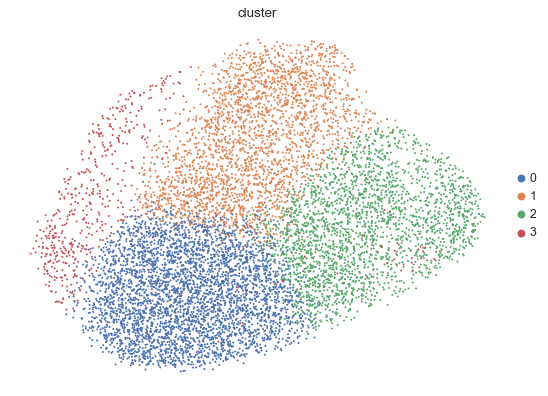

In [ ]:
# --- imports ---
import numpy as np
import pandas as pd
from pathlib import Path

import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# --- paths ---
P           = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")
COUNT_CSV   = "matched_merfishcounttable_xy.csv"
PERTURB_CSV = P / "tumorpooledperturbations.csv"
CONTROL_LABEL = "Control"

# ============================================================
# 1. Load count matrix and metadata
# ============================================================
counts = pd.read_csv(COUNT_CSV)
counts["cell_id"] = counts["cell_id"].astype(str).str.strip().str.upper()

meta = counts[["cell_id", "X", "Y"]].copy()

expr_cols = [c for c in counts.columns if c not in {"cell_id", "X", "Y"}]
counts[expr_cols] = counts[expr_cols].apply(pd.to_numeric, errors="coerce").fillna(0.0)
expr = counts.set_index("cell_id")[expr_cols].astype(float)
meta = meta.set_index("cell_id").loc[expr.index]

# ============================================================
# 2. Load perturbation table → label each cell with gene hit
# ============================================================
perturb = pd.read_csv(PERTURB_CSV, index_col=0)
perturb.columns = perturb.columns.astype(str).str.strip().str.upper()
perturb.index   = perturb.index.astype(str).str.strip()

hit = perturb.gt(0)
cell_to_gene = pd.Series(
    np.where(hit.any(axis=0), hit.idxmax(axis=0), CONTROL_LABEL),
)
cell_to_gene = cell_to_gene.reindex(expr.index).fillna(CONTROL_LABEL)
meta["perturbation"] = cell_to_gene

# ============================================================
# 3. Build AnnData + cluster
# ============================================================
adata = ad.AnnData(expr)
adata.obs = meta.copy()
adata.var_names = expr.columns

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=30, random_state=0)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.6, key_added="cluster")

print("Cluster sizes:")
print(adata.obs["cluster"].value_counts(), "\n")

# For reference: plain cluster UMAP (like your screenshot)
sc.pl.umap(adata, color="cluster")

In [13]:

# ============================================================
# 4. UMAP: gene cells colored by cluster; others grey
# ============================================================
def plot_gene_umap_cluster_vs_grey(adata, gene):

    clusters = sorted(adata.obs["cluster"].astype(str).unique())
    global_colors = adata.uns["cluster_colors"]    # ← Scanpy-stored palette
    
    cluster_color_map = {
        cl: global_colors[i] for i, cl in enumerate(clusters)
    }

    obs = adata.obs.copy()
    x = adata.obsm["X_umap"][:, 0]
    y = adata.obsm["X_umap"][:, 1]

    m_gene = obs["perturbation"] == gene
    m_bg   = ~m_gene

    plt.figure(figsize=(10,8))
    plt.scatter(x[m_bg], y[m_bg], s=6, alpha=0.05, color="lightgrey")

    for cl in clusters:
        mask = m_gene & (obs["cluster"] == cl)
        if mask.sum() > 0:
            plt.scatter(
                x[mask], y[mask], 
                s=20, alpha=0.9, 
                color=cluster_color_map[cl], 
                label=f"{gene} – C{cl}"
            )

    plt.title(f"{gene}: gene cells colored by cluster; others grey")
    plt.xlabel("UMAP1"); plt.ylabel("UMAP2")
    plt.gca().set_aspect("equal", "box")
    plt.legend(frameon=False, bbox_to_anchor=(1.02,1), loc="upper left")
    plt.tight_layout()
    plt.show()

# ============================================================
# 5. Boxplot: cluster1 vs cluster2, gene vs control (raw counts)
# ============================================================
def boxplots_gene_two_clusters(adata, gene, cl1, cl2):
    """
    4 boxplots using expression of `gene`:

      Row 1: cluster cl1 (gene vs Control)
      Row 2: cluster cl2 (gene vs Control)
    """

    if gene not in adata.var_names:
        print(f"  [skip boxplot] gene {gene} not in adata.var_names")
        return

    obs = adata.obs.copy()
    obs["cluster"] = obs["cluster"].astype(str)

    # use expression from adata (raw layer if you have it, else X)
    if "counts" in adata.layers:
        X_gene = adata[:, gene].layers["counts"]
    else:
        X_gene = adata[:, gene].X

    if hasattr(X_gene, "toarray"):
        expr = X_gene.toarray().ravel()
    else:
        expr = np.ravel(X_gene)

    obs["gene_expr"] = expr

    def get_vals(cluster, group):
        m_cl = obs["cluster"] == str(cluster)
        if group == "gene":
            m_pt = obs["perturbation"] == gene
        else:
            m_pt = obs["perturbation"] == CONTROL_LABEL
        return obs.loc[m_cl & m_pt, "gene_expr"].values

    v1_gene = get_vals(cl1, "gene")
    v1_ctrl = get_vals(cl1, "control")
    v2_gene = get_vals(cl2, "gene")
    v2_ctrl = get_vals(cl2, "control")

    print(f"  Cluster {cl1}: gene n={len(v1_gene)}, control n={len(v1_ctrl)}")
    print(f"  Cluster {cl2}: gene n={len(v2_gene)}, control n={len(v2_ctrl)}")

    if (len(v1_gene) == 0 and len(v1_ctrl) == 0) or (len(v2_gene) == 0 and len(v2_ctrl) == 0):
        print("  [skip boxplot] no data in one or both clusters")
        return

    fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharey=True)

    axes[0,0].boxplot(v1_gene, showfliers=False); axes[0,0].set_title(f"C{cl1} – {gene}")
    axes[0,1].boxplot(v1_ctrl, showfliers=False); axes[0,1].set_title(f"C{cl1} – Control")
    axes[1,0].boxplot(v2_gene, showfliers=False); axes[1,0].set_title(f"C{cl2} – {gene}")
    axes[1,1].boxplot(v2_ctrl, showfliers=False); axes[1,1].set_title(f"C{cl2} – Control")

    for ax in axes.flat:
        ax.set_xticks([])

    plt.suptitle(f"{gene}: expression in clusters {cl1} and {cl2}")
    plt.tight_layout()
    plt.show()

In [ ]:
# ============================================================
# 6. Loop over ALL perturbation genes
# ============================================================
all_genes = sorted(g for g in meta["perturbation"].unique() if g != CONTROL_LABEL)
print("Genes found:", all_genes)

for gene in all_genes:
    print("\n====================================")
    print(f"Processing gene: {gene}")
    print("====================================")

    # skip genes not in expression matrix
    if gene not in adata.var_names:
        print(f"  [skip] {gene} not in adata.var_names (no counts column).")
        continue

    # 1) UMAP: gene colored by global cluster colors; others grey
    plot_gene_umap_cluster_vs_grey(adata, gene)

    # 2) pick top 2 clusters for this gene
    gene_obs = adata.obs[adata.obs["perturbation"] == gene]

    if gene_obs.shape[0] < 5:
        print(f"  [skip] {gene} has too few cells ({gene_obs.shape[0]}).")
        continue

    ccounts = gene_obs["cluster"].astype(str).value_counts().sort_values(ascending=False)

    if len(ccounts) < 2:
        print(f"  [skip] {gene} appears in only one cluster.")
        continue

    cl1, cl2 = ccounts.index[0], ccounts.index[1]
    print(f"  Selected clusters for {gene}: {cl1}, {cl2}")

    # 3) boxplots for those clusters
    boxplots_gene_two_clusters(adata, gene, cl1=cl1, cl2=cl2)

-- constrastivevi_normalize --> box plot \
statistical hypothesis, compare mean value \

z1: perturbed gene, z2: location, z3: cell type \
NN -- map (umap) -- cluster

In [19]:
from scipy.stats import mannwhitneyu
import numpy as np

def test_gene_expression(adata, gene, cl1, cl2, control_label="Control", alpha=0.05):
    """
    Tests included:
        1. Same cluster: gene vs control   (C1)
        2. Same cluster: gene vs control   (C2)
        3. Cross clusters: gene vs gene    (C1 vs C2)
        4. Cross clusters: control vs control  (NEW)
    """

    obs = adata.obs.copy()
    obs["cluster"] = obs["cluster"].astype(str)

    # Expression values
    if "counts" in adata.layers:
        vals = adata[:, gene].layers["counts"]
    else:
        vals = adata[:, gene].X

    if hasattr(vals, "toarray"):
        expr = vals.toarray().ravel()
    else:
        expr = np.ravel(vals)

    obs["expr"] = expr

    # ---------- Helpers ----------
    def subset(cluster, perturbed=True, control=False):
        m_cl = obs["cluster"] == str(cluster)
        if perturbed:
            m_pt = obs["perturbation"] == gene
        elif control:
            m_pt = obs["perturbation"] == control_label
        return obs.loc[m_cl & m_pt, "expr"].values

    # Gene groups
    x1_gene = subset(cl1, perturbed=True)
    x1_ctrl = subset(cl1, perturbed=False, control=True)

    x2_gene = subset(cl2, perturbed=True)
    x2_ctrl = subset(cl2, perturbed=False, control=True)

    def run_test(a, b, label):
        if len(a) < 2 or len(b) < 2:
            print(f"[skip stats] Not enough cells for {label}")
            return

        stat, p = mannwhitneyu(a, b, alternative="two-sided")
        mean_diff = np.mean(a) - np.mean(b)
        effect = mean_diff / (np.std(np.concatenate([a, b])) + 1e-8)
        sig = "SIGNIFICANT" if p < alpha else "ns"

        print(f"\n--- {label} ---")
        print(f"n1={len(a)}, n2={len(b)}")
        print(f"p={p:.3e} ({sig})")
        print(f"mean diff={mean_diff:.4f}")
        print(f"effect size d={effect:.4f}")

    # 1. gene vs control in cluster 1
    run_test(x1_gene, x1_ctrl, f"{gene} vs Control in C{cl1}")

    # 2. gene vs control in cluster 2
    run_test(x2_gene, x2_ctrl, f"{gene} vs Control in C{cl2}")

    # 3. gene in cluster 1 vs gene in cluster 2
    run_test(x1_gene, x2_gene, f"{gene} in C{cl1} vs C{cl2}")

    # 4. control in cluster 1 vs control in cluster 2  <<< NEW TEST
    run_test(x1_ctrl, x2_ctrl, f"Control in C{cl1} vs Control in C{cl2}  (baseline)")

Genes found: ['CD14', 'CHUK', 'IKBKB', 'IRAK1', 'IRAK4', 'IRF3', 'IRF5', 'IRF7', 'JUN', 'LBP', 'LY96', 'MAP2K1', 'MAP2K2', 'MAP2K3', 'MAP2K4', 'MAP2K6', 'MAP2K7', 'MAP3K7', 'MAPK14', 'MYD88', 'NFKB1', 'NFKBIA', 'PELI1', 'PIK3CA', 'RELA', 'RIPK1', 'TAB1', 'TAB2', 'TBK1', 'TICAM1', 'TIRAP', 'TLR4', 'TRADD', 'TRAF6', 'TRAM1']

Processing gene: CD14


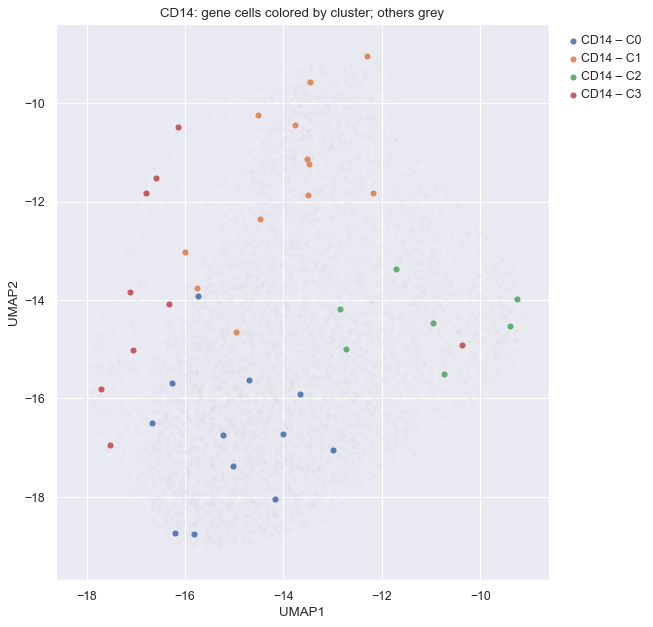

  Selected clusters for CD14: 0, 1
  Cluster 0: gene n=12, control n=1932
  Cluster 1: gene n=12, control n=1049


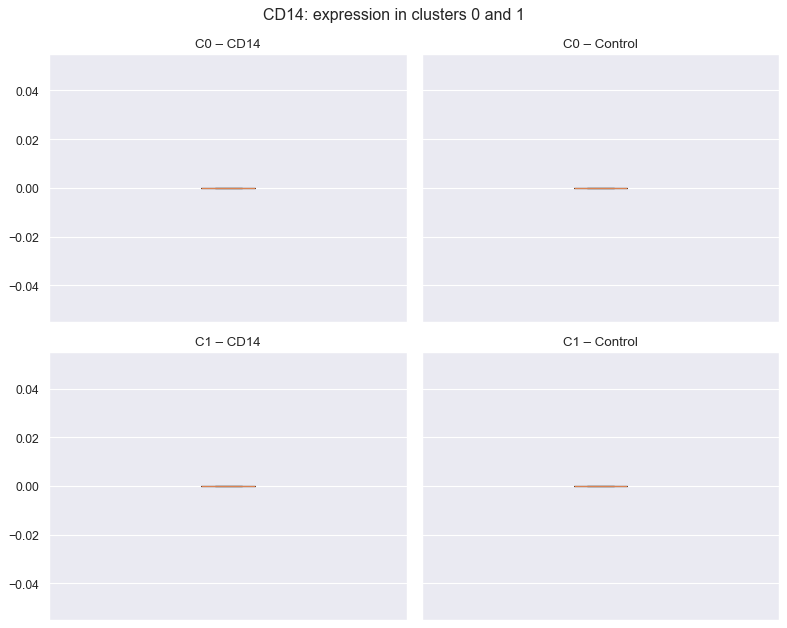


--- CD14 vs Control in C0 ---
n1=12, n2=1932
p=6.250e-01 (ns)
mean diff=-0.1735
effect size d=-0.1617

--- CD14 vs Control in C1 ---
n1=12, n2=1049
p=3.907e-01 (ns)
mean diff=-0.2441
effect size d=-0.2481

--- CD14 in C0 vs C1 ---
n1=12, n2=12
p=3.593e-01 (ns)
mean diff=0.2198
effect size d=0.4170

--- Control in C0 vs Control in C1  (baseline) ---
n1=1932, n2=1049
p=1.314e-06 (SIGNIFICANT)
mean diff=0.1493
effect size d=0.1425

Processing gene: CHUK
  [skip] CHUK not in adata.var_names (no counts column).

Processing gene: IKBKB


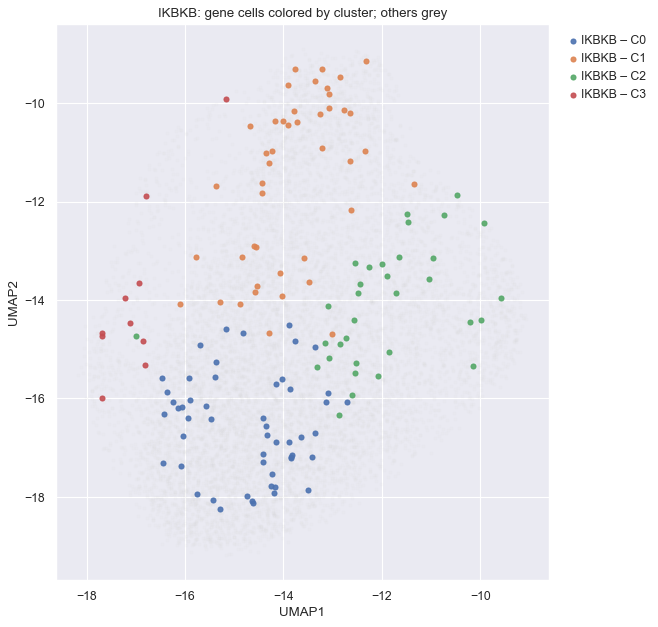

  Selected clusters for IKBKB: 0, 1
  Cluster 0: gene n=52, control n=1932
  Cluster 1: gene n=44, control n=1049


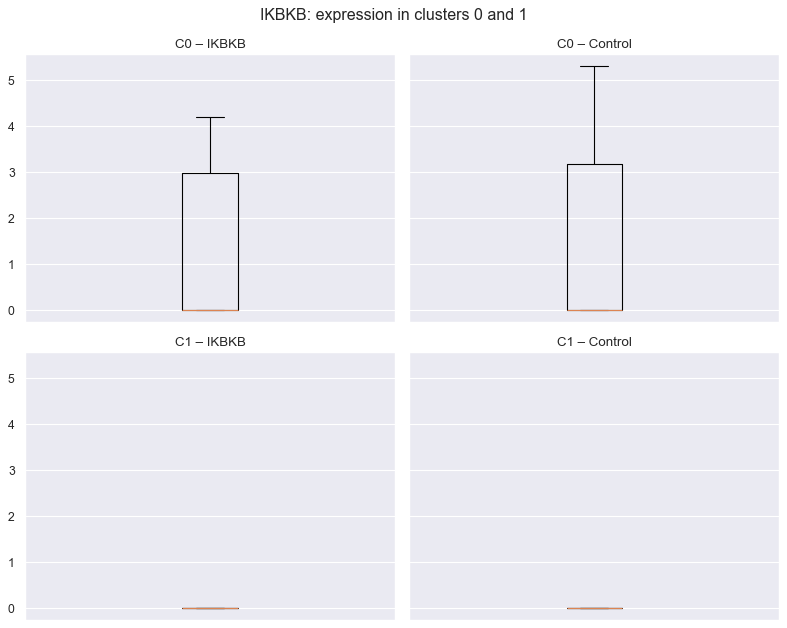


--- IKBKB vs Control in C0 ---
n1=52, n2=1932
p=8.330e-01 (ns)
mean diff=-0.0387
effect size d=-0.0232

--- IKBKB vs Control in C1 ---
n1=44, n2=1049
p=8.584e-02 (ns)
mean diff=-0.4478
effect size d=-0.2496

--- IKBKB in C0 vs C1 ---
n1=52, n2=44
p=9.827e-03 (SIGNIFICANT)
mean diff=0.7028
effect size d=0.4364

--- Control in C0 vs Control in C1  (baseline) ---
n1=1932, n2=1049
p=6.779e-06 (SIGNIFICANT)
mean diff=0.2937
effect size d=0.1705

Processing gene: IRAK1
  [skip] IRAK1 not in adata.var_names (no counts column).

Processing gene: IRAK4
  [skip] IRAK4 not in adata.var_names (no counts column).

Processing gene: IRF3


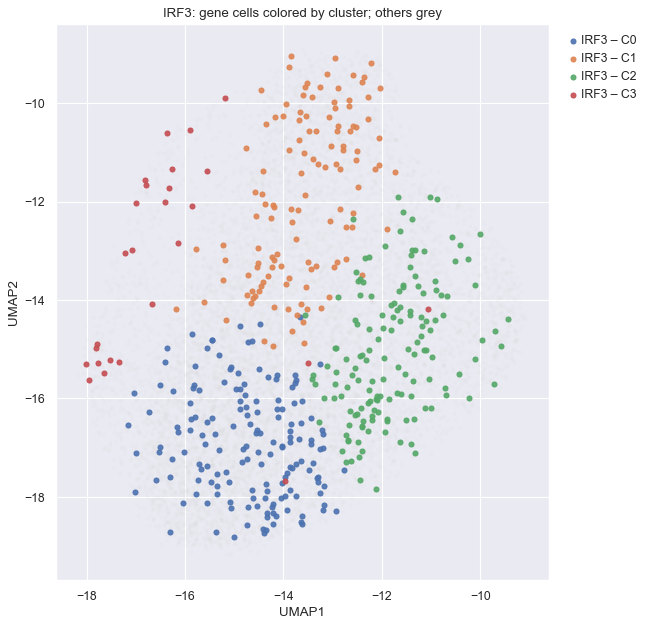

  Selected clusters for IRF3: 0, 2
  Cluster 0: gene n=160, control n=1932
  Cluster 2: gene n=150, control n=1079


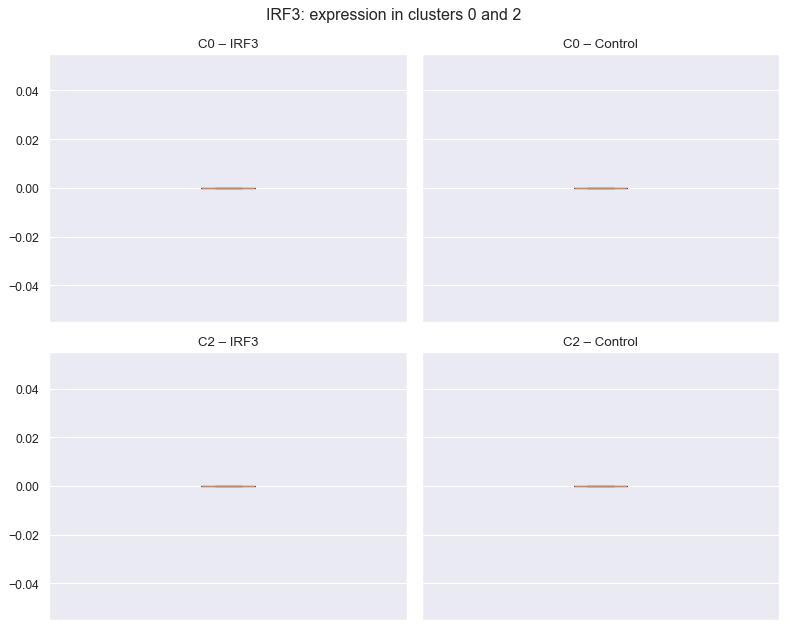


--- IRF3 vs Control in C0 ---
n1=160, n2=1932
p=5.461e-01 (ns)
mean diff=-0.0472
effect size d=-0.0462

--- IRF3 vs Control in C2 ---
n1=150, n2=1079
p=9.961e-01 (ns)
mean diff=-0.0037
effect size d=-0.0032

--- IRF3 in C0 vs C2 ---
n1=160, n2=150
p=3.719e-01 (ns)
mean diff=-0.1122
effect size d=-0.1065

--- Control in C0 vs Control in C2  (baseline) ---
n1=1932, n2=1079
p=1.562e-01 (ns)
mean diff=-0.0686
effect size d=-0.0641

Processing gene: IRF5


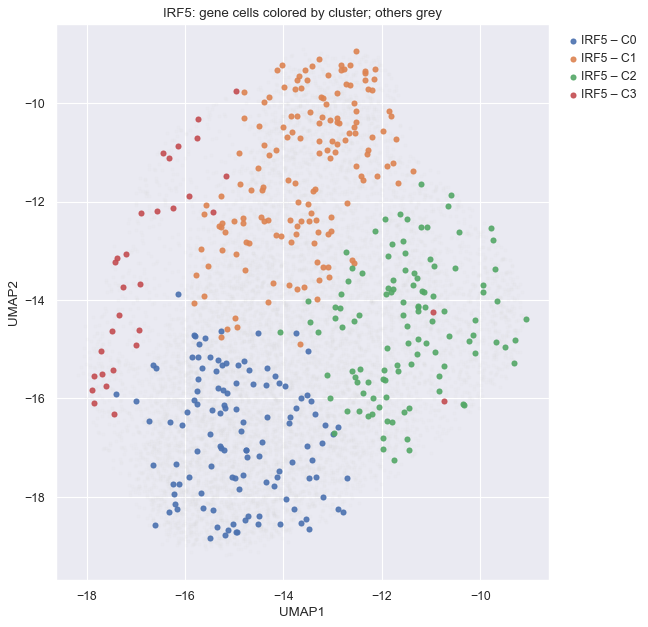

  Selected clusters for IRF5: 1, 0
  Cluster 1: gene n=149, control n=1049
  Cluster 0: gene n=119, control n=1932


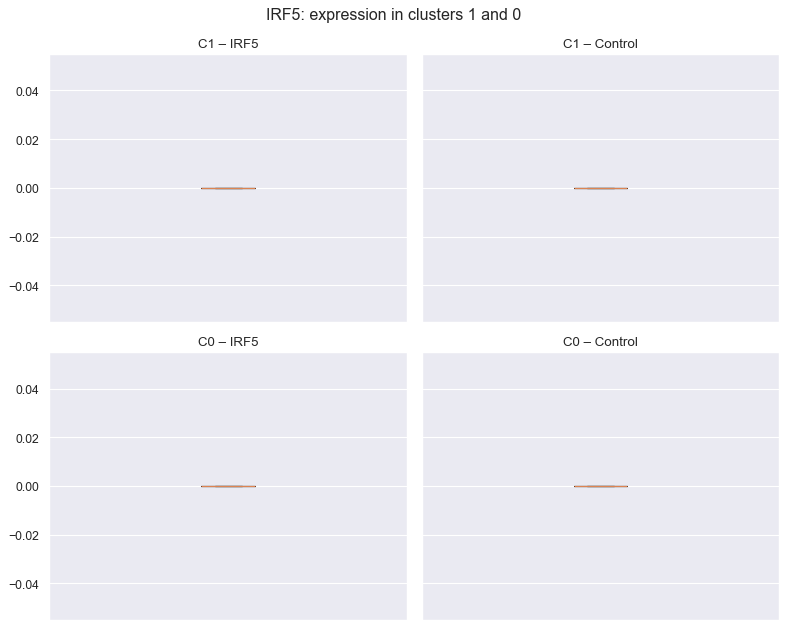


--- IRF5 vs Control in C1 ---
n1=149, n2=1049
p=3.179e-01 (ns)
mean diff=-0.0278
effect size d=-0.0873

--- IRF5 vs Control in C0 ---
n1=119, n2=1932
p=5.913e-01 (ns)
mean diff=-0.0168
effect size d=-0.0442

--- IRF5 in C1 vs C0 ---
n1=149, n2=119
p=2.664e-01 (ns)
mean diff=-0.0295
effect size d=-0.1378

--- Control in C1 vs Control in C0  (baseline) ---
n1=1049, n2=1932
p=6.156e-02 (ns)
mean diff=-0.0185
effect size d=-0.0501

Processing gene: IRF7
  [skip] IRF7 not in adata.var_names (no counts column).

Processing gene: JUN


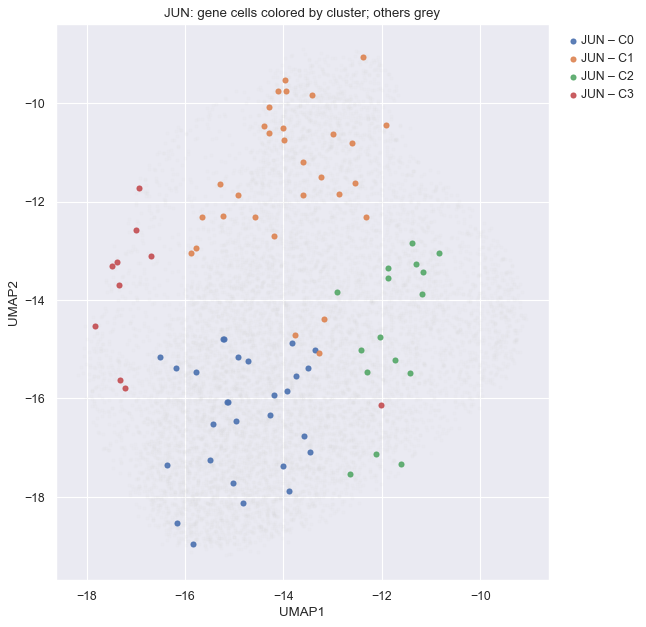

  Selected clusters for JUN: 1, 0
  Cluster 1: gene n=30, control n=1049
  Cluster 0: gene n=28, control n=1932


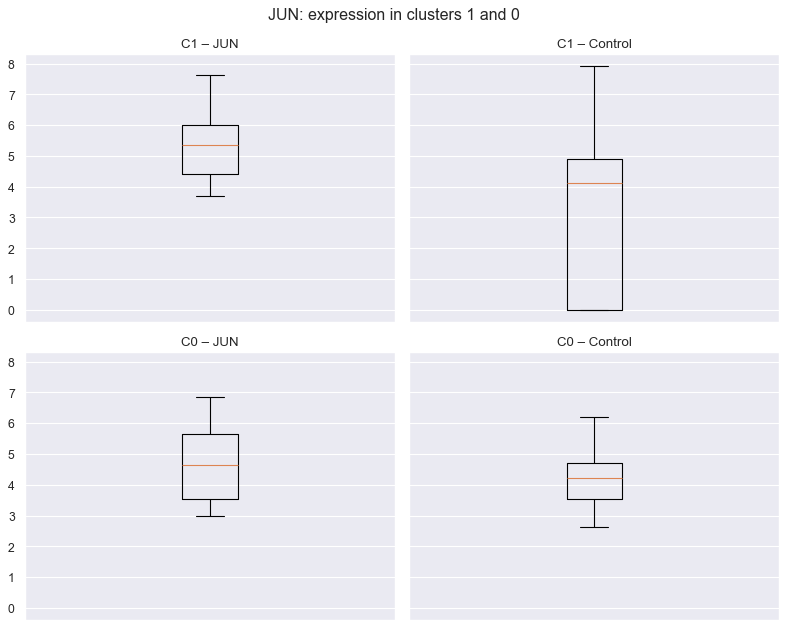


--- JUN vs Control in C1 ---
n1=30, n2=1049
p=4.672e-06 (SIGNIFICANT)
mean diff=1.7170
effect size d=0.7090

--- JUN vs Control in C0 ---
n1=28, n2=1932
p=1.700e-02 (SIGNIFICANT)
mean diff=0.5806
effect size d=0.3783

--- JUN in C1 vs C0 ---
n1=30, n2=28
p=2.426e-01 (ns)
mean diff=0.2597
effect size d=0.1259

--- Control in C1 vs Control in C0  (baseline) ---
n1=1049, n2=1932
p=3.672e-04 (SIGNIFICANT)
mean diff=-0.8767
effect size d=-0.4538

Processing gene: LBP
  [skip] LBP not in adata.var_names (no counts column).

Processing gene: LY96
  [skip] LY96 not in adata.var_names (no counts column).

Processing gene: MAP2K1


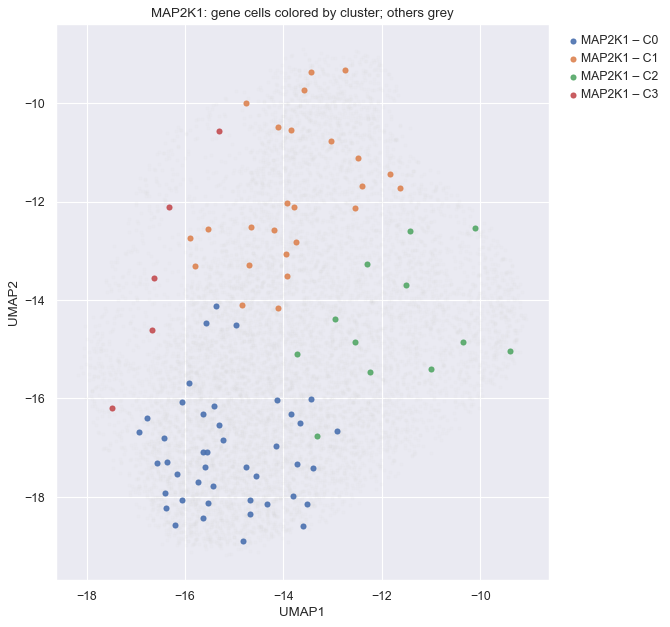

  Selected clusters for MAP2K1: 0, 1
  Cluster 0: gene n=43, control n=1932
  Cluster 1: gene n=25, control n=1049


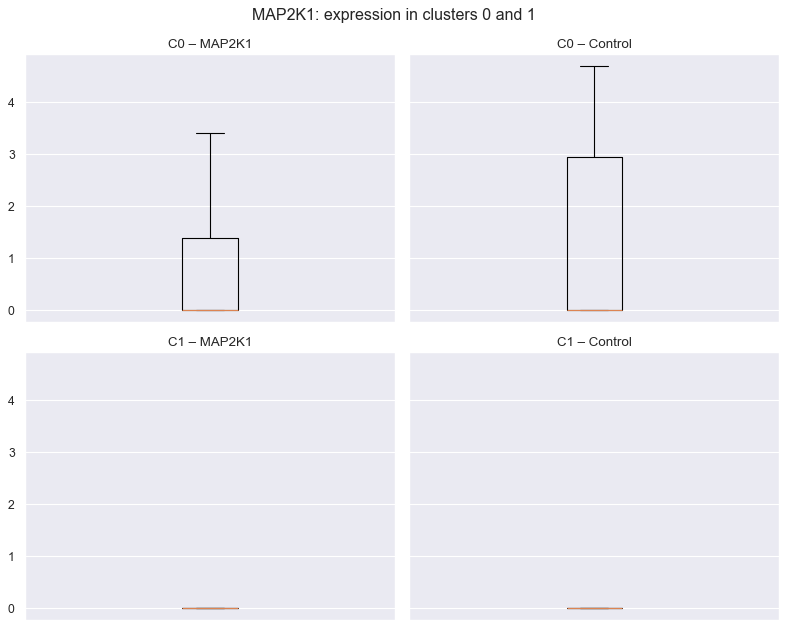


--- MAP2K1 vs Control in C0 ---
n1=43, n2=1932
p=5.412e-01 (ns)
mean diff=-0.1527
effect size d=-0.0982

--- MAP2K1 vs Control in C1 ---
n1=25, n2=1049
p=3.796e-01 (ns)
mean diff=-0.2028
effect size d=-0.1652

--- MAP2K1 in C0 vs C1 ---
n1=43, n2=25
p=3.524e-02 (SIGNIFICANT)
mean diff=0.6555
effect size d=0.4908

--- Control in C0 vs Control in C1  (baseline) ---
n1=1932, n2=1049
p=2.725e-28 (SIGNIFICANT)
mean diff=0.6053
effect size d=0.4092

Processing gene: MAP2K2
  [skip] MAP2K2 not in adata.var_names (no counts column).

Processing gene: MAP2K3
  [skip] MAP2K3 not in adata.var_names (no counts column).

Processing gene: MAP2K4
  [skip] MAP2K4 not in adata.var_names (no counts column).

Processing gene: MAP2K6
  [skip] MAP2K6 not in adata.var_names (no counts column).

Processing gene: MAP2K7
  [skip] MAP2K7 not in adata.var_names (no counts column).

Processing gene: MAP3K7
  [skip] MAP3K7 not in adata.var_names (no counts column).

Processing gene: MAPK14
  [skip] MAPK14 not in 

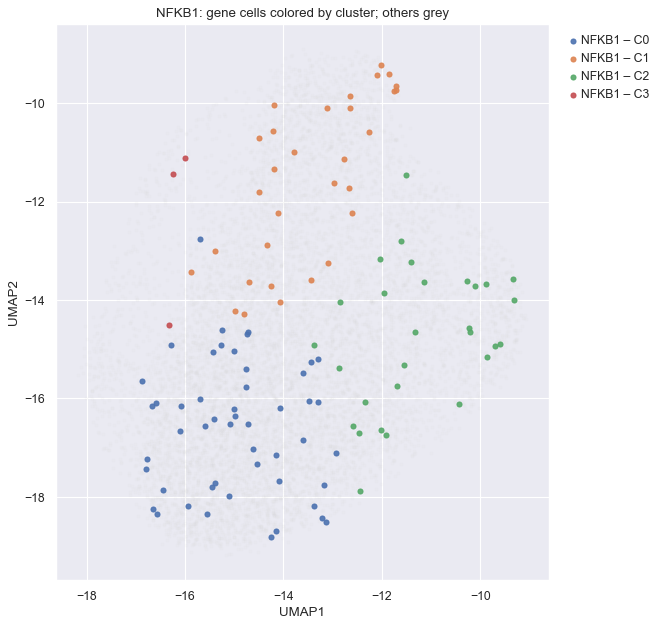

  Selected clusters for NFKB1: 0, 1
  Cluster 0: gene n=50, control n=1932
  Cluster 1: gene n=31, control n=1049


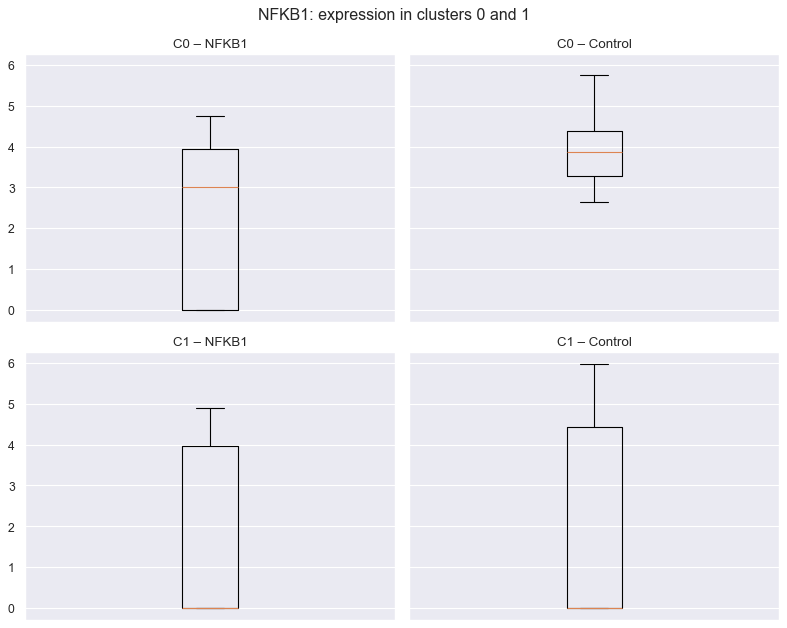


--- NFKB1 vs Control in C0 ---
n1=50, n2=1932
p=7.167e-06 (SIGNIFICANT)
mean diff=-1.3440
effect size d=-0.8399

--- NFKB1 vs Control in C1 ---
n1=31, n2=1049
p=8.217e-02 (ns)
mean diff=-0.6651
effect size d=-0.2938

--- NFKB1 in C0 vs C1 ---
n1=50, n2=31
p=2.810e-01 (ns)
mean diff=0.6543
effect size d=0.3240

--- Control in C0 vs Control in C1  (baseline) ---
n1=1932, n2=1049
p=2.541e-22 (SIGNIFICANT)
mean diff=1.3333
effect size d=0.6820

Processing gene: NFKBIA


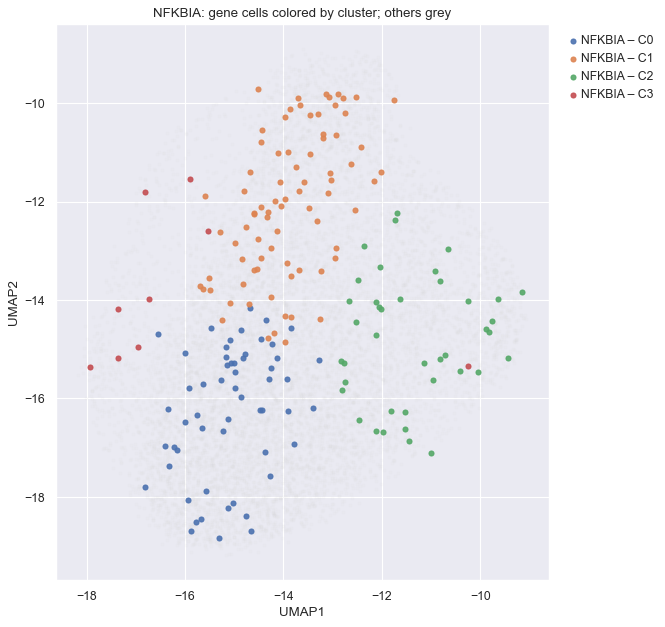

  Selected clusters for NFKBIA: 1, 0
  Cluster 1: gene n=79, control n=1049
  Cluster 0: gene n=56, control n=1932


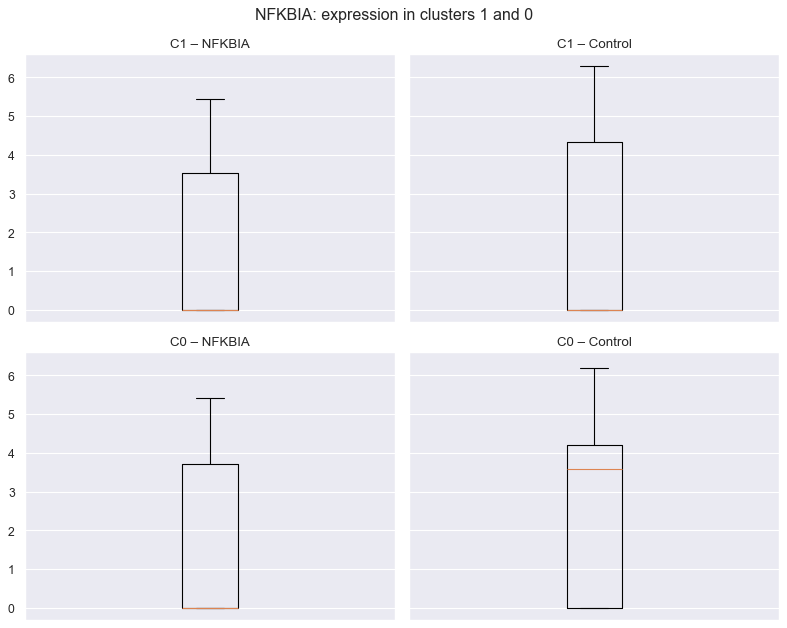


--- NFKBIA vs Control in C1 ---
n1=79, n2=1049
p=1.398e-02 (SIGNIFICANT)
mean diff=-0.6650
effect size d=-0.2960

--- NFKBIA vs Control in C0 ---
n1=56, n2=1932
p=1.157e-04 (SIGNIFICANT)
mean diff=-1.1827
effect size d=-0.6355

--- NFKBIA in C1 vs C0 ---
n1=79, n2=56
p=1.789e-01 (ns)
mean diff=-0.5117
effect size d=-0.2535

--- Control in C1 vs Control in C0  (baseline) ---
n1=1049, n2=1932
p=1.660e-15 (SIGNIFICANT)
mean diff=-1.0295
effect size d=-0.4997

Processing gene: PELI1
  [skip] PELI1 not in adata.var_names (no counts column).

Processing gene: PIK3CA


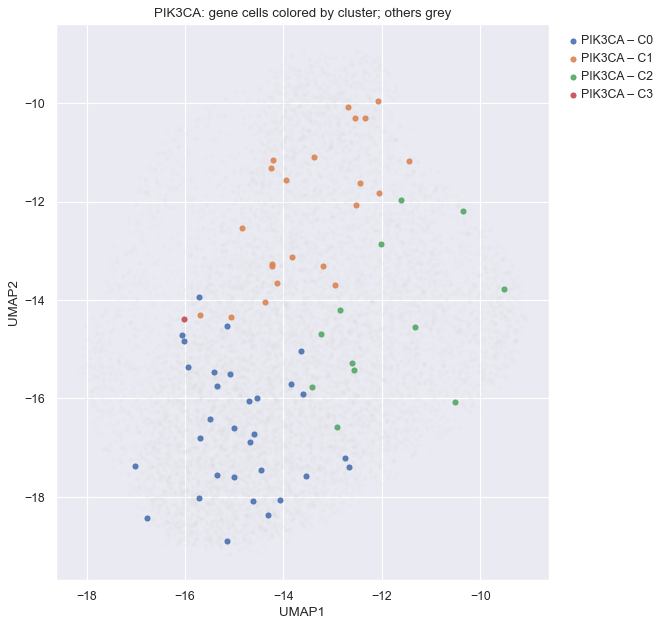

  Selected clusters for PIK3CA: 0, 1
  Cluster 0: gene n=31, control n=1932
  Cluster 1: gene n=22, control n=1049


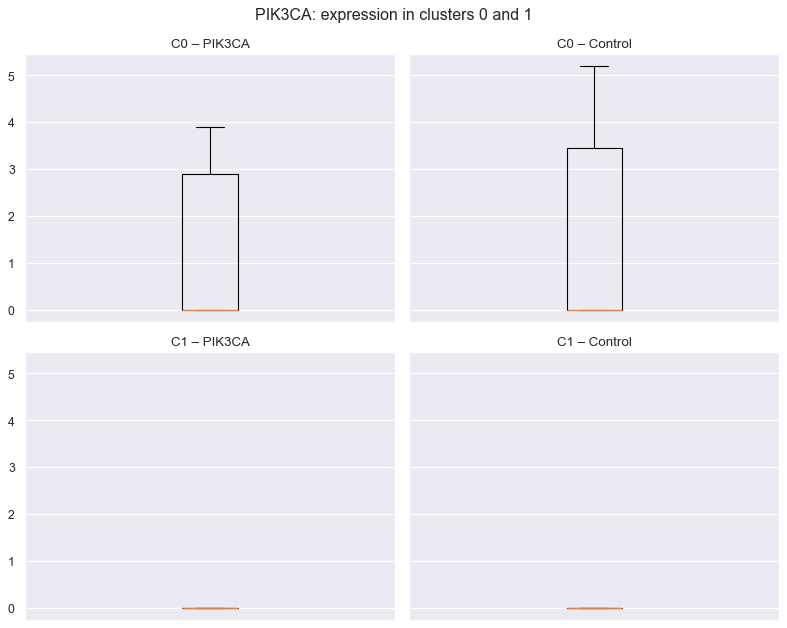


--- PIK3CA vs Control in C0 ---
n1=31, n2=1932
p=4.081e-02 (SIGNIFICANT)
mean diff=-0.6612
effect size d=-0.3702

--- PIK3CA vs Control in C1 ---
n1=22, n2=1049
p=1.302e-01 (ns)
mean diff=-0.5068
effect size d=-0.3248

--- PIK3CA in C0 vs C1 ---
n1=31, n2=22
p=3.793e-02 (SIGNIFICANT)
mean diff=0.8053
effect size d=0.5915

--- Control in C0 vs Control in C1  (baseline) ---
n1=1932, n2=1049
p=5.216e-39 (SIGNIFICANT)
mean diff=0.9597
effect size d=0.5408

Processing gene: RELA


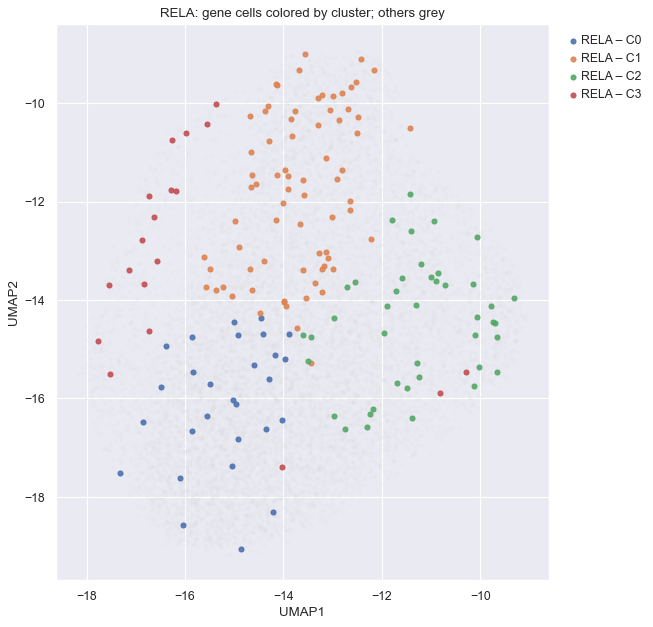

  Selected clusters for RELA: 1, 2
  Cluster 1: gene n=73, control n=1049
  Cluster 2: gene n=42, control n=1079


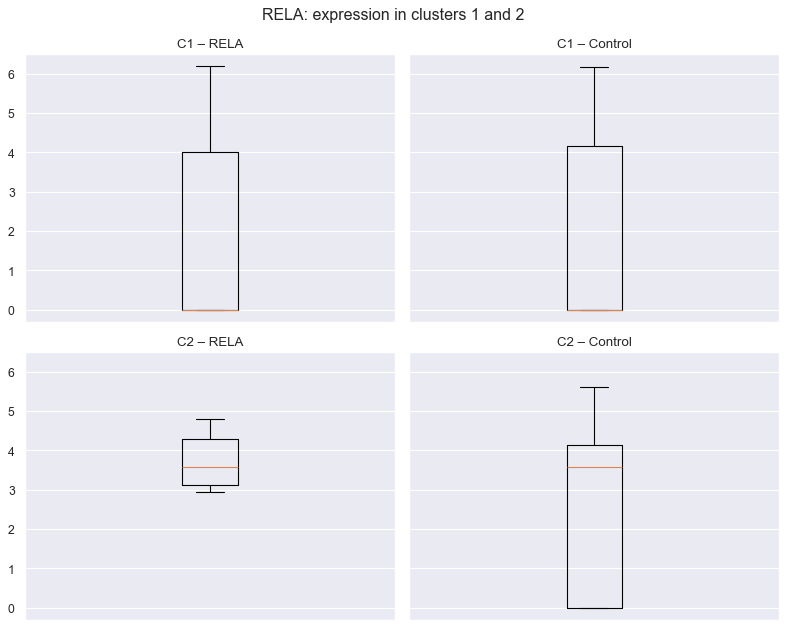


--- RELA vs Control in C1 ---
n1=73, n2=1049
p=2.813e-01 (ns)
mean diff=-0.2559
effect size d=-0.1175

--- RELA vs Control in C2 ---
n1=42, n2=1079
p=4.028e-01 (ns)
mean diff=0.3472
effect size d=0.1857

--- RELA in C1 vs C2 ---
n1=73, n2=42
p=1.355e-03 (SIGNIFICANT)
mean diff=-1.6039
effect size d=-0.7636

--- Control in C1 vs Control in C2  (baseline) ---
n1=1049, n2=1079
p=1.694e-13 (SIGNIFICANT)
mean diff=-1.0007
effect size d=-0.4780

Processing gene: RIPK1
  [skip] RIPK1 not in adata.var_names (no counts column).

Processing gene: TAB1
  [skip] TAB1 not in adata.var_names (no counts column).

Processing gene: TAB2
  [skip] TAB2 not in adata.var_names (no counts column).

Processing gene: TBK1


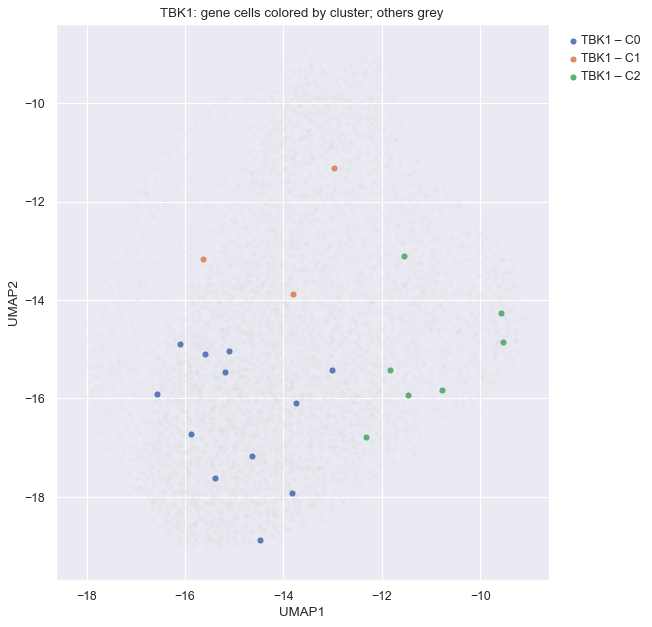

  Selected clusters for TBK1: 0, 2
  Cluster 0: gene n=12, control n=1932
  Cluster 2: gene n=7, control n=1079


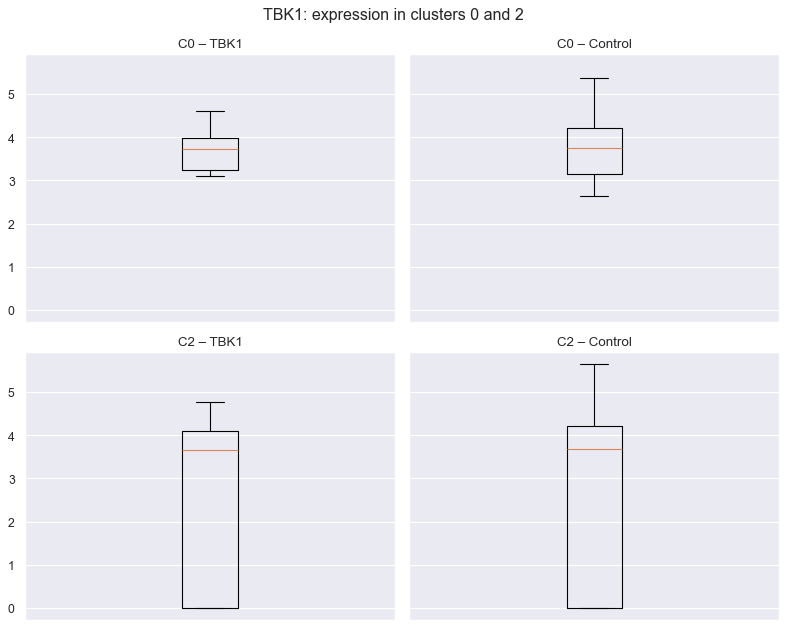


--- TBK1 vs Control in C0 ---
n1=12, n2=1932
p=8.569e-01 (ns)
mean diff=0.2584
effect size d=0.1612

--- TBK1 vs Control in C2 ---
n1=7, n2=1079
p=7.545e-01 (ns)
mean diff=-0.4650
effect size d=-0.2496

--- TBK1 in C0 vs C2 ---
n1=12, n2=7
p=6.712e-01 (ns)
mean diff=1.0811
effect size d=0.6589

--- Control in C0 vs Control in C2  (baseline) ---
n1=1932, n2=1079
p=2.656e-03 (SIGNIFICANT)
mean diff=0.3577
effect size d=0.2092

Processing gene: TICAM1
  [skip] TICAM1 not in adata.var_names (no counts column).

Processing gene: TIRAP
  [skip] TIRAP not in adata.var_names (no counts column).

Processing gene: TLR4
  [skip] TLR4 not in adata.var_names (no counts column).

Processing gene: TRADD
  [skip] TRADD not in adata.var_names (no counts column).

Processing gene: TRAF6
  [skip] TRAF6 not in adata.var_names (no counts column).

Processing gene: TRAM1
  [skip] TRAM1 not in adata.var_names (no counts column).


In [20]:
# ============================================================
# 6. Loop over ALL perturbation genes
# ============================================================
all_genes = sorted(g for g in meta["perturbation"].unique() if g != CONTROL_LABEL)
print("Genes found:", all_genes)

for gene in all_genes:
    print("\n====================================")
    print(f"Processing gene: {gene}")
    print("====================================")

    if gene not in adata.var_names:
        print(f"  [skip] {gene} not in adata.var_names (no counts column).")
        continue

    plot_gene_umap_cluster_vs_grey(adata, gene)

    gene_obs = adata.obs[adata.obs["perturbation"] == gene]
    if gene_obs.shape[0] < 5:
        print(f"  [skip] {gene} has too few cells ({gene_obs.shape[0]}).")
        continue

    ccounts = gene_obs["cluster"].astype(str).value_counts().sort_values(ascending=False)
    if len(ccounts) < 2:
        print(f"  [skip] {gene} appears in only one cluster.")
        continue

    cl1, cl2 = ccounts.index[0], ccounts.index[1]
    print(f"  Selected clusters for {gene}: {cl1}, {cl2}")

    # 3) boxplots
    boxplots_gene_two_clusters(adata, gene, cl1=cl1, cl2=cl2)

    # 4) hypothesis tests
    test_gene_expression(adata, gene, cl1=cl1, cl2=cl2, control_label=CONTROL_LABEL)

In [ ]:
import os
import tempfile

import re
import numpy as np
import requests
import scanpy as sc
import scvi
import seaborn as sns
import torch
import matplotlib.pyplot as plt
import pandas as pd
import anndata as ad
from pathlib import Path

print("Last run with scvi-tools version:", scvi.__version__)

# Some environments (or IPython installs) lack IPython.display.set_matplotlib_formats,
# which scanpy.sc.set_figure_params may call. Provide a safe fallback before calling it.
try:
    sc.set_figure_params(figsize=(8, 6), frameon=False)
except AttributeError:
    try:
        import IPython.display as ipd
        if not hasattr(ipd, "set_matplotlib_formats"):
            def _noop(*args, **kwargs):
                return None
            ipd.set_matplotlib_formats = _noop
    except Exception:
        # If IPython isn't available or another error occurs, ignore and continue.
        pass
    sc.set_figure_params(figsize=(8, 6), frameon=False)

sns.set_theme()
torch.set_float32_matmul_precision("high")
save_dir = './'

# --- paths ---
P           = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")

COUNTS_CSV = "matched_merfishcounttable_xy.csv"   # has: cell_id, X, Y, <genes...>
PERT_MATRIX_CSV = P / "tumorpooledperturbations.csv"       # pooled matrix with control row/col

df = pd.read_csv(COUNTS_CSV)
assert {"cell_id","X","Y"}.issubset(df.columns), "counts CSV must include cell_id, X, Y"

num_cols = [c for c in df.columns if c not in {"cell_id","X","Y"}]
adata = sc.AnnData(df[num_cols].to_numpy())
adata.obs_names = df["cell_id"].astype(str).values
adata.var_names = num_cols
adata.obs["X"] = df["X"].values
adata.obs["Y"] = df["Y"].values
adata.layers["count"] = adata.X.copy()

print(adata)

df = pd.read_csv(PERT_MATRIX_CSV, index_col=0).apply(pd.to_numeric, errors="coerce").fillna(0.0)
perturbation = [df[df[col] >= 1].index[0] for col in df.columns]

adata.obs["perturbation"] = perturbation

sc.pp.filter_genes(adata, min_cells=500)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
print(adata)

from sklearn.neighbors import NearestNeighbors

# Suppose your AnnData object is called `adata`
coords = adata.obs[["X", "Y"]].to_numpy()
is_control = adata.obs["perturbation"] == "Control"

# Coordinates of control cells
control_coords = coords[is_control]
control_expr = adata.X[is_control]

# Fit nearest neighbor search on control cells only
nn = NearestNeighbors(n_neighbors=51, algorithm="auto").fit(control_coords)

# Find the 50 nearest control cells for every cell (including control & perturbed)
distances, indices = nn.kneighbors(coords)

# Compute mean expression of 50 nearest control cells for each cell
# This part depends on whether adata.X is sparse or dense
if hasattr(adata.X, "toarray"):
    X = adata.X.toarray()
else:
    X = adata.X

control_means = []
for i in range(len(indices)):
    if adata.obs["perturbation"][i] == 'Control':
        control_means.append(control_expr[indices[i][1:]].mean(axis=0))
    else:
        control_means.append(control_expr[indices[i][0:50]].mean(axis=0))
control_means = np.array(control_means)

# Subtract control mean expression from each cell’s expression
corrected_X = X - control_means

# Save to a new AnnData object
adata_corrected = ad.AnnData(
    X=corrected_X,
    obs=adata.obs.copy(),
    var=adata.var.copy(),
)

# Store the coordinates as well
adata_corrected.obsm["spatial"] = coords

sc.pp.neighbors(adata_corrected)
sc.tl.umap(adata_corrected)
sc.pl.umap(adata_corrected, color=["perturbation"])
plt.savefig('fig/umap_neighbor_corrected_.png', bbox_inches='tight')

adata_corrected.write_h5ad('data/adata_corrected.h5ad')

###########
#Check if cells with the same perturbation still show different gene expression at different spatial locations after 'removing' the spatial effect,
#that is, see if pertubation effects depend on spatial locations.
umap_coords = adata_corrected.obsm["X_umap"]
X = adata_corrected.X
smoothed_X = np.zeros_like(X)
rng = np.random.default_rng() #seed=42

for group in adata_corrected.obs["perturbation"].unique():
    mask = adata_corrected.obs["perturbation"] == group
    coords_group = adata_corrected.obsm["spatial"][mask]
    expr_group = X[mask]
    n_cells = expr_group.shape[0]

    # Fit nearest neighbors within the group
    smoothed_group = np.zeros_like(expr_group)
    nn = NearestNeighbors(n_neighbors=min(20, len(coords_group)), algorithm="auto").fit(coords_group)

    # Find the 20 nearest cells for every cell within the perturbation group
    distances, indices = nn.kneighbors(coords_group)

    # For each cell, randomly select n_neighbors other cells within the 20 nearest cells in the same group
    for i in range(len(indices)):
        idx = indices[i]
        # Choose random indices excluding self
        possible = np.delete(idx, 0)
        rand_idx = rng.choice(possible, size=min(4, len(possible)), replace=False)
        rand_idx = np.concatenate(([i], rand_idx))
        smoothed_group[i] = expr_group[rand_idx].mean(axis=0)

    # Store back in smoothed matrix
    smoothed_X[mask] = smoothed_group

# --- 4. Create a new AnnData with smoothed expression ---
adata_smoothed = ad.AnnData(
    X=smoothed_X,
    obs=adata_corrected.obs.copy(),
    var=adata_corrected.var.copy(),
)
adata_smoothed.obsm["X_umap"] = adata_corrected.obsm["X_umap"].copy()

sc.pp.neighbors(adata_smoothed)
sc.tl.umap(adata_smoothed)
sc.pl.umap(adata_smoothed, color=["perturbation"])
plt.savefig('fig/umap_neighbor_smoothed_.png', bbox_inches='tight')
###########

center_x = adata.obs["X"].mean()
center_y = adata.obs["Y"].mean()

adata.obs["radial_distance"] = np.sqrt(
    (adata.obs["X"] - center_x)**2 + (adata.obs["Y"] - center_y)**2
)

plt.clf()
adata_smoothed.obs["radial_distance"] = adata.obs["radial_distance"]
perturbed_adata = adata_smoothed[adata_smoothed.obs["perturbation"] != "Control"] 
plt.scatter(perturbed_adata.obsm["X_umap"][:, 0], perturbed_adata.obsm["X_umap"][:, 1], c=perturbed_adata.obs["radial_distance"], cmap="twilight", s=1)
plt.axis("equal")
plt.savefig('fig/umap_neighbor_corrected_neighbor_smooth_spatial_perturb_.png', bbox_inches='tight')

plt.clf()
control_adata = adata_smoothed[adata_smoothed.obs["perturbation"] == "Control"] 
plt.scatter(control_adata.obsm["X_umap"][:, 0], control_adata.obsm["X_umap"][:, 1], c=control_adata.obs["radial_distance"], cmap="twilight", s=1)
plt.axis("equal")
plt.savefig('fig/umap_neighbor_corrected_neighbor_smooth_spatial_control_.png', bbox_inches='tight')

unique_classes = adata_smoothed.obs["perturbation"].unique()

for cls in unique_classes:
    # Create boolean mask for the target class
    mask = adata_smoothed.obs["perturbation"] == cls

    # --- Create figure ---
    plt.figure(figsize=(6, 5))
    plt.scatter(
        adata_smoothed.obsm["X_umap"][:, 0],
        adata_smoothed.obsm["X_umap"][:, 1],
        c="lightgray",
        s=5,
        alpha=0.5,
        label="Other cells"
    )
    plt.scatter(
        adata_smoothed.obsm["X_umap"][mask, 0],
        adata_smoothed.obsm["X_umap"][mask, 1],
        c="red",
        s=10,
        alpha=0.8,
        label=cls
    )
    plt.title(f"UMAP: {cls}")
    plt.axis("off")
    plt.legend(loc="best", frameon=False)

    # --- Save ---
    filename = f"fig/UMAP_{cls.replace(' ', '_')}_neighbor_smooth_.png"
    plt.savefig(filename, bbox_inches="tight", dpi=300)
    plt.close()

adata_smoothed.write_h5ad('data/adata_smoothed.h5ad')

In [ ]:
import os
import tempfile

import re
import numpy as np
import requests
import scanpy as sc
import scvi
import seaborn as sns
import torch
import matplotlib.pyplot as plt
import pandas as pd
import anndata as ad
from pathlib import Path


adata = sc.read_h5ad('data/adata_smoothed.h5ad')
print(adata)

adata.obsm['spatial'] = adata.obs[["X", "Y"]].to_numpy()

pert = 'IRF7'
adata_sub = adata[adata.obs["perturbation"] == pert].copy()

sc.pp.neighbors(
    adata_sub,
    use_rep="X_umap",
    n_neighbors=10,
)

sc.tl.leiden(adata_sub, key_added="cluster_umap", resolution=0.1)

plt.scatter(
    adata.obsm["spatial"][:, 0],
    adata.obsm["spatial"][:, 1],
    s=5,
    c="lightgrey",
    alpha=0.4,
    edgecolor="none",
)

clusters = adata_sub.obs["cluster_umap"]

plt.scatter(
    adata_sub.obsm["spatial"][:, 0],
    adata_sub.obsm["spatial"][:, 1],
    s=8,
    c=clusters.astype("category").cat.codes,  # numerical colors
    cmap="tab20",
    alpha=0.9,
    linewidth=0.1,
)

plt.savefig('de_fig/spatial_' + pert + '_clusters.png', bbox_inches='tight')

umap_all = adata.obsm["X_umap"]
umap_sub = adata_sub.obsm["X_umap"]

plt.figure(figsize=(6, 6))

# --- All cells in grey ---
plt.scatter(
    umap_all[:, 0], umap_all[:, 1],
    c="lightgrey", s=5, alpha=0.4, edgecolor="none"
)

# --- Subset cells in color ---
plt.scatter(
    umap_sub[:, 0], umap_sub[:, 1],
    c=clusters.astype("category").cat.codes,
    cmap="tab20", s=10, alpha=0.9, linewidth=0.1
)

plt.savefig('de_fig/umap_' + pert + '_clusters.png', bbox_inches='tight')

sc.tl.rank_genes_groups(
    adata_sub,
    groupby="cluster_umap",   # cluster labels created earlier
    method="wilcoxon"
)

de = adata_sub.uns["rank_genes_groups"]

groups = de["names"].dtype.names
top5_genes = {g: de["names"][g][:5].tolist() for g in ['0', '1']}

print("Top DE genes per cluster:")
for g in top5_genes.keys():
    print(f"{g}: {top5_genes[g]}")

# Coordinates
sp_all = adata.obsm["spatial"]
sp_sub = adata_sub.obsm["spatial"]

# --- paths ---
P           = Path("/Users/juliachen/Documents/AI4bio/UMAP/tumors/processed/finaltables")

COUNTS_CSV = "matched_merfishcounttable_xy.csv"   # has: cell_id, X, Y, <genes...>
PERT_MATRIX_CSV = P / "tumorpooledperturbations.csv"       # pooled matrix with control row/col

df = pd.read_csv(COUNTS_CSV)
assert {"cell_id","X","Y"}.issubset(df.columns), "counts CSV must include cell_id, X, Y"

num_cols = [c for c in df.columns if c not in {"cell_id","X","Y"}]
adata_ori = sc.AnnData(df[num_cols].to_numpy())
adata_ori.obs_names = df["cell_id"].astype(str).values
adata_ori.var_names = num_cols
adata_ori.obs["X"] = df["X"].values
adata_ori.obs["Y"] = df["Y"].values
adata_ori.layers["count"] = adata_ori.X.copy()

df = pd.read_csv(PERT_MATRIX_CSV, index_col=0).apply(pd.to_numeric, errors="coerce").fillna(0.0)
perturbation = [df[df[col] >= 1].index[0] for col in df.columns]

adata_ori.obs["perturbation"] = perturbation

sc.pp.filter_genes(adata_ori, min_cells=500)
sc.pp.normalize_total(adata_ori)
sc.pp.log1p(adata_ori)

print(adata_ori)

adata_ori_sub = adata_ori[adata_ori.obs["perturbation"] == pert].copy()

adata_corrected = sc.read_h5ad('data/adata_corrected.h5ad')
adata_corrected_sub = adata_corrected[adata_corrected.obs["perturbation"] == pert].copy()

for g in top5_genes.keys():
    top_genes = top5_genes[g]
    for gene in top_genes:
        #expr_all = adata_corrected[:, gene].X.toarray().flatten() if hasattr(adata_corrected[:, gene].X, "toarray") else adata_corrected[:, gene].X
        #expr_sub = adata_corrected_sub[:, gene].X.toarray().flatten() if hasattr(adata_corrected_sub[:, gene].X, "toarray") else adata_corrected_sub[:, gene].X
        expr_all = adata_ori[:, gene].X.toarray().flatten() if hasattr(adata_ori[:, gene].X, "toarray") else adata_ori[:, gene].X
        expr_sub = adata_ori_sub[:, gene].X.toarray().flatten() if hasattr(adata_ori_sub[:, gene].X, "toarray") else adata_ori_sub[:, gene].X

        # -------------------------------
        # Spatial plot
        # -------------------------------
        plt.figure(figsize=(6, 6))

        # All cells (grey background)
        plt.scatter(sp_all[:,0], sp_all[:,1],
                    c=expr_all, cmap="viridis",
                    s=2, alpha=0.6, edgecolor="none")

        # Subset cells colored by expression
        plt.scatter(sp_sub[:,0], sp_sub[:,1],
                    c=expr_sub, cmap="viridis",
                    s=10, alpha=0.9, edgecolor="none")

        plt.gca().invert_yaxis()
        plt.title(f"Spatial expression: {gene}")
        plt.colorbar(label="Expression")
        plt.savefig('de_fig/de_gene_group_' + g + '_' + gene + '_spatial_' + pert + '_clusters.png', bbox_inches='tight')

        # -------------------------------
        # UMAP plot
        # -------------------------------
        plt.figure(figsize=(6, 6))

        plt.scatter(umap_all[:,0], umap_all[:,1],
                    c=expr_all, cmap="viridis",
                    s=2, alpha=0.6, edgecolor="none")

        plt.scatter(umap_sub[:,0], umap_sub[:,1],
                    c=expr_sub, cmap="viridis",
                    s=10, alpha=0.9, edgecolor="none")

        plt.title(f"UMAP expression: {gene}")
        plt.colorbar(label="Expression")
        plt.savefig('de_fig/de_gene_group_' + g + '_' + gene + '_umap_' + pert + '_clusters.png', bbox_inches='tight')
